# **Model**

Ce notebook se focalise sur la recherche du *meilleur* modèle à retenir pour la mise en production.

La première partie "Préparation de la modélisation" passe en revue les étapes de traitement, en expliquant leur finalité, et en justifiant les choix effectués parmi les options disponibles. Ces choix sont effectués en relation avec les spécificités du jeu de données Home Credit et avec le but prédictif (ici de la classification binaire supervisée avec classes déséquilibrées). Par choix, nous entendons celui des stratégies (et leurs implémentations) retenues et celui de leurs paramètres fixés ou restreints à un sous-domaine à explorer lors du benchmark.

La seconde "Evaluation des modèles" se concentre sur la mise en place du *framework* sur la base duquel nous allons effectuer notre recherche en grille, c'est-à-dire un benchmark de modèles dont on fait varier les hyperparamètres dans les domaines retenus dans la première partie. De ce poin de vue, la première partie est bien une spécification fonctionnelle de la seconde qui en est la réalisation. L'ensemble de ces étapes péparatoires qui interviennent en amont de l'entraînement d'un modèle; l'entraînement du modèle et l'évaluation des performance du modèles, sont intégrées dans une fonction principale `home_credit.best_model_search.kfold_eval_model` qui joue le rôle de *pipeline*.

La dernière partie "Benchmark des modèles" évalue et compare les multiples configurations envisagées en vue de déterminer la plus performante d'entre-elles. L'enjeu est ici de bien définir, objectivement, ce que l'on entend par performance. La performance objective a de nombreuses facettes, parfois contradictoires (corrélées négativement). En gagnant d'un côté, on peut perdre de l'autre. Mais pour simplifier, on distingura principalement les performances métier, synthétisée dans une fonction de coût objective qu'il s'agit de minimiser (on pourra ici entendre coût pour l'entreprise), et les performances techniques qui se déclinent spatialement (la quantité de ressources mobilisées, notamment la mémoire) et temporellement (la vélocité de l'exécution).

# Préparation de la modélisation

## Echantillons du jeu d'entraînement 

Avant tout chose, préparons et enregistrons définitivement 6 échantillons (pour chaque version de la préparation des donnée, actuellement une seule, la `baseline`) du jeu d'entraînement. Le complément de chaque échantillon pourra nous servir de jeu de validation, pour évaluer de manière fiable les performance du modèle entraîné, en évacuant tout risque de fuite de donnée et de score biaisé en raison d'un sur apprentissage.

L'entraînement des algorithmes utilisés est de complexité plus que linéaire, et il convient donc de démarrer avec de petits échantillons avant de monter vers des exécutions de l'ordre de 6 heures pour le jeu d'entraînement quasi complet.

Nous définissons 5 échantillons (sous ensembles du jeu d'entraînement, qui comprend $307\,511$ individus, tirés aléatoirement), que nous enregistrons afin de les figer (*) pour obtenir des résultats reproductibles (mais qui ne s'opposent pas à de l'échantillonnage dynamique si tel ou tel stratégie méthodologique le réclame) :
* `_10k` : échantillon de $10\,000$ individus (3.25\,\%$).
* `_100k` : échantillon de $100\,000$ individus (32.5\,\%$).
* `_50pcts` : échantillon de $50\,\%$ de la population ($153\,756$ individus).
* `_75pcts` : échantillon de $75\,\%$ de la population ($230\,633$ individus).
* `_85pcts` : échantillon de $85\,\%$ de la population ($261\,384$ individus).
* `_95pcts` : échantillon de $95\,\%$ de la population ($292\,135$ individus).

(*) La même fixation aurait pu être obtenue avec l'utilisation du paramère `rendom_state=42` en tout endroit où on effectue un exhéntillonnage avec `pandas.DataFrame.sample`, mais la fixation dans un fichier persistant nous a semblé méthodologiquement plus prudent. Dans le cadre d'une pipeline complète intégrée, la réintroduction de ce paramètre, sans passer par une étape de persistance dans un fichier, serait pertinente.

In [20]:
from home_credit.load import load_prep_dataset, save_prep_dataset
data = load_prep_dataset("baseline_v1")
data_train = data[data.TARGET > -1]
save_prep_dataset(data_train, "train_baseline_all")
display(data_train)

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,CC_NAME_CONTRACT_STATUS_Sent_proposal_MIN_nan,CC_NAME_CONTRACT_STATUS_Sent_proposal_MAX_False,CC_NAME_CONTRACT_STATUS_Sent_proposal_MAX_True,CC_NAME_CONTRACT_STATUS_Sent_proposal_MAX_nan,CC_NAME_CONTRACT_STATUS_Signed_MIN_False,CC_NAME_CONTRACT_STATUS_Signed_MIN_True,CC_NAME_CONTRACT_STATUS_Signed_MIN_nan,CC_NAME_CONTRACT_STATUS_Signed_MAX_False,CC_NAME_CONTRACT_STATUS_Signed_MAX_True,CC_NAME_CONTRACT_STATUS_Signed_MAX_nan
0,100002,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461,-637,...,True,False,False,True,False,False,True,False,False,True
1,100003,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765,-1188,...,True,False,False,True,False,False,True,False,False,True
2,100004,0,0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046,-225,...,True,False,False,True,False,False,True,False,False,True
3,100006,0,0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005,-3039,...,False,True,False,False,True,False,False,True,False,False
4,100007,0,0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932,-3038,...,True,False,False,True,False,False,True,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,0,157500.0,254700.0,27558.0,225000.0,0.032561,-9327,-236,...,True,False,False,True,False,False,True,False,False,True
307507,456252,0,0,72000.0,269550.0,12001.5,225000.0,0.025164,-20775,365243,...,True,False,False,True,False,False,True,False,False,True
307508,456253,0,0,153000.0,677664.0,29979.0,585000.0,0.005002,-14966,-7921,...,True,False,False,True,False,False,True,False,False,True
307509,456254,1,0,171000.0,370107.0,20205.0,319500.0,0.005313,-11961,-4786,...,True,False,False,True,False,False,True,False,False,True


In [ ]:
from home_credit.load import save_prep_dataset
data_train_10k = data_train.sample(n=10_000, random_state=42)
save_prep_dataset(data_train_10k, "train_baseline_10k")

In [ ]:
from home_credit.load import save_prep_dataset
data_train_50pcts = data_train.sample(frac=.50, random_state=42)
save_prep_dataset(data_train_50pcts, "train_baseline_50pcts")

In [51]:
from home_credit.load import save_prep_dataset
sample_names = ["10k", "100k", "50pcts", "75pcts", "85pcts", "95pcts"]
for sample_name in sample_names:
    if sample_name[-1:] == "k":
        sample_params = {"n": 1_000*int(sample_name[:-1])}
    elif sample_name[-4:] == "pcts":
        sample_params = {"frac": float(sample_name[:-4])/100}
    else:
        raise ValueError(f"{sample_name} pattern should be \d+(k|pcts)")
    sample_params.update({"random_state": 42})
    sample_fullname = f"train_baseline_{sample_name}"
    data_train_sample = data_train.sample(**sample_params)
    print(f"save {sample_fullname} of shape: {data_train_sample.shape}")
    save_prep_dataset(data_train_sample, sample_fullname)

save train_baseline_10k of shape: (10000, 790)
save train_baseline_100k of shape: (100000, 790)
save train_baseline_50pcts of shape: (153756, 790)
save train_baseline_75pcts of shape: (230633, 790)
save train_baseline_85pcts of shape: (261384, 790)
save train_baseline_95pcts of shape: (292135, 790)


## Chargement des données pré-traitées

In [2]:
from home_credit.load import load_prep_dataset
data = load_prep_dataset("baseline_v1")
display(data)

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,CC_NAME_CONTRACT_STATUS_Sent_proposal_MIN_nan,CC_NAME_CONTRACT_STATUS_Sent_proposal_MAX_False,CC_NAME_CONTRACT_STATUS_Sent_proposal_MAX_True,CC_NAME_CONTRACT_STATUS_Sent_proposal_MAX_nan,CC_NAME_CONTRACT_STATUS_Signed_MIN_False,CC_NAME_CONTRACT_STATUS_Signed_MIN_True,CC_NAME_CONTRACT_STATUS_Signed_MIN_nan,CC_NAME_CONTRACT_STATUS_Signed_MAX_False,CC_NAME_CONTRACT_STATUS_Signed_MAX_True,CC_NAME_CONTRACT_STATUS_Signed_MAX_nan
0,100002,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461,-637,...,True,False,False,True,False,False,True,False,False,True
1,100003,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765,-1188,...,True,False,False,True,False,False,True,False,False,True
2,100004,0,0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046,-225,...,True,False,False,True,False,False,True,False,False,True
3,100006,0,0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005,-3039,...,False,True,False,False,True,False,False,True,False,False
4,100007,0,0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932,-3038,...,True,False,False,True,False,False,True,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
356250,456221,-1,0,121500.0,412560.0,17473.5,270000.0,0.002042,-19970,-5169,...,True,False,False,True,False,False,True,False,False,True
356251,456222,-1,2,157500.0,622413.0,31909.5,495000.0,0.035792,-11186,-1149,...,True,False,False,True,False,False,True,False,False,True
356252,456223,-1,1,202500.0,315000.0,33205.5,315000.0,0.026392,-15922,-3037,...,True,False,False,True,False,False,True,False,False,True
356253,456224,-1,0,225000.0,450000.0,25128.0,450000.0,0.018850,-13968,-2731,...,True,False,False,True,False,False,True,False,False,True


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 356255 entries, 0 to 356254
Columns: 790 entries, SK_ID_CURR to CC_NAME_CONTRACT_STATUS_Signed_MAX_nan
dtypes: bool(169), float64(580), int64(41)
memory usage: 1.7 GB


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
count,356255.000000,356255.000000,356255.000000,3.562550e+05,3.562550e+05,356219.000000,3.559770e+05,356255.000000,356255.000000,356255.000000,...,3.395870e+05,3.395870e+05,3.395780e+05,3.395780e+05,3.395780e+05,3.395870e+05,339578.000000,339578.000000,339587.00000,339587.000000
mean,278128.000000,-0.067140,0.414316,1.701161e+05,5.877674e+05,27425.560657,5.280200e+05,0.020917,-16041.248841,64317.231413,...,1.861577e+04,6.831369e+05,5.282753e+03,1.400438e+05,1.900381e+04,6.904942e+05,-328.433435,-922.095504,-42103.40703,40.064552
std,102842.104413,0.449443,0.720378,2.235068e+05,3.986237e+05,14732.808190,3.660650e+05,0.013915,4358.803980,141705.532576,...,2.346509e+04,8.933805e+05,1.449867e+04,2.496554e+05,2.523135e+04,9.308977e+05,537.367821,597.181989,56863.13532,41.053343
min,100001.000000,-1.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000253,-25229.000000,-17912.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,2.250000e-01,1.890000e-01,0.000000e+00,-3071.000000,-3071.000000,-602499.00000,1.000000
25%,189064.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16731.000000,2.340000e+05,0.010006,-19676.000000,-2781.000000,...,7.897470e+03,1.366834e+05,4.153500e+01,1.439653e+04,7.582365e+03,1.332007e+05,-387.000000,-1312.043107,-49853.00000,12.000000
50%,278128.000000,0.000000,0.000000,1.530000e+05,5.002110e+05,25078.500000,4.500000e+05,0.018850,-15755.000000,-1224.000000,...,1.272616e+04,3.343952e+05,2.323575e+03,3.703561e+04,1.240398e+04,3.248035e+05,-65.000000,-806.576364,-21233.00000,25.000000
75%,367191.500000,0.000000,1.000000,2.025000e+05,7.975575e+05,34960.500000,6.750000e+05,0.028663,-12425.000000,-290.000000,...,2.164516e+04,8.577727e+05,7.158724e+03,1.350000e+05,2.164505e+04,8.497309e+05,-26.000000,-433.857143,-6832.00000,51.000000
max,456255.000000,1.000000,20.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7338.000000,365243.000000,...,2.504590e+06,3.247978e+07,2.504590e+06,3.771488e+06,2.504590e+06,3.268928e+07,-1.000000,-3.000000,0.00000,372.000000


,n,n_u,n_na,Filling rate,Shannon entropy,dtypes
SK_ID_CURR,356255,356255,0,1.0,1.000000,int64
TARGET,356255,3,0,1.0,0.000008,int64
CNT_CHILDREN,356255,16,0,1.0,0.000045,int64
AMT_INCOME_TOTAL,356255,2741,0,1.0,0.007694,float64
AMT_CREDIT,356255,6480,0,1.0,0.018189,float64
...,...,...,...,...,...,...
OCCUPATION_TYPE_IT_staff,356255,2,0,1.0,0.000006,bool
OCCUPATION_TYPE_Laborers,356255,2,0,1.0,0.000006,bool
OCCUPATION_TYPE_Low_skill_Laborers,356255,2,0,1.0,0.000006,bool
OCCUPATION_TYPE_Managers,356255,2,0,1.0,0.000006,bool


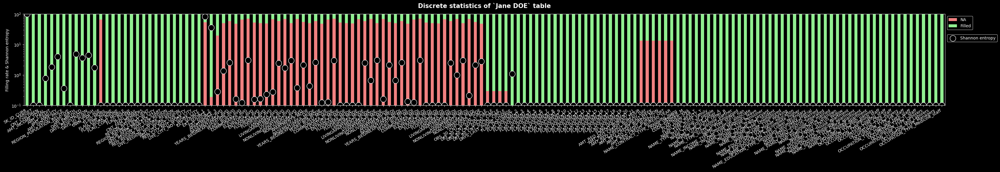

In [ ]:
from pepper.utils import show_discrete_stats
data.info()
display(data.describe())
show_discrete_stats(data[data.columns[:150]], ratio=5)

## Imputation des valeurs manquantes

Hormis quelques exception, les modèles n'aiment pas les valeurs manquantes.

Pour pouvoir passer de la phase d'ingénierie des données à celle de modélisation, il faut s'être d'bord assurés de n'avoir plus de NA. Cela devrait avoir été traité dans le cadre de cette ingénierie, mais il peut rester des reliquats, et pour bien gagder l'entrée de cette phase de modélisation, il est utile de commencer par une passe de vérification (`assert`) et l'application d'une stratégie d'imputation par défaut pour les reliquats de valeurs manquantes.

Par exemple, même si LightGBM accepte des NA, un simple sampling `imblearn`, indispensable dans notre situation de déséquilibre de classes, échouera s'il devait rester des NA :

```
ValueError: Input X contains NaN.

SMOTETomek does not accept missing values encoded as NaN natively.

For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively.

Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values.

See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values
```

Scikit-Learn propose un module `impute` qui propose plusieurs stratégies d'imputations.

Voir la section [**Imputation des valeurs manquantes** (6.4)](https://scikit-learn.org/stable/modules/impute.html) du manuel d'utilisation.

In [28]:
import numpy as np
from home_credit.load import load_prep_dataset
from home_credit.best_model_search import default_imputation

data = load_prep_dataset("baseline_v1")
data = data.sample(10_000)

print("NA or INF before imput:", (data.isna() | np.isinf(data)).any().any())

# Cannot be done inplace
data = default_imputation(data)
data_train = data[data.TARGET > -1]
data_test = data[data.TARGET == -1]

print("NA or INF after imput:", (data.isna() | np.isinf(data)).any().any())

display(data)

NA or INF before imput: True
NA or INF after imput: False


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,CC_NAME_CONTRACT_STATUS_Sent_proposal_MIN_nan,CC_NAME_CONTRACT_STATUS_Sent_proposal_MAX_False,CC_NAME_CONTRACT_STATUS_Sent_proposal_MAX_True,CC_NAME_CONTRACT_STATUS_Sent_proposal_MAX_nan,CC_NAME_CONTRACT_STATUS_Signed_MIN_False,CC_NAME_CONTRACT_STATUS_Signed_MIN_True,CC_NAME_CONTRACT_STATUS_Signed_MIN_nan,CC_NAME_CONTRACT_STATUS_Signed_MAX_False,CC_NAME_CONTRACT_STATUS_Signed_MAX_True,CC_NAME_CONTRACT_STATUS_Signed_MAX_nan
34625,140123.0,0.0,1.0,171000.0,1506816.0,49927.5,1350000.0,0.009630,-13698.0,-2998.0,...,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
131054,252004.0,0.0,0.0,112500.0,808650.0,23773.5,675000.0,0.007120,-22542.0,365243.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
53334,161770.0,0.0,1.0,135000.0,354276.0,22770.0,292500.0,0.006305,-12943.0,-3223.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
251289,390765.0,0.0,0.0,135000.0,640080.0,31261.5,450000.0,0.009657,-20692.0,-1119.0,...,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
278743,422924.0,0.0,0.0,135000.0,1211049.0,35541.0,1057500.0,0.006671,-16617.0,-2373.0,...,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100930,217190.0,0.0,0.0,112500.0,241618.5,23665.5,229500.0,0.010006,-20932.0,-1341.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
236858,374350.0,0.0,2.0,171000.0,533304.0,25785.0,405000.0,0.006207,-11610.0,-1982.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
56810,165835.0,0.0,2.0,184500.0,1206000.0,46066.5,1206000.0,0.010006,-14927.0,-139.0,...,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
178527,306875.0,0.0,0.0,405000.0,545040.0,26509.5,450000.0,0.005313,-10514.0,-2025.0,...,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0


## Réduction de dimentionnalité

Le jeu de données préparée `baseline_v1` contient 790 caractéristiques.

<mark>...freestyle</mark>

Une réduction de dimensionnalité (et par induction, de sparsité) peut améliorer les performances techniques du modèle (espace mémoire, temps d'exécution) mais également la performance métier en réduisant le risque de sur-apprentissage (mémorisation des données plutôt que généralisation).

Voir cet article de Wikipedia à propos du fléau ou malédiction de la dimension [**Curse of dimensionality**](https://en.wikipedia.org/wiki/Curse_of_dimensionality)

Avec un jeu de données d'environ 800 colonnes par 300 000 lignes, il est clair que la réduction de dimensionnalité peut aider à accélérer l'entraînement du modèle et à améliorer les performances.

Une approche de réduction de dimensionnalité linéaire, comme l'analyse en composantes principales (PCA), peut être un bon point de départ. PCA permet de transformer les données en un espace de dimensions réduites, en maximisant la variance des données projetées sur ces dimensions réduites. Cette approche est simple à mettre en œuvre et est bien adaptée aux jeux de données de grande dimension.

Cependant, il peut y avoir des cas où la structure sous-jacente des données n'est pas linéaire, et cela semble être le cas notamment pour les 3 sources externes de scoring client qui caracolent en têtre des caractéristiques importantes (les facteurs les plus déterminants de la prédiction). Il est donc très probable qu'une approche non linéaire telle que t-SNE (t-Distributed Stochastic Neighbor Embedding) sera plus appropriée. t-SNE est capable de préserver les relations non linéaires entre les données, mais il peut être plus coûteux en temps de calcul que PCA.

Notons que la réduction de dimensionnalité peut entraîner une perte d'information, il conviendra donc d'avaluer son impact sur les performances dans le cadre du benchmark.

**TODO**

In [9]:
from home_credit.load import load_prep_dataset

data = load_prep_dataset("baseline_v1")
display(data[data.TARGET > -1])
display(data[data.TARGET == 1])

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,CC_NAME_CONTRACT_STATUS_Sent_proposal_MIN_nan,CC_NAME_CONTRACT_STATUS_Sent_proposal_MAX_False,CC_NAME_CONTRACT_STATUS_Sent_proposal_MAX_True,CC_NAME_CONTRACT_STATUS_Sent_proposal_MAX_nan,CC_NAME_CONTRACT_STATUS_Signed_MIN_False,CC_NAME_CONTRACT_STATUS_Signed_MIN_True,CC_NAME_CONTRACT_STATUS_Signed_MIN_nan,CC_NAME_CONTRACT_STATUS_Signed_MAX_False,CC_NAME_CONTRACT_STATUS_Signed_MAX_True,CC_NAME_CONTRACT_STATUS_Signed_MAX_nan
0,100002,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461,-637,...,True,False,False,True,False,False,True,False,False,True
1,100003,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765,-1188,...,True,False,False,True,False,False,True,False,False,True
2,100004,0,0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046,-225,...,True,False,False,True,False,False,True,False,False,True
3,100006,0,0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005,-3039,...,False,True,False,False,True,False,False,True,False,False
4,100007,0,0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932,-3038,...,True,False,False,True,False,False,True,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,0,157500.0,254700.0,27558.0,225000.0,0.032561,-9327,-236,...,True,False,False,True,False,False,True,False,False,True
307507,456252,0,0,72000.0,269550.0,12001.5,225000.0,0.025164,-20775,365243,...,True,False,False,True,False,False,True,False,False,True
307508,456253,0,0,153000.0,677664.0,29979.0,585000.0,0.005002,-14966,-7921,...,True,False,False,True,False,False,True,False,False,True
307509,456254,1,0,171000.0,370107.0,20205.0,319500.0,0.005313,-11961,-4786,...,True,False,False,True,False,False,True,False,False,True


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,CC_NAME_CONTRACT_STATUS_Sent_proposal_MIN_nan,CC_NAME_CONTRACT_STATUS_Sent_proposal_MAX_False,CC_NAME_CONTRACT_STATUS_Sent_proposal_MAX_True,CC_NAME_CONTRACT_STATUS_Sent_proposal_MAX_nan,CC_NAME_CONTRACT_STATUS_Signed_MIN_False,CC_NAME_CONTRACT_STATUS_Signed_MIN_True,CC_NAME_CONTRACT_STATUS_Signed_MIN_nan,CC_NAME_CONTRACT_STATUS_Signed_MAX_False,CC_NAME_CONTRACT_STATUS_Signed_MAX_True,CC_NAME_CONTRACT_STATUS_Signed_MAX_nan
0,100002,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461,-637,...,True,False,False,True,False,False,True,False,False,True
26,100031,1,0,112500.0,979992.0,27076.5,702000.0,0.018029,-18724,-2628,...,True,False,False,True,False,False,True,False,False,True
40,100047,1,0,202500.0,1193580.0,35028.0,855000.0,0.025164,-17482,-1262,...,False,True,False,False,True,False,False,False,True,False
42,100049,1,0,135000.0,288873.0,16258.5,238500.0,0.007305,-13384,-3597,...,False,True,False,False,True,False,False,True,False,False
81,100096,1,0,81000.0,252000.0,14593.5,252000.0,0.028663,-24794,365243,...,True,False,False,True,False,False,True,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307448,456186,1,1,207000.0,450000.0,32746.5,450000.0,0.020246,-9918,-3048,...,False,True,False,False,True,False,False,True,False,False
307475,456215,1,1,144000.0,1303200.0,46809.0,1125000.0,0.007330,-13416,-2405,...,False,True,False,False,True,False,False,True,False,False
307481,456225,1,0,225000.0,297000.0,19975.5,297000.0,0.008575,-20644,-3147,...,False,True,False,False,True,False,False,True,False,False
307489,456233,1,0,225000.0,521280.0,23089.5,450000.0,0.014464,-16471,-286,...,False,True,False,False,True,False,False,True,False,False


## Echantillonnage avec rééquilibrage de classes

**Pour la note de synthèse** :

Les deux classes cibles sont déséquilibrées : les clients défaillants ne représentent que $8\,\%$ des clients.

Ce sont pourtant ces clients qu'il faut spécialement pouvoir identifier en minimisant les faux négatifs plutôt que les faux positifs.

Pour entraîner un modèle à reconnaître ces cas de défaillance, il convient de lui fournir un échantillon ré-équilibré (où la moitié de l'effectif correspond à ces cas de défaillance).

Il existe plusieurs techniques de sous-échantillonnage (par exemple le sous-échantillonnage aléatoire ou le NearMiss), sur-échantillonnage (par exemple SMOTE et ses variantes) et combinées des deux (par exemple SMOTETomek).

La plupart de ces techniques sont mises en oeuvre par la librairie [**`imblearn`**](https://imbalanced-learn.org/stable/install.html) que nous allons utiliser.

Ces techniques ne se valent pas toutes et ont chacune leurs avantages et inconvénients qui doivent orienter le choix de l'une plutôt que l'autre. Parmi les critères importants à évaluer en vue de prendre une décision, on peut citer : la taille du jeu de données rééchantillonné, la performance temps de l'exécution, la bonne représentation de la classe majoritaire vs. minoritaire, la capacité à éliminer le bruit et l'ambiguïté, comportement face à des classes qui se chevauchent (mauvaise séparabilité).

Nous utilisons le *resampling* dans deux étapes clés de la chaîne de production du modèle :
* En amont de son entraînement, pour présenter un jeu rééquilibré à notre entraînement avec validation croisée.
* En aval de son entraînement, pour l'évaluer de manière objective, et notamment pour produire des évaluations classiques signifiantes (precision, recall, Fbeta, etc), lesquelles sont toutes susceptibles de ne plus l'être (exception notable pour la ROC AUC) lorsque les classes sont fortement déséquilibrées.

Dans les deux cas, nous avons choisi, après avoir évalué une approche mixte (sur et sous échentillonnage) de ne faire que du [**sous-échantillonnage**](https://imbalanced-learn.org/dev/under_sampling.html). Deux raisons déterminantes :
1. l'inflation sinon du nombre d'échantillons à passer à l'entraînement comme à l'évaluation, qui démultiplie naturellement le temps d'exécution sans apporter de gain notable sur la performance du modèle.
2. la complexité lagorithmique et donc le temps d'éxécution important des méthodes mixtes, qui passent de toutes façons par une phase d'expansion avant de réduire l'échantillon retouché à sa taille initiale.

Nous avons estimé qu'avec un maximum de $24\, 825$ échantillons positifs, associés avec autant de négatifs bien séparés par le rééchantilonnage, nous avions le meilleur rapport bénéfice / coût.

Il a donc s'agit ensuite de choisir la méthode de sous-échantillonnage la plus adaptée à notre jeu de données. Voici en résumé des avantages et inconvénients des différentes méthodes classiques. 

Il existe deux grandes familles d'algorithmes de sous-échantillonnage :
1. les techniques qui se concentrent sur la suppression de certaines instances de la classe majoritaire pour améliorer la performance du modèle : `RandomUnderSampler`, `TomekLinks`, etc.
2. les algorithmes appelés "cleaning rule", qui se concentrent sur la suppression des instances mal classées ou bruyantes des ensembles de données pour améliorer la performance du modèle : `AllKNN`, `RENN`, `NCR`. Ces techniques sont généralement plus sophistiquées et peuvent offrir de meilleurs résultats que les techniques d'undersampling simples, mais elles peuvent également être plus coûteuses en termes de temps de calcul.

### Principe, avantages et inconvénients des techniques de suppression

* [**`RandomUnderSampler`**](https://imbalanced-learn.org/dev/references/generated/imblearn.under_sampling.RandomUnderSampler.html) : cette méthode consiste à supprimer aléatoirement des échantillons de la classe majoritaire. Elle est simple à utiliser et rapide à exécuter, mais peut entraîner une baisse de la précision en raison de la perte d'informations importantes dans la classe majoritaire, et elle peut ne pas être efficace si les classes sont fortement chevauchantes.
* [**`TomekLinks`**](https://imbalanced-learn.org/dev/references/generated/imblearn.under_sampling.TomekLinks.html) : cette méthode utilise les liens de Tomek pour identifier les échantillons de la classe majoritaire qui se trouvent à proximité de la classe minoritaire, puis les supprime. Elle est efficace pour éliminer les échantillons ambigus et améliorer la séparation des classes, mais elle peut aussi éliminer des échantillons importants et ne fonctionne pas bien si les classes ne sont pas linéairement séparables.
* [**`NearMiss`**](https://imbalanced-learn.org/dev/references/generated/imblearn.under_sampling.NearMiss.html) : cette méthode est basée sur le calcul des distances entre les échantillons de la classe majoritaire et la classe minoritaire, puis elle supprime les échantillons de la classe majoritaire les plus proches de la classe minoritaire. Elle est simple et rapide à utiliser, mais elle peut également entraîner une perte d'informations importantes et ne fonctionne pas bien si les classes se chevauchent. il existe plusieurs variantes de cette méthode (NearMiss-1, NearMiss-2, NearMiss-3) qui diffèrent dans leur approche pour sélectionner les échantillons à supprimer. Chacune de ces variantes peut avoir ses propres avantages et inconvénients en fonction de la structure des données.
* [**`CondensedNearestNeighbour`**](https://imbalanced-learn.org/dev/references/generated/imblearn.under_sampling.CondensedNearestNeighbour.html) : cette méthode utilise le classifieur kNN pour sélectionner les échantillons de la classe majoritaire qui sont proches de la classe minoritaire, tout en assurant que la représentation globale de la classe majoritaire est conservée. Elle est efficace pour préserver les informations importantes de la classe majoritaire, mais elle peut être coûteuse en termes de temps de calcul.
* [**`EditedNearestNeighbours`**](https://imbalanced-learn.org/dev/references/generated/imblearn.under_sampling.EditedNearestNeighbours.html) : cette méthode utilise le classifieur kNN pour supprimer les échantillons de la classe majoritaire qui sont mal classés par rapport à la classe minoritaire. Elle est efficace pour éliminer les échantillons bruyants, mais elle peut également éliminer des échantillons importants et ne fonctionne pas bien si les classes se chevauchent.
* [**`OneSidedSelection`**](https://imbalanced-learn.org/dev/references/generated/imblearn.under_sampling.OneSidedSelection.html) : cette méthode utilise le classifieur kNN pour sélectionner les échantillons de la classe majoritaire qui sont proches de la classe minoritaire, tout en assurant une bonne représentation globale de la classe majoritaire. Elle est efficace pour préserver les informations importantes de la classe majoritaire et fonctionne bien si les classes se chevauchent, mais elle peut être coûteuse en termes de temps de calcul.
* [**`InstanceHardnessThreshold`**](https://imbalanced-learn.org/dev/references/generated/imblearn.under_sampling.InstanceHardnessThreshold.html) : cette méthode utilise un seuil de dureté pour identifier les échantillons difficiles à classifier, puis elle les supprime de la classe majoritaire. Elle est efficace pour éliminer les échantillons bruyants et les échantillons ambigus, mais

### Principe, avantages et inconvénients des algorithmes "cleaning rule"

[**`AllKNN`**](https://imbalanced-learn.org/dev/references/generated/imblearn.under_sampling.AllKNN.html), [**`RepeatedEditedNearestNeighbours`** (RENN)](https://imbalanced-learn.org/dev/references/generated/imblearn.under_sampling.RepeatedEditedNearestNeighbours.html) et [**`NeighbourhoodCleaningRule`** (NCR)](https://imbalanced-learn.org/dev/references/generated/imblearn.under_sampling.NeighbourhoodCleaningRule.html) sont des algorithmes d'apprentissage supervisé utilisés dans la classification et la régression. Ils appartiennent tous les trois à la famille des algorithmes de nettoyage des données (*data cleaning*).

Le principe de base de ces algorithmes est d'identifier les observations qui sont des outliers ou qui sont mal étiquetées (bruit) dans un ensemble de données et de les supprimer afin d'améliorer la qualité des données pour l'apprentissage.

Le principe de `AllKNN` est de trouver les $k$ plus proches voisins de chaque observation et de les comparer à l'observation elle-même. Si les $k$ voisins les plus proches sont différents de l'observation, alors l'observation est considérée comme une erreur et elle est supprimée de l'ensemble de données.

Le principe de `RENN` est similaire à celui de `AllKNN`, mais il utilise un processus itératif pour supprimer les erreurs. Il trouve les $k$ plus proches voisins de chaque observation, puis les compare à l'observation elle-même. Si les $k$ voisins les plus proches sont différents de l'observation, alors l'observation est supprimée de l'ensemble de données. Ce processus est répété jusqu'à ce qu'il n'y ait plus d'erreurs.

Le principe de `NCR` est de trouver les $k$ plus proches voisins de chaque observation, puis de supprimer les observations qui ont des étiquettes différentes de celles de la majorité de leurs voisins. Cela permet de supprimer les erreurs et les outliers de manière plus précise que les autres algorithmes.

Les avantages de ces algorithmes sont qu'ils peuvent améliorer la qualité des données pour l'apprentissage, réduire le surapprentissage (*overfitting*) et améliorer les performances des modèles de classification ou de régression.

Cependant, leur inconvénient principal est que la suppression d'observations peut entraîner une perte d'informations importantes pour l'apprentissage et conduire à des modèles sous-optimaux. Il est donc important de trouver le bon équilibre entre la suppression des erreurs et la conservation des informations importantes pour l'apprentissage.

### Exemple de sous-échantillonnage

Exemple d'utilisation de [**`RandomUnderSampler`**](https://imbalanced-learn.org/stable/references/generated/imblearn.under_sampling.RandomUnderSampler.html) (extrait de la documentation de l'API).

In [ ]:
from collections import Counter
from sklearn.datasets import make_classification
from imblearn.under_sampling import RandomUnderSampler
X, y = make_classification(
    n_classes=2, class_sep=2,
    weights=[0.1, 0.9], n_informative=3, n_redundant=1, flip_y=0,
    n_features=20, n_clusters_per_class=1, n_samples=1000, random_state=10
)
print('Original dataset shape %s' % Counter(y))

rus = RandomUnderSampler(random_state=42)
X_res, y_res = rus.fit_resample(X, y)
print('Resampled dataset shape %s' % Counter(y_res))

Original dataset shape Counter({1: 900, 0: 100})
Resampled dataset shape Counter({0: 100, 1: 100})


### Exemple de sur-échantillonnage

Exemple d'utilisation de [**`SMOTE`**](https://imbalanced-learn.org/stable/references/generated/imblearn.over_sampling.SMOTE.html) (extrait de la documentation de l'API).

In [ ]:
from collections import Counter
from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE
X, y = make_classification(n_classes=2, class_sep=2,
weights=[0.1, 0.9], n_informative=3, n_redundant=1, flip_y=0,
n_features=20, n_clusters_per_class=1, n_samples=1000, random_state=10)
print('Original dataset shape %s' % Counter(y))

sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(X, y)
print('Resampled dataset shape %s' % Counter(y_res))

Original dataset shape Counter({1: 900, 0: 100})
Resampled dataset shape Counter({0: 900, 1: 900})


### Exemple hybride

Exemple d'utilisation de [**`SMOTETomek`**](https://imbalanced-learn.org/stable/references/generated/imblearn.combine.SMOTETomek.html) (extrait de la documentation de l'API).

In [ ]:
from collections import Counter
from sklearn.datasets import make_classification
from imblearn.combine import SMOTETomek
X, y = make_classification(n_classes=2, class_sep=2,
weights=[0.1, 0.9], n_informative=3, n_redundant=1, flip_y=0,
n_features=20, n_clusters_per_class=1, n_samples=1000, random_state=10)
print('Original dataset shape %s' % Counter(y))

smt = SMOTETomek(random_state=42)
X_res, y_res = smt.fit_resample(X, y)
print('Resampled dataset shape %s' % Counter(y_res))

Original dataset shape Counter({1: 900, 0: 100})
Resampled dataset shape Counter({0: 900, 1: 900})


## Partition du jeu de données

Pas grand chose à dire à ce sujet, c'est standard : séparation fixée entre le jeu d'entraînement et le jeu de test à soumettre aux évaluateurs de la compétition.

Et plus spécifiquement, équilibrage de l'échantillonage, kfold stratifié.

## Choix du normalisateur des données

Cela se joue a priori entre le `StandardScaler` et le `MinMaxScaler`.

Mais ce ne sont pas les deux seules options à envisager.

Le choix entre StandardScaler et MinMaxScaler dépend de la distribution des données et des algorithmes utilisés.

Si les données suivent approximativement une distribution normale et que les valeurs des caractéristiques ont des écarts types différents, alors le `StandardScaler` est une bonne option car il va centrer les données autour de zéro et les mettre à l'échelle en divisant par l'écart-type. Cela permettra à nos algorithmes de prendre en compte les écarts types des caractéristiques et de les mettre à la même échelle. Les algorithmes qui fonctionnent bien avec des données centrées autour de zéro sont, par exemple, la régression logistique et les réseaux de neurones.

Si les données ne suivent pas approximativement une distribution normale, ou que les données incluent des valeurs aberrantes (outliers), alors le `MinMaxScaler` est une meilleure option car il va mettre toutes les caractéristiques sur la même échelle en les ramenant entre 0 et 1. Les algorithmes qui fonctionnent bien avec des données mises à l'échelle de cette manière sont, par exemple, les arbres de décision et les forêts aléatoires.

Dans notre cas, étant donné que nous avons de nombreuses caractéristiques binaires issues du hot encoding, le `MinMaxScaler` peut être une meilleure option car il va ramener toutes les caractéristiques sur la même échelle et faciliter l'interprétation de l'importance des caractéristiques dans nos modèles. Cependant, il peut être intéressant de tester les deux options pour voir laquelle fonctionne le mieux suivant nos données et nos algorithmes.

Les autres options à envisager:
* `RobustScaler`: Il est similaire à StandardScaler mais utilise la médiane et le quantile au lieu de la moyenne et de l'écart type. Il est plus robuste aux valeurs aberrantes que `StandardScaler`.
* `MaxAbsScaler`: Il divise chaque valeur par la valeur absolue maximale de chaque colonne. Il est utile pour les données très dispersées avec des valeurs beaucoup plus grandes que les autres.
* `PowerTransformer`: Il peut effectuer une transformation de puissance sur les données pour les rendre plus gaussiennes. Il est utile pour les modèles qui supposent une distribution gaussienne des données telles que la régression linéaire et la régression logistique.
* `QuantileTransformer`: Il transforme les données en fonction de la densité de probabilité estimée de chaque fonction de distribution marginale. Il est utile pour les modèles qui supposent une distribution uniforme des données.

Chaque *scaler* sera plus ou moins adapté suivant le couple d'un jeu de caractéristiques et d'un modèle.

Il s'agit donc de faire d'une part des choix éclairés par les connaissances que l'on a des données et des modèles, mais surtout, de s'inscrire pleinement dans une démarche empirique (recherche en grille sur la base d'un pipeline paramétrique (qui permet de faire varier les combinaisons données-scaler-modèle)).

# Evaluation des modèles

Nous généralisons la fonction `kfold_lightgbm` qui nous a largement inspirés, ce qu'il faut bien lui reconnaître.

En effet, comment motiver les passionnés qui partagent leurs connaissances et savoir-faires avec la communauté sans contrepartie financière directe, à persister dans cette démarche, si on ne leur reconnaît pas au moins la paternité de leurs créations ? Nous vivons une époque cynique et outrancière, n'en soyons pas complices.

L'auteur de ce noyau de référence qui a inspiré nombre de compétiteurs est https://www.kaggle.com/code/jsaguiar

Dans cette généralisation, nous apportons les éléments suivants :
* passage du classifieur en paramètre (généralisation), pour être en mesure de réaliser notre benchmark compétitif,
* échantillonnage qui rééquilibre les deux classes, avec un paramètre pour passer un sampler `imblearn` paramétré avec une stratégie,
* normalisation des données à l'aide d'un *scaler* également passé en paramètre
* passage d'une fonction de perte *métier* spécifique en remplacement de l'AUC ROC par défaut
* ajout de mesures supplémentaires pour mettre en évidence les performances : on commence avec un F beta score avec un beta >= 1 pour favoriser la précision sur le rappel (les faux positifs sont préférables sur les faux négatifs, il s'agit donc de favoriser le score de précision sur le score de rappel par rapport au score F1 (F beta avec beta=1))
* retour d'un dictionnaire comprenant :
    * la prédiction sur le jeu de test
    * l'importance des catactéristiques
    * chacun des scores, par fold et global, pour chacune des mesures : AUC ROC, Fbeta, etc
* Externalisation pour un traitement spécifiques et optionnel:
    * de l'enregistrement et de la soumission des prédictions sur le jeu de test,
    * des affichages : les rapport graphiques
    * qui seront produits par des fonctions ad hoc sur la base des résultats produits par cette fonction.

Cela donne cette fonction `kfold_eval_model` du module `home_credit.best_model_search`.

Testons cette fonction à périmètre fonctionnel constant, de sorte à obtenir les mêmes résultats qu'avec `kfold_lightgbm` sur un échantillon de $10\,000$ individus.

In [6]:
from home_credit.load import load_prep_dataset
data = load_prep_dataset("baseline_v1")
data = data.sample(10_000)
display(data.head(1))

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,CC_NAME_CONTRACT_STATUS_Sent_proposal_MIN_nan,CC_NAME_CONTRACT_STATUS_Sent_proposal_MAX_False,CC_NAME_CONTRACT_STATUS_Sent_proposal_MAX_True,CC_NAME_CONTRACT_STATUS_Sent_proposal_MAX_nan,CC_NAME_CONTRACT_STATUS_Signed_MIN_False,CC_NAME_CONTRACT_STATUS_Signed_MIN_True,CC_NAME_CONTRACT_STATUS_Signed_MIN_nan,CC_NAME_CONTRACT_STATUS_Signed_MAX_False,CC_NAME_CONTRACT_STATUS_Signed_MAX_True,CC_NAME_CONTRACT_STATUS_Signed_MAX_nan
225876,361628,0,0,90000.0,308133.0,14953.5,234000.0,0.016612,-15873,-8564,...,True,False,False,True,False,False,True,False,False,True


## Isofonctionnalité avec `lightgbm_kernel.kfold_lightgbm`

<mark>**TODO** Améliorer les traces (post soutenance)</mark>

In [7]:
from home_credit.best_model_search import kfold_train_and_eval_model
from home_credit.lightgbm_kernel_v2 import get_opt_lgbm_classifier
clf = get_opt_lgbm_classifier()
res = kfold_train_and_eval_model(
    data, clf, imb_sampler=None, scaler=None,
    verbosity=3
)


Starting train and eval of:
Labeled dataset of shape: (10000, 790)
Features set of shape: (10000, 788)

With:
Classifier: 


LGBMClassifier(callbacks=None, colsample_bytree=0.9497036, learning_rate=0.02,
               max_depth=8, min_child_weight=39.3259775,
               min_split_gain=0.0222415, n_estimators=10000, n_jobs=4,
               num_leaves=34, reg_alpha=0.041545473, reg_lambda=0.0735294,
               subsample=0.8715623)

Loss function: 


{'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

Eval metrics: 


{'F2': <function home_credit.best_model_search.<lambda>(y_valid, y_pred)>,
 'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

On 5 KFolds: 



'You should consider to pass a `imblearn` resampler through the `imb_sampler` parameter.'


Train vs. test subsets shapes
	Train shape: (8605, 788)
	Test shape: (1395, 788)

Evaluate the 1-th fold (on 5)
[200]	training's binary_logloss: 0.209714	valid_1's binary_logloss: 0.247878
Fold  0 F2: 0.000000
Fold  0 AUC: 0.730760

Evaluate the 2-th fold (on 5)
[200]	training's binary_logloss: 0.213283	valid_1's binary_logloss: 0.234768
[400]	training's binary_logloss: 0.186137	valid_1's binary_logloss: 0.2357
Fold  1 F2: 0.019231
Fold  1 AUC: 0.759607

Evaluate the 3-th fold (on 5)
[200]	training's binary_logloss: 0.20929	valid_1's binary_logloss: 0.253238
Fold  2 F2: 0.008787
Fold  2 AUC: 0.750649

Evaluate the 4-th fold (on 5)
[200]	training's binary_logloss: 0.209543	valid_1's binary_logloss: 0.25362
[400]	training's binary_logloss: 0.18269	valid_1's binary_logloss: 0.256464
Fold  3 F2: 0.000000
Fold  3 AUC: 0.746350

Evaluate the 5-th fold (on 5)
[200]	training's binary_logloss: 0.210569	valid_1's binary_logloss: 0.244876
[400]	training's binary_logloss: 0.18439	valid_1's binary

### Extraction des résultats

In [8]:
resamples = res["resamples"]
preds = res["preds"]
scores = res["scores"]
feat_imps = res["feat_imps"]

X_train = resamples["X_train"]
X_test = resamples["X_test"]
y_train = resamples["y_train"]

train_preds = preds["train"]
test_preds = preds["test"]

train_pred_proba = train_preds["proba"]
train_pred_discr = train_preds["discr"]

test_pred_proba = test_preds["proba"]
test_pred_discr = test_preds["discr"]

La classe minoritaire est prédite dans moins de $0.5\,\%$ des cas sur le jeu d'entraînement et jamais sur le jeu de test : c'est une conséquence directe du déséquilibre de classes!

In [9]:
import numpy as np
display(train_pred_proba)
display(np.unique(train_pred_discr, return_counts=True))
display(test_pred_proba)
display(np.unique(test_pred_discr, return_counts=True))

array([0.01886309, 0.03073775, 0.01901879, ..., 0.01865922, 0.02502743,
       0.07552042])

(array([0., 1.]), array([8600,    5], dtype=int64))

array([0.03385028, 0.22384651, 0.04483355, ..., 0.07596373, 0.0500324 ,
       0.18335337])

(array([0.]), array([1395], dtype=int64))

### Visualisation de l'importance des caractéristiques

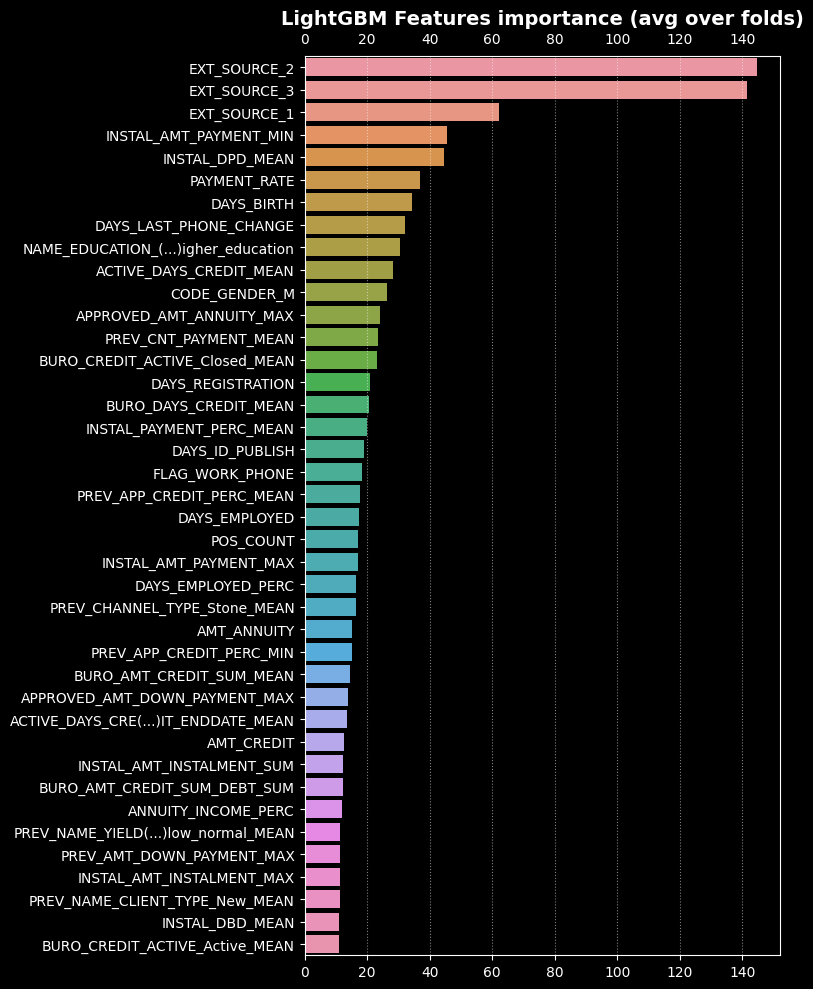

In [10]:
from home_credit.lightgbm_kernel_v2 import display_importances
selected_best_feats = display_importances(feat_imps)

### Affichage des scores par pli et globaux

In [11]:
display(scores)

{'F2': {'over_folds': [0.0,
   0.019230769230769232,
   0.008787346221441126,
   0.0,
   0.0],
  'overall': 0.005472455308281649},
 'AUC': {'over_folds': [0.7307598897762831,
   0.7596071442483737,
   0.7506489220312376,
   0.7463495075449534,
   0.765373946002362],
  'overall': 0.7505985643315459}}

### Affichage de la courbe ROC

overall AUC verif: 0.7505985643315459


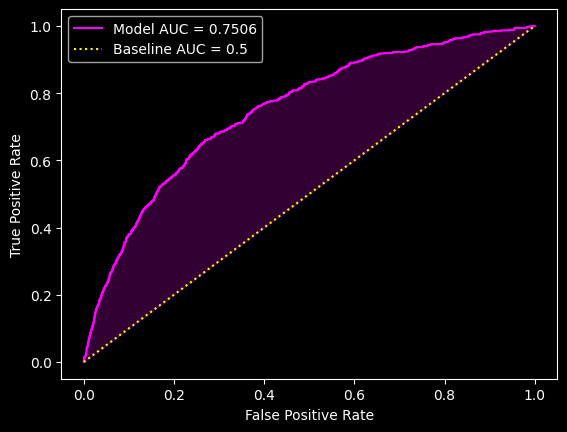

In [12]:
from home_credit.best_model_search import plot_roc_curve
from sklearn.metrics import roc_auc_score
y_train = res["resamples"]["y_train"]
train_pred_proba = res["preds"]["train"]["proba"]
overall_auc = res["scores"]['AUC']['overall']
print("overall AUC verif:", roc_auc_score(y_train, train_pred_proba))
plot_roc_curve(y_train, train_pred_proba, overall_auc)

## Effet du ré-échantillonage

<mark>**TODO** Faire taire les traces de LGBM si verbosity=0 (après soutenance)</mark>

In [13]:
from home_credit.load import load_prep_dataset
from home_credit.best_model_search import kfold_train_and_eval_model
from home_credit.lightgbm_kernel_v2 import get_opt_lgbm_classifier

data = load_prep_dataset("baseline_v1")
data = data.sample(10_000)
clf = get_opt_lgbm_classifier()
res = kfold_train_and_eval_model(
    data, clf, scaler=None,
    verbosity=3
)


Starting train and eval of:
Labeled dataset of shape: (10000, 790)
Features set of shape: (10000, 788)

With:
Classifier: 


LGBMClassifier(callbacks=None, colsample_bytree=0.9497036, learning_rate=0.02,
               max_depth=8, min_child_weight=39.3259775,
               min_split_gain=0.0222415, n_estimators=10000, n_jobs=4,
               num_leaves=34, reg_alpha=0.041545473, reg_lambda=0.0735294,
               subsample=0.8715623)

Loss function: 


{'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

Eval metrics: 


{'F2': <function home_credit.best_model_search.<lambda>(y_valid, y_pred)>,
 'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

On 5 KFolds: 

Resampling
Sampler: 


SMOTETomek()

Original dataset shape: Counter({0.0: 7898, -1.0: 1379, 1.0: 723})
Resampled dataset shape: Counter({1.0: 7675, -1.0: 7665, 0.0: 7568})

Train vs. test subsets shapes
	Train shape: (15243, 788)
	Test shape: (7665, 788)

Evaluate the 1-th fold (on 5)
[200]	training's binary_logloss: 0.144589	valid_1's binary_logloss: 0.18575
[400]	training's binary_logloss: 0.104959	valid_1's binary_logloss: 0.164252
[600]	training's binary_logloss: 0.0884584	valid_1's binary_logloss: 0.161597
[800]	training's binary_logloss: 0.0772599	valid_1's binary_logloss: 0.16088
[1000]	training's binary_logloss: 0.0688881	valid_1's binary_logloss: 0.160776
Fold  0 F2: 0.915981
Fold  0 AUC: 0.974638

Evaluate the 2-th fold (on 5)
[200]	training's binary_logloss: 0.148935	valid_1's binary_logloss: 0.169165
[400]	training's binary_logloss: 0.109097	valid_1's binary_logloss: 0.143482
[600]	training's binary_logloss: 0.0922306	valid_1's binary_logloss: 0.137708
[800]	training's binary_logloss: 0.0808292	valid_1's bina

Avec un AUC de 0.98, il y a probablement du sur-apprentissage, ce qui n'est surprenant avec une échentillon aussi réduit.

Cela dit, l'impact du rééquilibrage des classes est manifeste.

overall AUC verif: 0.981197102836562


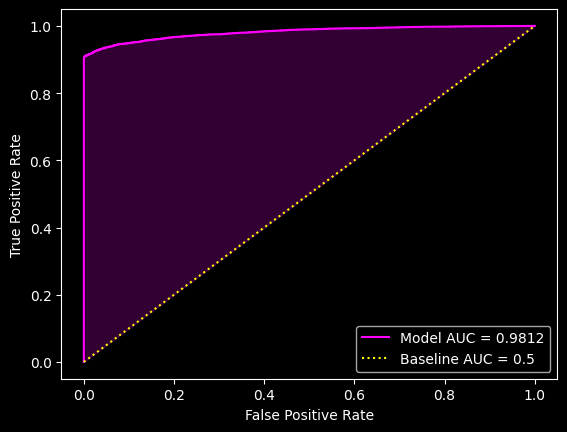

In [14]:
from home_credit.best_model_search import plot_roc_curve
from sklearn.metrics import roc_auc_score
y_train = res["resamples"]["y_train"]
train_pred_proba = res["preds"]["train"]["proba"]
overall_auc = res["scores"]['AUC']['overall']
print("overall AUC verif:", roc_auc_score(y_train, train_pred_proba))
plot_roc_curve(y_train, train_pred_proba, overall_auc)

Matrice de confusion


Confusion matrix


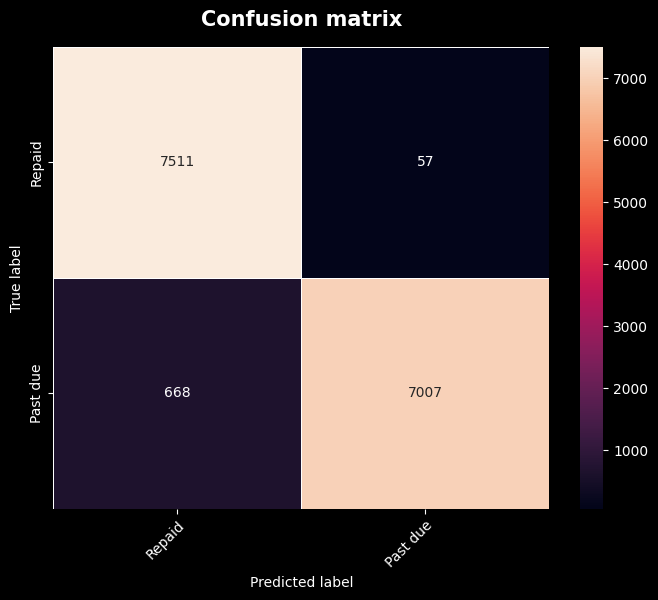

In [15]:
from pepper.scoring import show_confusion_matrix
y_train = res["resamples"]["y_train"]
train_pred_discr = res["preds"]["train"]["discr"]
show_confusion_matrix(y_train, train_pred_discr, ["Repaid", "Past due"])

Importance des caractéristiques

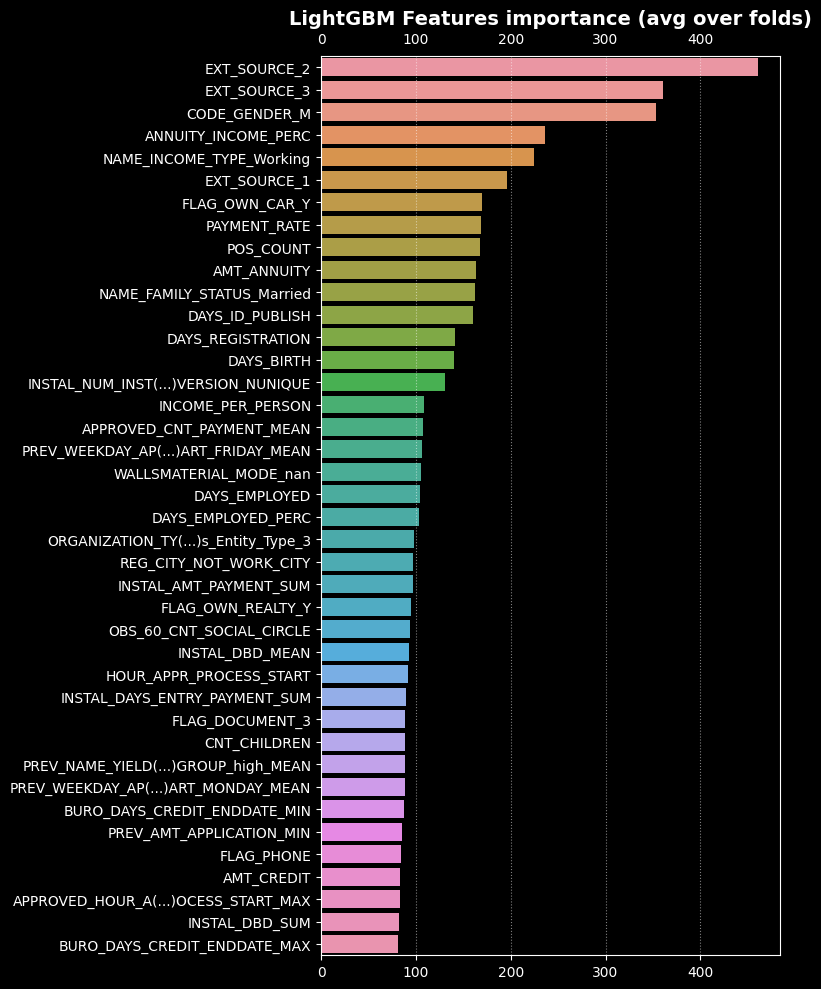

In [16]:
from home_credit.lightgbm_kernel_v2 import display_importances
feat_imps = res["feat_imps"]
selected_best_feats = display_importances(feat_imps)

## Effet de la mise à l'échelle

In [17]:
from home_credit.load import load_prep_dataset
from home_credit.best_model_search import kfold_train_and_eval_model
from home_credit.lightgbm_kernel_v2 import get_opt_lgbm_classifier

data = load_prep_dataset("baseline_v1")
data = data.sample(10_000)
clf = get_opt_lgbm_classifier()
res = kfold_train_and_eval_model(
    data, clf,
    verbosity=3
)


Starting train and eval of:
Labeled dataset of shape: (10000, 790)
Features set of shape: (10000, 788)

With:
Classifier: 


LGBMClassifier(callbacks=None, colsample_bytree=0.9497036, learning_rate=0.02,
               max_depth=8, min_child_weight=39.3259775,
               min_split_gain=0.0222415, n_estimators=10000, n_jobs=4,
               num_leaves=34, reg_alpha=0.041545473, reg_lambda=0.0735294,
               subsample=0.8715623)

Loss function: 


{'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

Eval metrics: 


{'F2': <function home_credit.best_model_search.<lambda>(y_valid, y_pred)>,
 'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

On 5 KFolds: 

Resampling
Sampler: 


SMOTETomek()

Original dataset shape: Counter({0.0: 7975, -1.0: 1351, 1.0: 674})
Resampled dataset shape: Counter({1.0: 7763, -1.0: 7715, 0.0: 7649})

Train vs. test subsets shapes
	Train shape: (15412, 788)
	Test shape: (7715, 788)

Evaluate the 1-th fold (on 5)
[200]	training's binary_logloss: 0.136921	valid_1's binary_logloss: 0.167385
[400]	training's binary_logloss: 0.0999356	valid_1's binary_logloss: 0.145967
[600]	training's binary_logloss: 0.0838234	valid_1's binary_logloss: 0.142088
[800]	training's binary_logloss: 0.0730306	valid_1's binary_logloss: 0.1403
[1000]	training's binary_logloss: 0.0650174	valid_1's binary_logloss: 0.139803
[1200]	training's binary_logloss: 0.0588551	valid_1's binary_logloss: 0.13964
Fold  0 F2: 0.926587
Fold  0 AUC: 0.980849

Evaluate the 2-th fold (on 5)
[200]	training's binary_logloss: 0.138072	valid_1's binary_logloss: 0.160322
[400]	training's binary_logloss: 0.10187	valid_1's binary_logloss: 0.136074
[600]	training's binary_logloss: 0.0859553	valid_1's bina

overall AUC verif: 0.9822982186560667


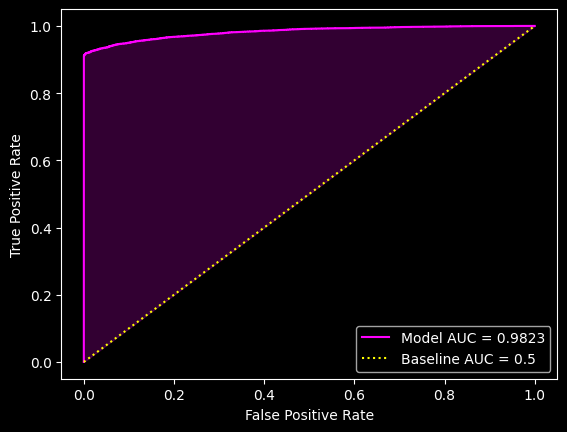

In [3]:
from home_credit.best_model_search import plot_roc_curve
from sklearn.metrics import roc_auc_score
y_train = res["resamples"]["y_train"]
train_pred_proba = res["preds"]["train"]["proba"]
overall_auc = res["scores"]['AUC']['overall']
print("overall AUC verif:", roc_auc_score(y_train, train_pred_proba))
plot_roc_curve(y_train, train_pred_proba, overall_auc)

Matrice de confusion


Confusion matrix


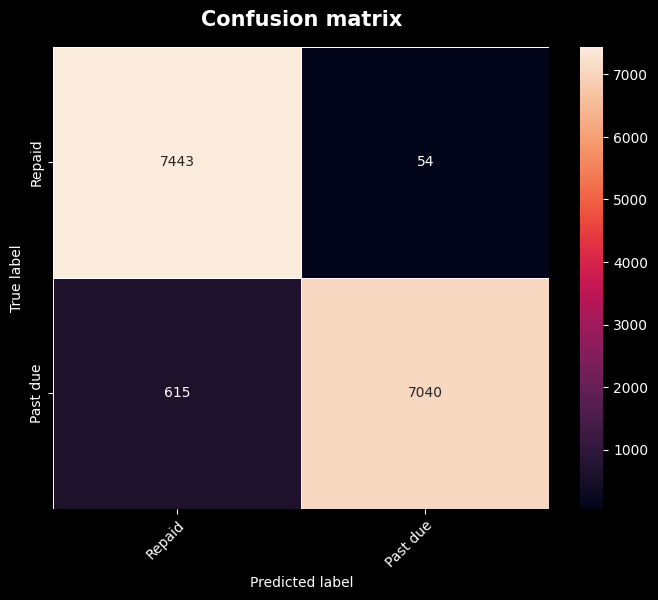

In [6]:
from pepper.scoring import show_confusion_matrix
y_train = res["resamples"]["y_train"]
train_pred_discr = res["preds"]["train"]["discr"]
show_confusion_matrix(y_train, train_pred_discr, ["Repaid", "Past due"])

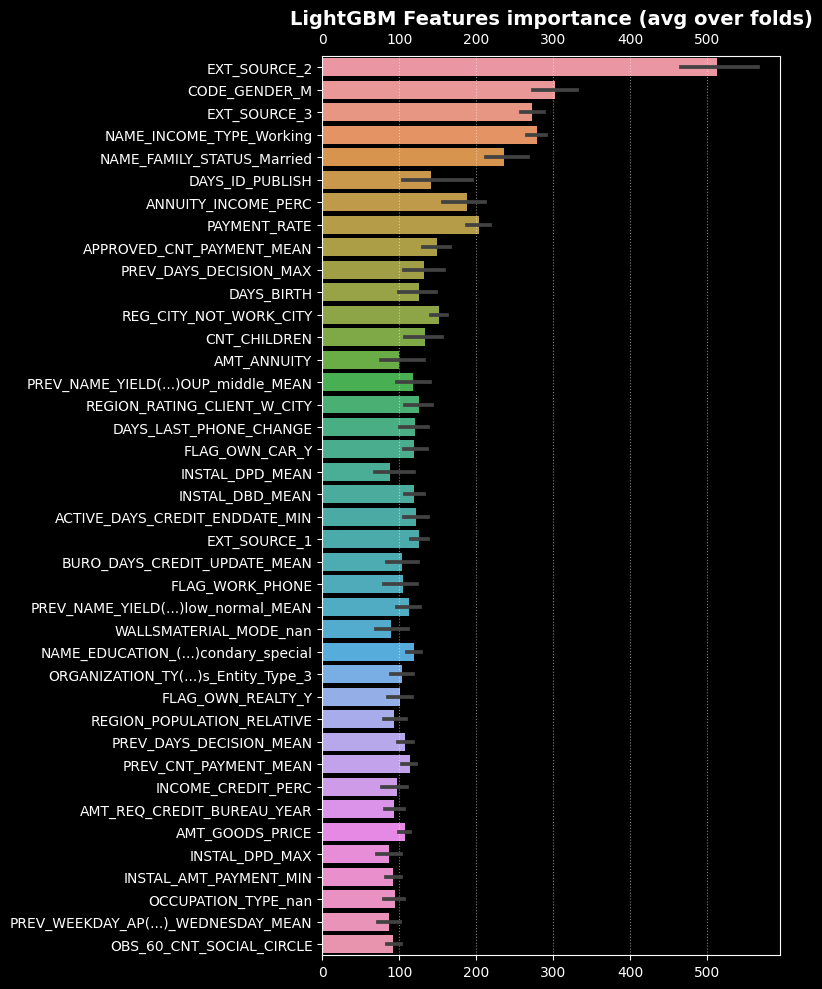

In [9]:
from home_credit.lightgbm_kernel_v2 import display_importances
feat_imps = res["feat_imps"]
selected_best_feats = display_importances(feat_imps)

## `kfold_train_and_eval_model v2`

A la réflexion, notre première version de `kfold_train_and_eval_model` inspirée de `kfold_lightgbm` était mal conçue.

Cette pipeline principale d'entraînement et de validation croisée recevait un jeu de données, complet ou échantillon, comportant un mix des données d'entraînement et de test, puis procédait en interne à leur séparation.

Or, cette fonction ne devrait travailler que sur les données d’entraînement (et fonc faire ses propres choix, notamment de sous-division en ensemble de validation et véritable base d'entraînement, sans aucune relation avec le jeu de test).

D'une part cela nous couvre contre tout risque de fuite de données, ou encore de biais dans les sélections de parties (par exemple le resampling ou la stratification sont actuellement pollués par la classe de cible -1 qui représente l’ensemble de test). D'autre part, cela simplifie et améliore la lisibilité du code.

**TD** en outre:
* voir ce qui est dit à la fin concernant le scoring externe par validation croisée : il faut mettre à disposition les prétriatements supplémentaires de data en amont sur passage à `fit` et `predict`du classifieur `clf` utilisé.
* Encadrement (à l'aide d'une décoration ? j'aimerais mieux) dans du tracking mlflow.


Effectuons de nouveaux tests sur l'échantillon `train_baseline_10k` :

In [1]:
from home_credit.load import load_prep_dataset
from home_credit.best_model_search import kfold_train_and_eval_model_v2
from home_credit.lightgbm_kernel_v2 import get_opt_lgbm_classifier

data = load_prep_dataset("train_baseline_10k")
clf = get_opt_lgbm_classifier()
res = kfold_train_and_eval_model_v2(
    data, clf,
    verbosity=3
)


Starting train and eval of:
Labeled dataset of shape: (10000, 790)
Features set of shape: (10000, 788)

With:
Classifier: 


LGBMClassifier(callbacks=None, colsample_bytree=0.9497036, learning_rate=0.02,
               max_depth=8, min_child_weight=39.3259775,
               min_split_gain=0.0222415, n_estimators=10000, n_jobs=4,
               num_leaves=34, reg_alpha=0.041545473, reg_lambda=0.0735294,
               subsample=0.8715623)

Loss function: 


{'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

Eval metrics: 


{'F2': <function home_credit.best_model_search.<lambda>(y, y_pred)>,
 'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

On 5 KFolds: 

Resampling
Sampler: 


SMOTETomek()

Original dataset shape: Counter({0.0: 9177, 1.0: 823})
Resampled dataset shape: Counter({0.0: 9177, 1.0: 9177})
Data shape: (18354, 788)

Evaluate the 1-th fold (on 5)
[200]	training's binary_logloss: 0.176515	valid_1's binary_logloss: 0.19434
[400]	training's binary_logloss: 0.114301	valid_1's binary_logloss: 0.142994
[600]	training's binary_logloss: 0.0937089	valid_1's binary_logloss: 0.132167
[800]	training's binary_logloss: 0.0805252	valid_1's binary_logloss: 0.127365
[1000]	training's binary_logloss: 0.0712602	valid_1's binary_logloss: 0.124706
[1200]	training's binary_logloss: 0.0637075	valid_1's binary_logloss: 0.123261
[1400]	training's binary_logloss: 0.0576747	valid_1's binary_logloss: 0.122362
[1600]	training's binary_logloss: 0.0527661	valid_1's binary_logloss: 0.121459
[1800]	training's binary_logloss: 0.0485965	valid_1's binary_logloss: 0.121037
[2000]	training's binary_logloss: 0.0451633	valid_1's binary_logloss: 0.120642
[2200]	training's binary_logloss: 0.0421364	valid

### Extraction et affichage des résultats

```Python
# Return :
#   resampled data features and target
#   probabilistic and discrete predictions (on oof valid data),
#   performance scores and feature importances
res = {
    "resamples": {"X": X,"y": y} --> simplement l'index,
    "preds": {"proba": oof_preds_proba, "discr": oof_preds_discr}, --> simplement la proba
    "scores": scores,
    "feat_imps": feat_imp
}
```

**TODO** Faire une petite fonction plus *pretty* -> `display_train_and_eval_results`

In [2]:
from home_credit.best_model_search import display_train_and_eval_results
display_train_and_eval_results(res)

resampled X : shape (18354, 788)
classe counts (array([0., 1.]), array([9177, 9177], dtype=int64))
y_train_res_pred_proba: [0.22526752 0.07999937 0.20321403 ... 0.97651883 0.99895629 0.9985781 ]
y_train_res_pred_discr: [0. 0. 0. ... 1. 1. 1.]
preds counts (array([0., 1.]), array([9784, 8570], dtype=int64))


{'F2': {'over_folds': [0.9395635142697258,
   0.9324458136208604,
   0.9310344827586207,
   0.9353666593261398,
   0.9360705728599433],
  'overall': 0.9348911170988118},
 'AUC': {'over_folds': [0.9854953066152707,
   0.9850275513002718,
   0.982338298711044,
   0.9873420539443104,
   0.9839439751515527],
  'overall': 0.984851075008565}}

### ROC AUC

Avec un AUC de 0.98, il y a probablement du sur-apprentissage, ce qui n'est surprenant avec une échentillon aussi réduit.

Cela dit, l'impact du rééquilibrage des classes est manifeste.

overall AUC verif: 0.984851075008565


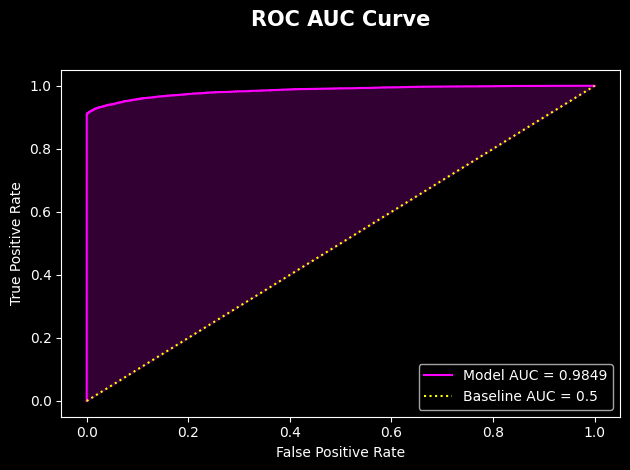

In [3]:
from home_credit.best_model_search import plot_roc_curve
from sklearn.metrics import roc_auc_score

y_train_res = res["resamples"]["y"]
y_train_res_pred_proba = res["preds"]["proba"]

train_res_scores_overall_auc = res["scores"]['AUC']['overall']
print("overall AUC verif:", roc_auc_score(y_train_res, y_train_res_pred_proba))

plot_roc_curve(y_train_res, y_train_res_pred_proba, train_res_scores_overall_auc)

La même chose, sur la totalité des données d'entraînement de l'échantillon `train_baseline_10k`

C'est là que se font ressentir deux besoins essentiels:
1. de pouvoir récupérer le classifieur entraîné
2. du `train_preproc` pour rendre les données compatibles avec ce classifieur.

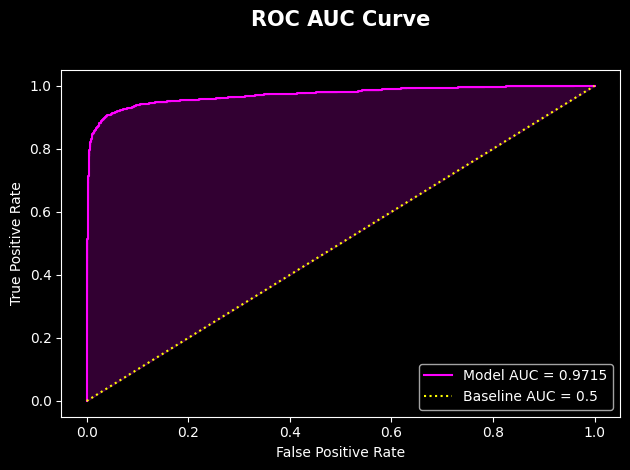

In [4]:
from home_credit.best_model_search import plot_roc_curve
from home_credit.best_model_search import train_preproc
import sklearn as skl
from sklearn.metrics import roc_auc_score

X, y_true = train_preproc(data, skl.preprocessing.MinMaxScaler())
y_pred_proba = clf.predict_proba(X)[:, 1]
overall_auc = roc_auc_score(y_true, y_pred_proba)
plot_roc_curve(y_true, y_pred_proba, overall_auc)

Evaluation sur la totalité du jeu d'entraînement : là, on voit clairemment que, même si ce n'est pas complètement mauvais, c'est loin d'être aussi bon. Cela met en évidence le sur-apprentissage qui opérait.

array([0.6351644 , 0.12219224, 0.16275328, ..., 0.04986153, 0.04762166,
       0.25218342])

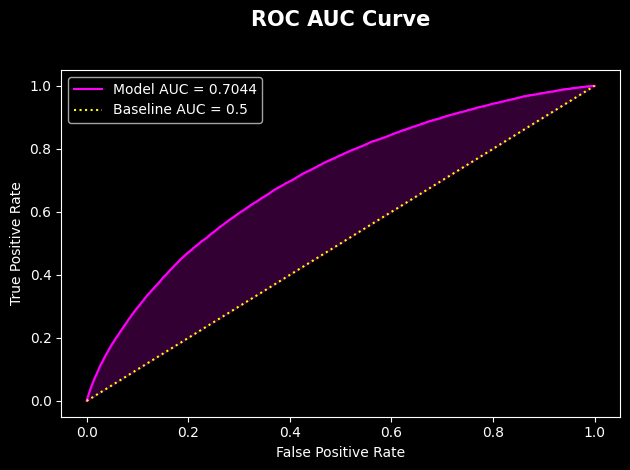

In [5]:
from home_credit.best_model_search import plot_roc_curve
from sklearn.metrics import roc_auc_score

data_all = load_prep_dataset("train_baseline_all")
X, y_true = train_preproc(data_all, skl.preprocessing.MinMaxScaler())
y_pred_proba = clf.predict_proba(X)[:, 1]
display(y_pred_proba)
overall_auc = roc_auc_score(y_true, y_pred_proba)
plot_roc_curve(y_true, y_pred_proba, overall_auc)

Le complément de l'échantillon d'entraînement dans l'ensemble complet d'entraînement

array([0.56740325, 0.09761868, 0.1430843 , ..., 0.05720234, 0.03053151,
       0.33437433])

overall AUC verif:


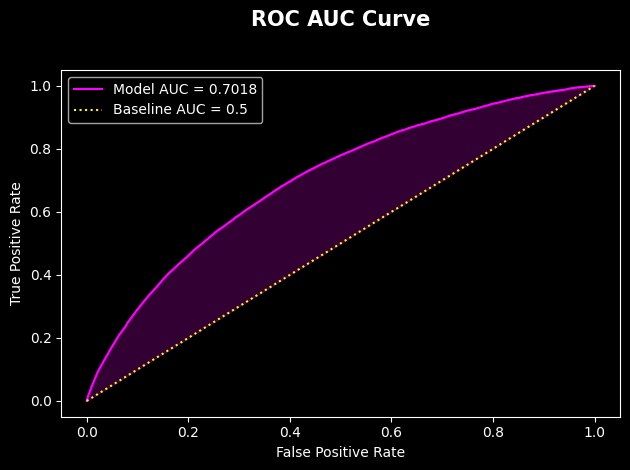

In [6]:
data_no_train = data_all[~data_all.index.isin(data.index)]

X, y_true = train_preproc(data_no_train, skl.preprocessing.MinMaxScaler())

y_pred_proba = clf.predict_proba(X)[:, 1]
# train_pred_proba = res["preds"]["proba"]
display(y_pred_proba)

# overall_auc = res["scores"]['AUC']['overall']
overall_auc = roc_auc_score(y_true, y_pred_proba)
print("overall AUC verif:", )

plot_roc_curve(y_true, y_pred_proba, overall_auc)

### Matrice de confusion

Même approche.

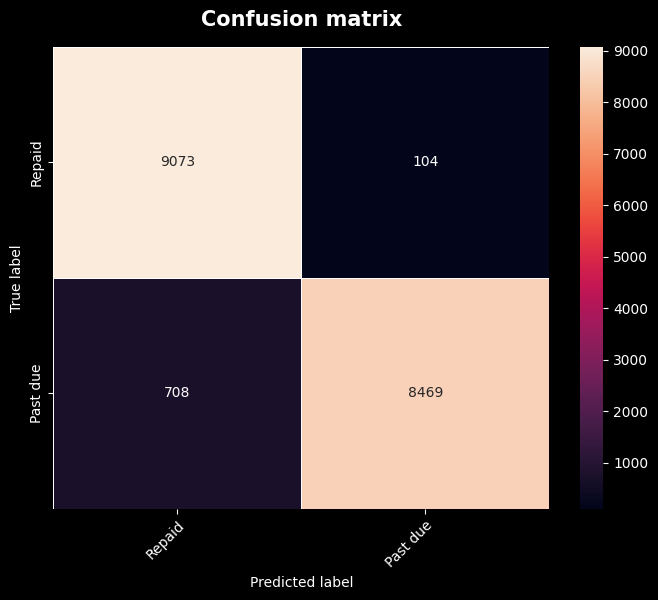

In [9]:
from pepper.scoring import show_confusion_matrix

y_train = res["resamples"]["y"]
train_pred_discr = res["preds"]["discr"]
show_confusion_matrix(y_train, train_pred_discr, ["Repaid", "Past due"])

### Visualisation de l'importance des caractéristiques

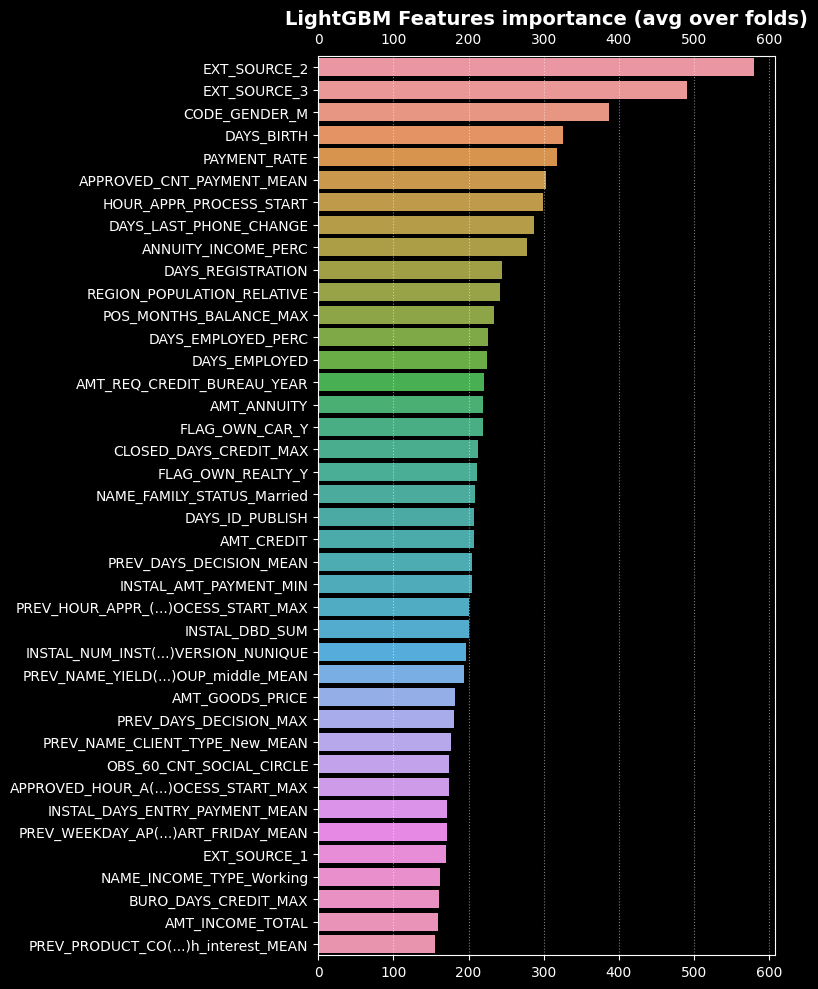

In [6]:
from home_credit.lightgbm_kernel_v2 import display_importances
feat_imps = res["feat_imps"]
selected_best_feats = display_importances(feat_imps, "LightGBM")

### Version intégrée

#### Seuil à 50 %

C'est le seuil de la méthode `predict` par défaut.


Post train eval with threshold of 50.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (10000, 788)	ys class counts : (array([0., 1.]), array([9177,  823], dtype=int64))
Xrs : shape (18354, 788)	yrs class counts : (array([0., 1.]), array([9177, 9177], dtype=int64))
Xv : shape (297511, 788)	yv class counts : (array([0., 1.]), array([273509,  24002], dtype=int64))


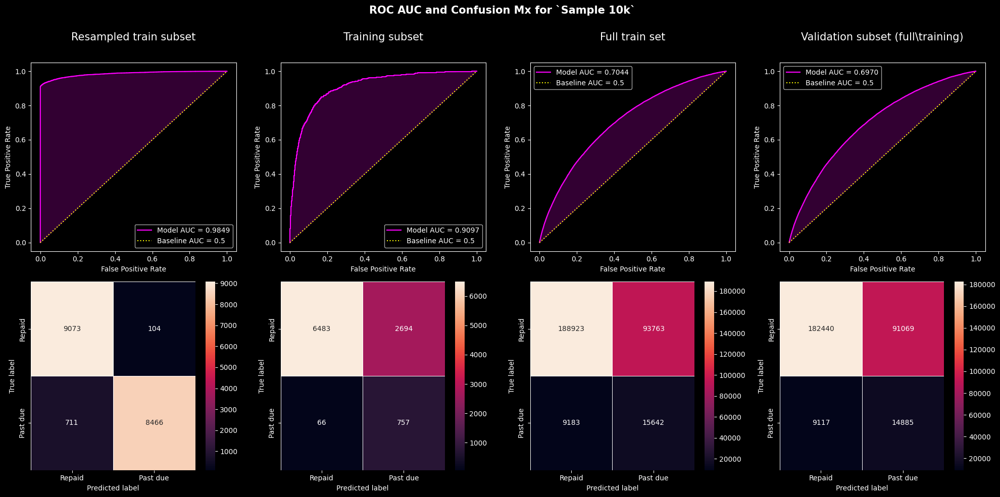


Validation set metrics
ROC AUC: 0.6970198655234991
Accuracy: 0.4832392751864637
ARI: -0.011235479756910454
Jaccard Index: 0.31859954393655
Precision: 0.4832392751864637
Recall: 0.4832392751864637
F1: 0.4832392751864637
F2: 0.4832392751864637
F4: 0.4832392751864637
F8: 0.4832392751864637
F16: 0.4832392751864637

Undersampled validation set metrics
Original dataset shape Counter({0.0: 273509, 1.0: 24002})
Resampled dataset shape Counter({0.0: 24002, 1.0: 24002})
ROC AUC: 0.6957264383316222
Accuracy: 0.6292808932588951
ARI: 0.06683714781215702
Jaccard Index: 0.45908814589665653
Precision: 0.6292808932588951
Recall: 0.6292808932588951
F1: 0.6292808932588951
F2: 0.6292808932588951
F4: 0.6292808932588951
F8: 0.6292808932588951
F16: 0.6292808932588951


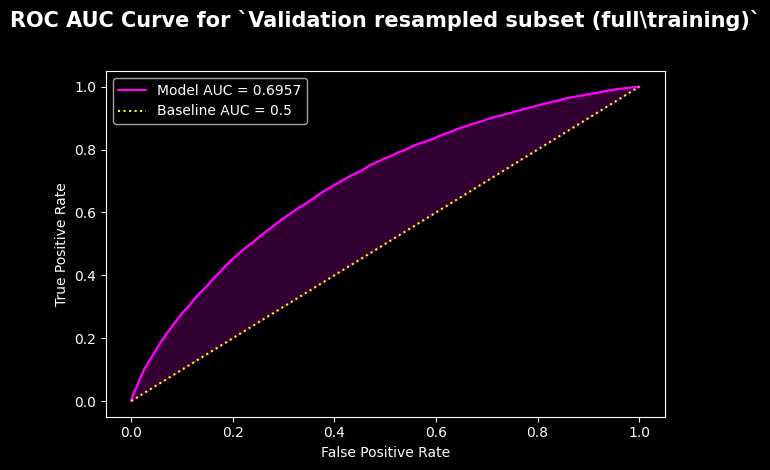

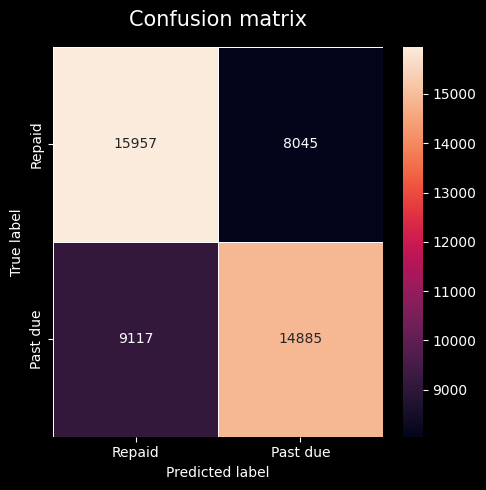

In [8]:
from home_credit.load import load_prep_dataset
from home_credit.best_model_search import post_train_eval
import sklearn as skl

data_s = load_prep_dataset("train_baseline_10k")
scaler = skl.preprocessing.MinMaxScaler()
threshold = .5
post_train_eval(data_s, res, clf, scaler, threshold)

#### Seuil à 66 %

C'est l'inverse de ce qu'il faut faire, mais pour la démonstration : là les faux négatifs l'emportent sur les faux positifs, ce qui est le contraire de ce qui est recherché.


Post train eval with threshold of 66.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (10000, 788)	ys class counts : (array([0., 1.]), array([9177,  823], dtype=int64))
Xrs : shape (18354, 788)	yrs class counts : (array([0., 1.]), array([9177, 9177], dtype=int64))
Xv : shape (297511, 788)	yv class counts : (array([0., 1.]), array([273509,  24002], dtype=int64))


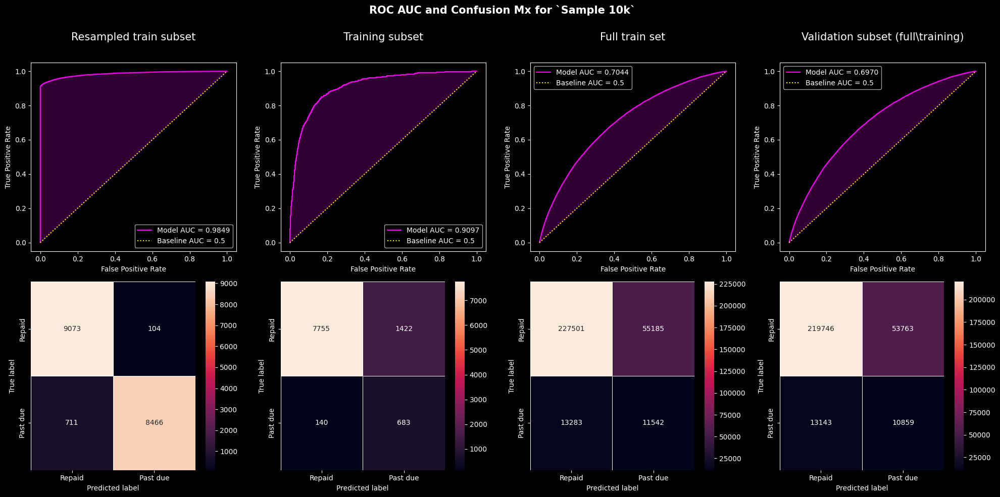


Validation set metrics
ROC AUC: 0.6970198655234991
Accuracy: 0.4832392751864637
ARI: -0.011235479756910454
Jaccard Index: 0.31859954393655
Precision: 0.4832392751864637
Recall: 0.4832392751864637
F1: 0.4832392751864637
F2: 0.4832392751864637
F4: 0.4832392751864637
F8: 0.4832392751864637
F16: 0.4832392751864637

Undersampled validation set metrics
Original dataset shape Counter({0.0: 273509, 1.0: 24002})
Resampled dataset shape Counter({0.0: 24002, 1.0: 24002})
ROC AUC: 0.6957264383316222
Accuracy: 0.6292808932588951
ARI: 0.06683714781215702
Jaccard Index: 0.45908814589665653
Precision: 0.6292808932588951
Recall: 0.6292808932588951
F1: 0.6292808932588951
F2: 0.6292808932588951
F4: 0.6292808932588951
F8: 0.6292808932588951
F16: 0.6292808932588951


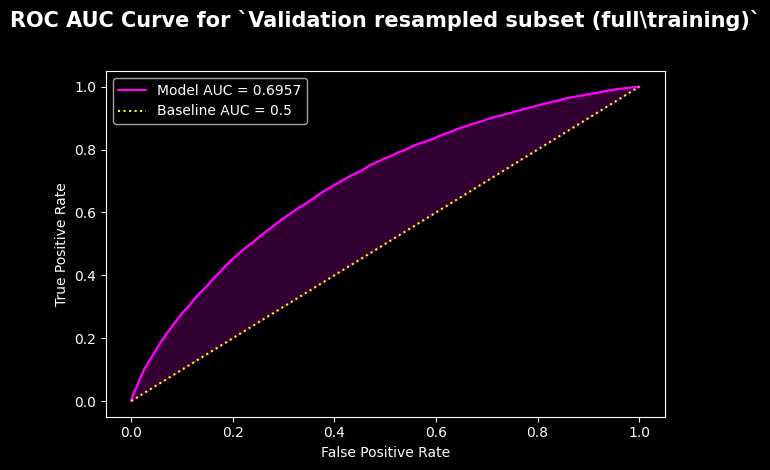

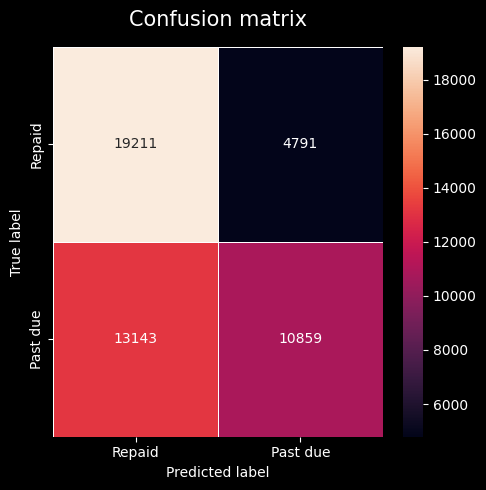

In [9]:
from home_credit.load import load_prep_dataset
from home_credit.best_model_search import post_train_eval
import sklearn as skl

data_s = load_prep_dataset("train_baseline_10k")
scaler = skl.preprocessing.MinMaxScaler()
threshold = .66
post_train_eval(data_s, res, clf, scaler, threshold)

#### Seuil à 40 %


Post train eval with threshold of 40.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (10000, 788)	ys class counts : (array([0., 1.]), array([9177,  823], dtype=int64))
Xrs : shape (18354, 788)	yrs class counts : (array([0., 1.]), array([9177, 9177], dtype=int64))
Xv : shape (297511, 788)	yv class counts : (array([0., 1.]), array([273509,  24002], dtype=int64))


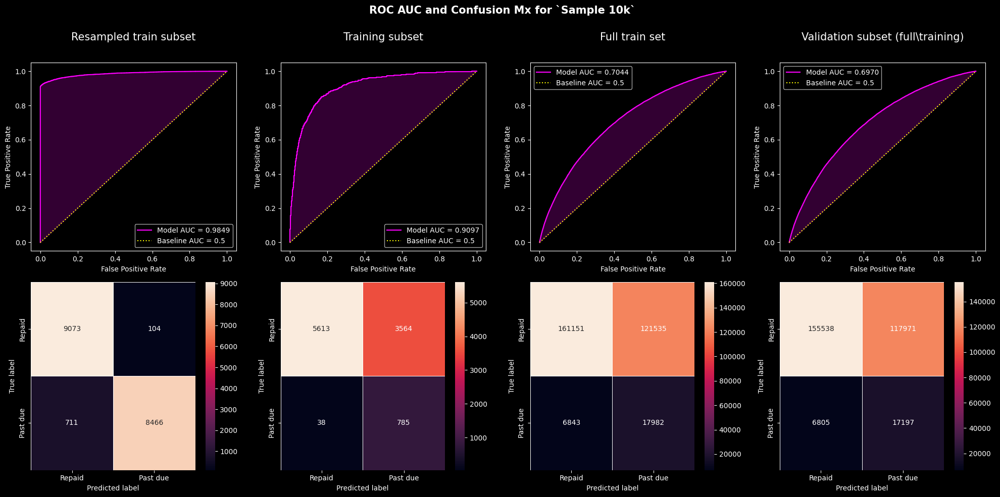


Validation set metrics
ROC AUC: 0.6970198655234991
Accuracy: 0.4832392751864637
ARI: -0.011235479756910454
Jaccard Index: 0.31859954393655
Precision: 0.4832392751864637
Recall: 0.4832392751864637
F1: 0.4832392751864637
F2: 0.4832392751864637
F4: 0.4832392751864637
F8: 0.4832392751864637
F16: 0.4832392751864637

Undersampled validation set metrics
Original dataset shape Counter({0.0: 273509, 1.0: 24002})
Resampled dataset shape Counter({0.0: 24002, 1.0: 24002})
ROC AUC: 0.6957264383316222
Accuracy: 0.6292808932588951
ARI: 0.06683714781215702
Jaccard Index: 0.45908814589665653
Precision: 0.6292808932588951
Recall: 0.6292808932588951
F1: 0.6292808932588951
F2: 0.6292808932588951
F4: 0.6292808932588951
F8: 0.6292808932588951
F16: 0.6292808932588951


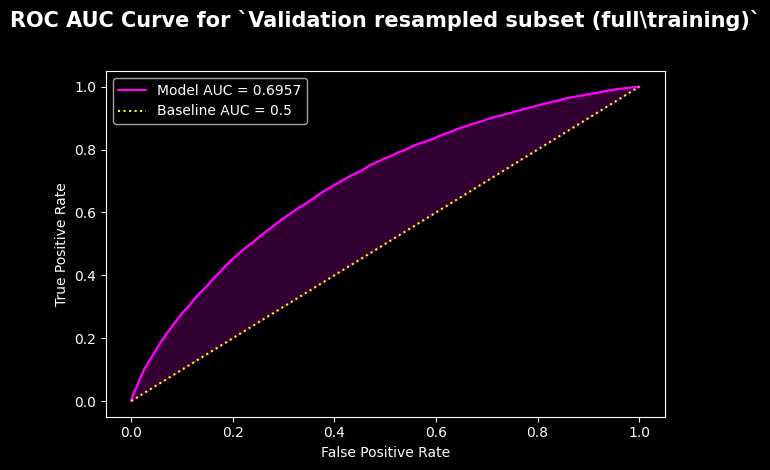

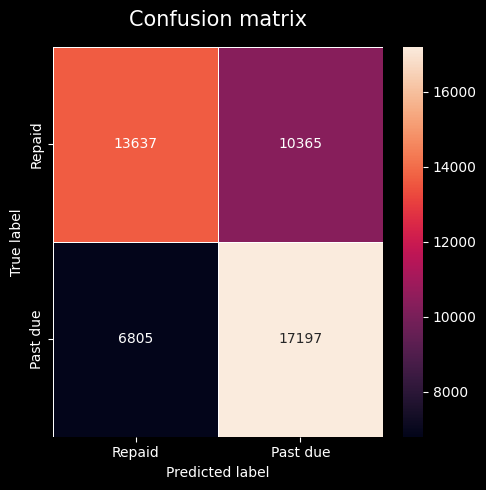

In [10]:
from home_credit.load import load_prep_dataset
from home_credit.best_model_search import post_train_eval
import sklearn as skl

data_s = load_prep_dataset("train_baseline_10k")
scaler = skl.preprocessing.MinMaxScaler()
threshold = .4
post_train_eval(data_s, res, clf, scaler, threshold)

#### Seuil à 30 %

On réduit encore la quantité de faux négatifs, mais en contrepartie, le nombre de faux positifs commence à dépasse le nombre de vrais négatifs, ce qui signifie que l'on se prive de plus de la moitié d'une clientèle de qualité.


Post train eval with threshold of 30.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (10000, 788)	ys class counts : (array([0., 1.]), array([9177,  823], dtype=int64))
Xrs : shape (18354, 788)	yrs class counts : (array([0., 1.]), array([9177, 9177], dtype=int64))
Xv : shape (297511, 788)	yv class counts : (array([0., 1.]), array([273509,  24002], dtype=int64))


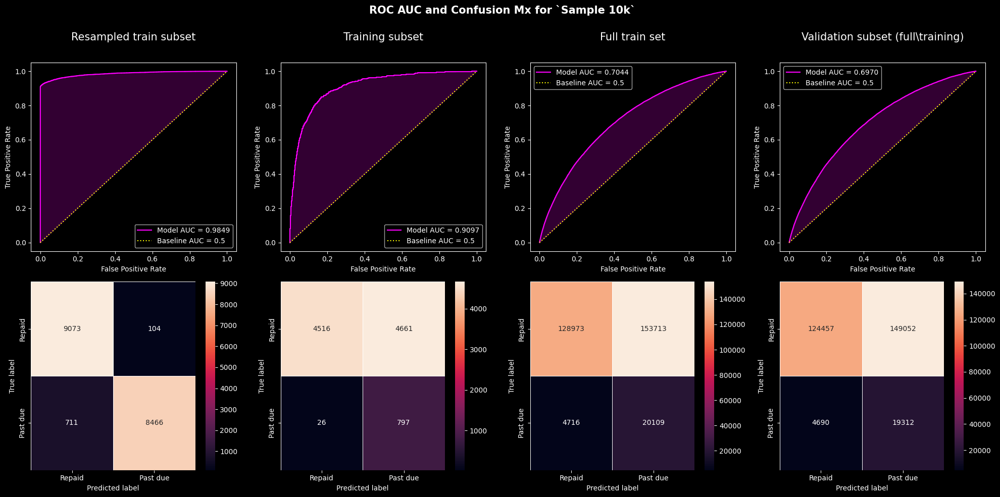


Validation set metrics
ROC AUC: 0.6970198655234991
Accuracy: 0.4832392751864637
ARI: -0.011235479756910454
Jaccard Index: 0.31859954393655
Precision: 0.4832392751864637
Recall: 0.4832392751864637
F1: 0.4832392751864637
F2: 0.4832392751864637
F4: 0.4832392751864637
F8: 0.4832392751864637
F16: 0.4832392751864637

Undersampled validation set metrics
Original dataset shape Counter({0.0: 273509, 1.0: 24002})
Resampled dataset shape Counter({0.0: 24002, 1.0: 24002})
ROC AUC: 0.6957264383316222
Accuracy: 0.6292808932588951
ARI: 0.06683714781215702
Jaccard Index: 0.45908814589665653
Precision: 0.6292808932588951
Recall: 0.6292808932588951
F1: 0.6292808932588951
F2: 0.6292808932588951
F4: 0.6292808932588951
F8: 0.6292808932588951
F16: 0.6292808932588951


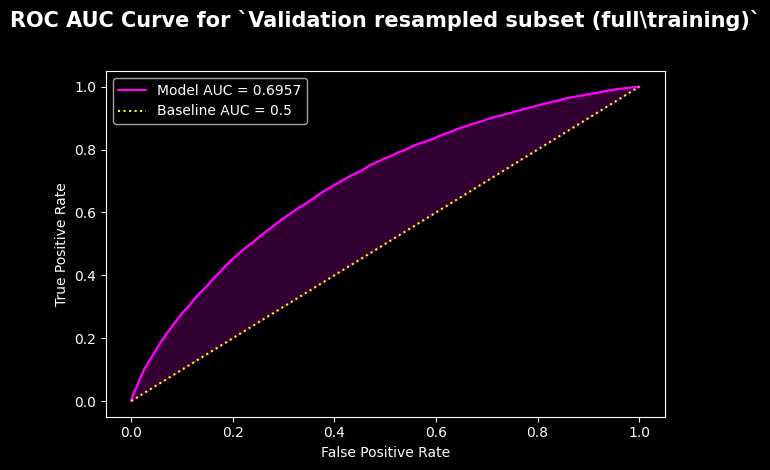

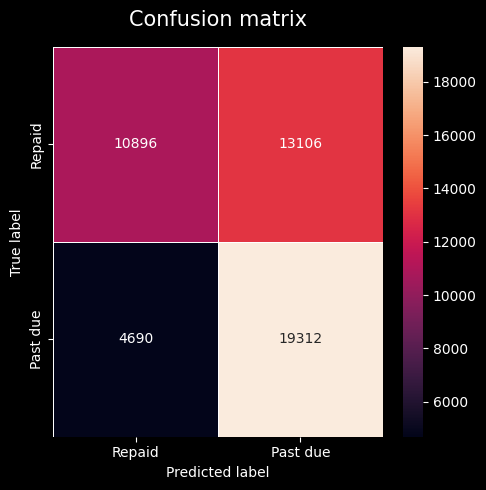

In [7]:
from home_credit.load import load_prep_dataset
from home_credit.best_model_search import post_train_eval
import sklearn as skl

data_s = load_prep_dataset("train_baseline_10k")
scaler = skl.preprocessing.MinMaxScaler()
threshold = .3
post_train_eval(data_s, res, clf, scaler, threshold)

#### Seuil à 20 %


Post train eval with threshold of 20.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (10000, 788)	ys class counts : (array([0., 1.]), array([9177,  823], dtype=int64))
Xrs : shape (18354, 788)	yrs class counts : (array([0., 1.]), array([9177, 9177], dtype=int64))
Xv : shape (297511, 788)	yv class counts : (array([0., 1.]), array([273509,  24002], dtype=int64))


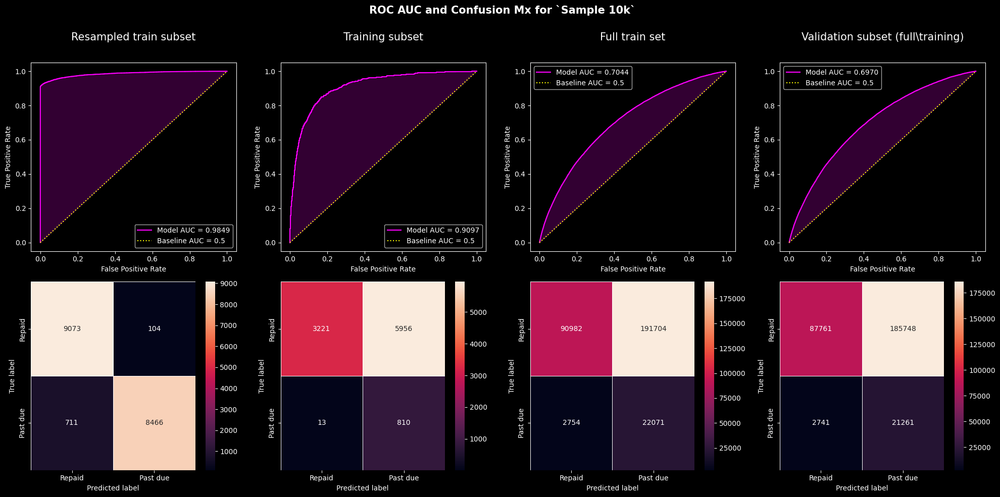


Validation set metrics
ROC AUC: 0.6970198655234991
Accuracy: 0.4832392751864637
ARI: -0.011235479756910454
Jaccard Index: 0.31859954393655
Precision: 0.4832392751864637
Recall: 0.4832392751864637
F1: 0.4832392751864637
F2: 0.4832392751864637
F4: 0.4832392751864637
F8: 0.4832392751864637
F16: 0.4832392751864637

Undersampled validation set metrics
Original dataset shape Counter({0.0: 273509, 1.0: 24002})
Resampled dataset shape Counter({0.0: 24002, 1.0: 24002})
ROC AUC: 0.6957264383316222
Accuracy: 0.6292808932588951
ARI: 0.06683714781215702
Jaccard Index: 0.45908814589665653
Precision: 0.6292808932588951
Recall: 0.6292808932588951
F1: 0.6292808932588951
F2: 0.6292808932588951
F4: 0.6292808932588951
F8: 0.6292808932588951
F16: 0.6292808932588951


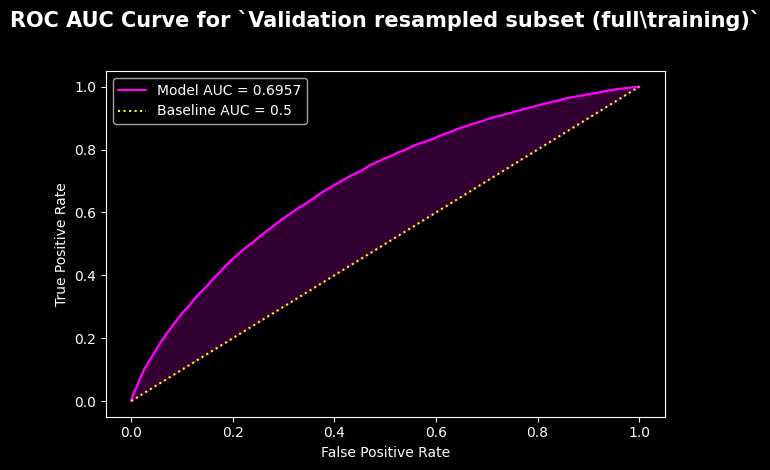

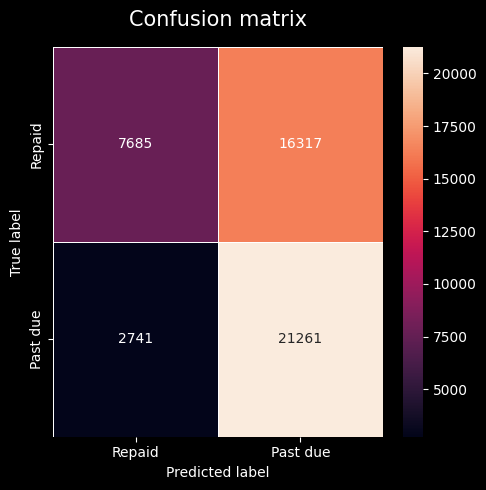

In [11]:
from home_credit.load import load_prep_dataset
from home_credit.best_model_search import post_train_eval
import sklearn as skl

data_s = load_prep_dataset("train_baseline_10k")
scaler = skl.preprocessing.MinMaxScaler()
threshold = .2
post_train_eval(data_s, res, clf, scaler, threshold)

#### Seuil à 10 %

Ou comment ne jamais se tromper en n'ayant aucun client !


Post train eval with threshold of 10.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (10000, 788)	ys class counts : (array([0., 1.]), array([9177,  823], dtype=int64))
Xrs : shape (18354, 788)	yrs class counts : (array([0., 1.]), array([9177, 9177], dtype=int64))
Xv : shape (297511, 788)	yv class counts : (array([0., 1.]), array([273509,  24002], dtype=int64))


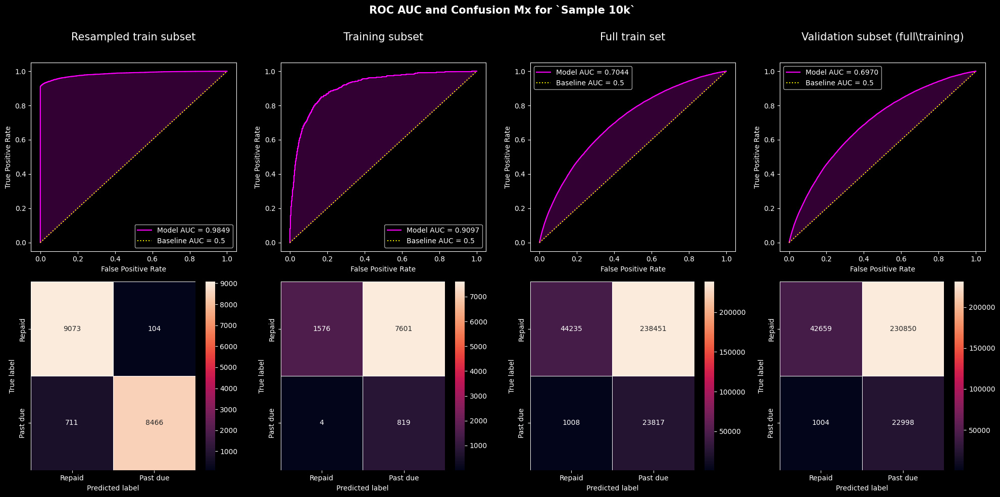


Validation set metrics
ROC AUC: 0.6970198655234991
Accuracy: 0.4832392751864637
ARI: -0.011235479756910454
Jaccard Index: 0.31859954393655
Precision: 0.4832392751864637
Recall: 0.4832392751864637
F1: 0.4832392751864637
F2: 0.4832392751864637
F4: 0.4832392751864637
F8: 0.4832392751864637
F16: 0.4832392751864637

Undersampled validation set metrics
Original dataset shape Counter({0.0: 273509, 1.0: 24002})
Resampled dataset shape Counter({0.0: 24002, 1.0: 24002})
ROC AUC: 0.6957264383316222
Accuracy: 0.6292808932588951
ARI: 0.06683714781215702
Jaccard Index: 0.45908814589665653
Precision: 0.6292808932588951
Recall: 0.6292808932588951
F1: 0.6292808932588951
F2: 0.6292808932588951
F4: 0.6292808932588951
F8: 0.6292808932588951
F16: 0.6292808932588951


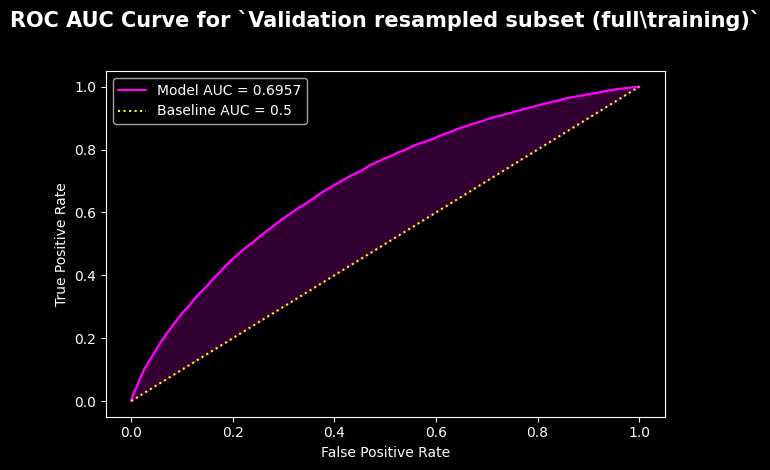

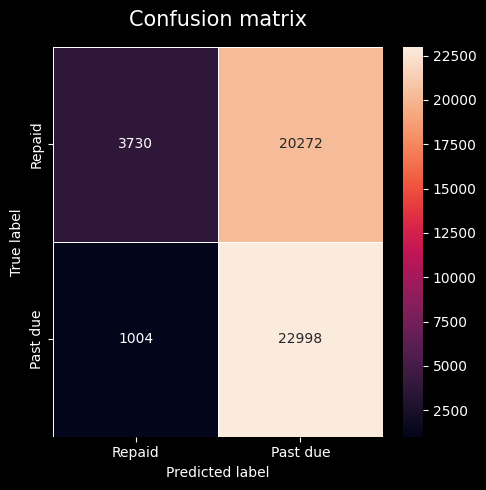

In [12]:
from home_credit.load import load_prep_dataset
from home_credit.best_model_search import post_train_eval
import sklearn as skl

data_s = load_prep_dataset("train_baseline_10k")
scaler = skl.preprocessing.MinMaxScaler()
threshold = .1
post_train_eval(data_s, res, clf, scaler, threshold)

## Un point rapide sur la complexité algorithmique

Ayons une idée de ce à quoi nous attendre en termes de temps d'excution et de pression sur la mémoire.

Dans les formulations de complexités algorithmique temporelle et spatiale ci-dessous, $m$ représente le nombre d'échantillons (`n_samples`) dans l'ensemble d'entraînement, $n$ le nombre de caractéristiques (`n_features`), c'est-à-dire la dimensionnalité, et $k$ le nombre d'itérations (`n_iter`) effectuées par l'algorithme.

Par défaut, l'expression *complexité algorithmique* sans davantage de précision fait référence à la complexité algorithmique temporelle, c'est-à-dire celle qui détermine le temps d'exécution.

### Régression logistique

La complexité algorithmique de la régression logistique dépend principalement de l'algorithme d'optimisation utilisé pour minimiser la fonction de coût.

L'algorithme le plus couramment utilisé est la [**descente de gradient stochastique** (SGD)](https://en.wikipedia.org/wiki/Stochastic_gradient_descent), qui a une complexité algorithmique de $\mathcal{O}(kmn)$.

Cependant, il existe également des variantes plus efficaces de la descente de gradient stochastique, telles que la descente de gradient stochastique moyenne (SGDM), qui ont une complexité algorithmique inférieure. De plus, la bibliothèque scikit-learn utilise une implémentation optimisée de la régression logistique, qui utilise une régularisation $\ell_2$ (par défaut) pour éviter le surapprentissage et qui peut également utiliser un algorithme de descente de gradient plus avancé, tels que [**L-BFGS**](https://en.wikipedia.org/wiki/Limited-memory_BFGS) et [**Conjugate Gradient**](https://en.wikipedia.org/wiki/Conjugate_gradient_method), en fonction des paramètres d'entrée.

En résumé, la complexité de la régression logistique dépend de nombreux facteurs tels que l'algorithme d'optimisation, la régularisation, les caractéristiques de l'ensemble de données, etc. Dans la pratique, la régression logistique est souvent considérée comme un modèle à haute performance avec une complexité algorithmique raisonnable, ce qui en fait un choix populaire pour de nombreuses tâches de classification.

**SGD** : la complexité de la SGD dépend du nombre d'itérations et de la taille du lot (*batch*) utilisé. En général, la complexité est proportionnelle au produit du nombre d'itérations, de la taille du lot et de la dimensionnalité des données. Ainsi, si l'on note $b$ la taille du lot, la complexité de la SGD est en $\mathcal{O}(kmn/b)$.

**L-BFGS** : la complexité de L-BFGS dépend du nombre de variables et de l'ordre de la [méthode de **Quasi-Newton**](https://en.wikipedia.org/wiki/Quasi-Newton_method) utilisée. En général, la complexité est proportionnelle au produit du nombre de variables et du carré de l'ordre de la méthode. Ainsi, si l'on note $p$ l'ordre de la méthode de Quasi-Newton utilisée, la complexité de L-BFGS est en $\mathcal{O}(pn^2)$. La méthode L-BFGS est souvent plus rapide que la SGD pour les problèmes de régression logistique, car elle utilise une approximation de la matrice hessienne qui peut accélérer la convergence.

Complexité spatiale (pression sur la mémoire) :
* SGD : $\mathcal{O}(1)$
* Liblinear : $\mathcal{O}(n)$
* L-BFGS : $\mathcal{O}(kn)$
* Newton-CG : $\mathcal{O}(n^2)$

Remarque : ces complexités spatiales concernent uniquement les poids des modèles et ne prennent pas en compte les autres paramètres tels que les biais ou les intercepteurs.

### Forêt aléatoire

La complexité algorithmique de la forêt aléatoire (qui fait partie des méthodes ensemblistes) dépend principalement du nombre d'arbres (`n_estimators` que nous noterons $t$) dans la forêt et du nombre de caractéristiques (`max_features`) utilisées pour construire chaque arbre.

Dans le pire des cas, la complexité algorithmique de la forêt aléatoire est en $\mathcal{O}(tn^2)$, car chaque arbre peut nécessiter $\mathcal{O}(n^2)$ opérations pour sélectionner les meilleures caractéristiques à chaque nœud. Cependant, en pratique, cette complexité peut être considérablement réduite en utilisant des méthodes de sélection de caractéristiques plus efficaces et en limitant la profondeur des arbres.

La forêt aléatoire est un algorithme très efficace pour la classification et la régression sur de grands ensembles de données, car, contrairement à celui de l'arbre de décision, elle peut être facilement parallélisée et peut gérer des ensembles de données avec des millions d'échantillons et des milliers de caractéristiques. De plus, la forêt aléatoire est généralement robuste aux données manquantes et aux valeurs aberrantes.

La complexité spatiale de la forêt aléatoire dépend également du nombre $t$ d'arbres dans la forêt et du nombre de $n$ caractéristiques considérées pour chaque division. La complexité spatiale de la forêt aléatoire est d'environ $\mathcal{O}(tn)$. Cela est dû au fait que les poids de chaque arbre sont stockés en mémoire. Cependant, en pratique, la forêt aléatoire utilise souvent moins de mémoire que d'autres modèles de classification, car elle ne nécessite pas de stocker une matrice de covariance complète, contrairement aux modèles de classification basés sur la méthode de la régression logistique.

### LGBMClassifier

La bibliothèque LightGBM est une implémentation de gradient boosting qui utilise des algorithmes d'optimisation basés sur les arbres. L'algorithme LightGBM a été conçu pour être plus rapide et plus efficace que d'autres implémentations de gradient boosting, grâce à des techniques telles que la création d'histogrammes pour discrétiser les valeurs continues des caractéristiques.

La complexité algorithmique de LGBMClassifier dépend principalement du nombre d'arbres (`n_estimators`, noté $t$) et de la profondeur / hauteur des arbres (`max_depth` $\approx \log(n)$ si elle n'est pas limitée par un maximum $d$).

La complexité temporelle est en général de l'ordre de $\mathcal{O}(tmn\log(n))$.

Dans la pratique, le temps d'exécution de LGBMClassifier dépendra également de nombreux autres facteurs, tels que la taille de l'ensemble de données, les hyperparamètres choisis, etc. Cependant, LightGBM est généralement considéré comme un modèle à haute performance pour la classification et la régression, et est largement utilisé dans de nombreuses applications pratiques.

Complexité spatiale de la LightGBM : $\mathcal{O}(clt)$ avec $l$ le nombre de feuilles par arbre (`n_leaves`) et $c$ le nombre de classes cibles.

# Benchmark des modèles

## Modéle de référence : classifieur naïf

Nous utilisons un [**`DummyClassifier`**](https://scikit-learn.org/stable/modules/generated/sklearn.dummy.DummyClassifier.html) de Scikit-learn paramétré avec `strategy="most_frequent"`.

Paramétré avec cette stratégie, le classifieur naïf prédira systématiquement la classe dominante.

Ce classifieur va nous servir de base de référence à laquelle comparer les performances prédictives de classifieurs plus avancés.

Le classifieur naïf donne nécessairement un score AUC ROC de 0,5 [[**StackExchange** > *Can AUC-ROC be between 0-0.5?*](https://stats.stackexchange.com/questions/266387/can-auc-roc-be-between-0-0-5)].

In [ ]:
import numpy as np
from sklearn.dummy import DummyClassifier
X = np.array([-1, 1, 1, 1])
y = np.array([0, 1, 1, 1])
dummy_clf = DummyClassifier(strategy="most_frequent")
dummy_clf.fit(X, y)
dummy_clf.predict(X)
dummy_clf.score(X, y)

0.75

## Régression Logistique

Références :
* http://faculty.marshall.usc.edu/gareth-james/ => n'est plus accessible
* https://www.oreilly.com/library/view/hands-on-machine-learning/9781491962282/ => pas gratuit

Ici, je me concentrerai sur la mise en œuvre du modèle plutôt que sur l'explication des détails, mais pour ceux qui veulent en savoir plus sur la théorie des algorithmes d'apprentissage automatique, je recommande à la fois "An Introduction to Statistical Learning" et "Hands-On Machine Learning with Scikit-Learn and TensorFlow". Ces deux livres présentent la théorie ainsi que le code nécessaire pour créer les modèles (en R et en Python respectivement). Ils enseignent tous deux avec l'idée que la meilleure façon d'apprendre est de faire, et ils sont très efficaces!

Pour obtenir une base de référence, nous utiliserons toutes les caractéristiques, après encodage des variables catégorielles. Nous prétraiterons les données en remplissant les valeurs manquantes (imputation) et en normalisant la plage des caractéristiques (mise à l'échelle des caractéristiques). Le code suivant effectue ces deux étapes de prétraitement.

----

La régression logistique de scikit-learn n'a pas de méthode intégrée pour récupérer les importances de caractéristiques (*feature importances*) comme c'est le cas pour les modèles de type arbre, tels que les RandomForest ou les XGBoost.

Cependant, il est possible d'approximer les importances de caractéristiques en utilisant les coefficients de régression. Les coefficients indiquent l'importance relative de chaque caractéristique dans la prédiction de la variable cible. Plus un coefficient est grand, plus la caractéristique associée est importante. Evidemment, cela ne tient que sous hypothèse que les données ont été préalablement normalisées et sont donc à la même échelle.

Test sur l'échantillon de $10\,000$ avec ré-échantillonnage et mise à l'échelle par défaut.

In [1]:
from home_credit.load import load_prep_dataset
from home_credit.best_model_search import kfold_train_and_eval_model
from sklearn.linear_model import LogisticRegression

data = load_prep_dataset("baseline_v1")
data = data.sample(10_000)
clf = LogisticRegression(C=1e-4, random_state=42)
res = kfold_train_and_eval_model(
    data, clf,
    verbosity=3
)


Starting train and eval of:
Labeled dataset of shape: (10000, 790)
Features set of shape: (10000, 788)

With:
Classifier: 


LogisticRegression(C=0.0001, random_state=42)

Loss function: 


{'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

Eval metrics: 


{'F2': <function home_credit.best_model_search.<lambda>(y_valid, y_pred)>,
 'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

On 5 KFolds: 

Resampling
Sampler: 


SMOTETomek()

Original dataset shape: Counter({0.0: 7921, -1.0: 1399, 1.0: 680})
Resampled dataset shape: Counter({1.0: 7742, -1.0: 7655, 0.0: 7582})

Train vs. test subsets shapes
	Train shape: (15324, 788)
	Test shape: (7655, 788)

Evaluate the 1-th fold (on 5)
Fold  0 F2: 0.720709
Fold  0 AUC: 0.701474

Evaluate the 2-th fold (on 5)
Fold  1 F2: 0.736849
Fold  1 AUC: 0.698648

Evaluate the 3-th fold (on 5)
Fold  2 F2: 0.731494
Fold  2 AUC: 0.702636

Evaluate the 4-th fold (on 5)
Fold  3 F2: 0.713490
Fold  3 AUC: 0.711704

Evaluate the 5-th fold (on 5)
Fold  4 F2: 0.741157
Fold  4 AUC: 0.732343
Full F2: 0.728718
Full AUC: 0.708485


Courbe ROC et AUC :

overall AUC verif: 0.7084850855821695


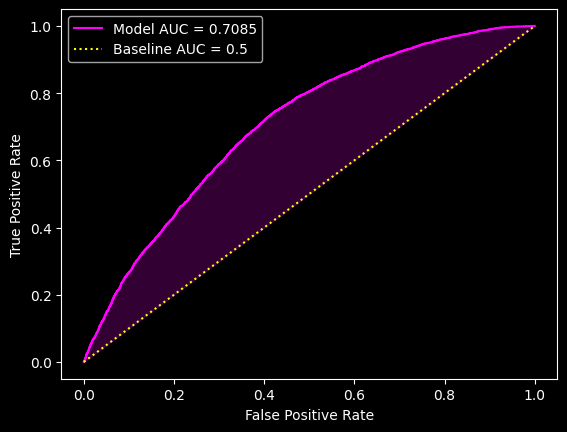

In [2]:
from home_credit.best_model_search import plot_roc_curve
from sklearn.metrics import roc_auc_score
y_train = res["resamples"]["y_train"]
train_pred_proba = res["preds"]["train"]["proba"]
overall_auc = res["scores"]['AUC']['overall']
print("overall AUC verif:", roc_auc_score(y_train, train_pred_proba))
plot_roc_curve(y_train, train_pred_proba, overall_auc)

Matrice de confusion


Confusion matrix


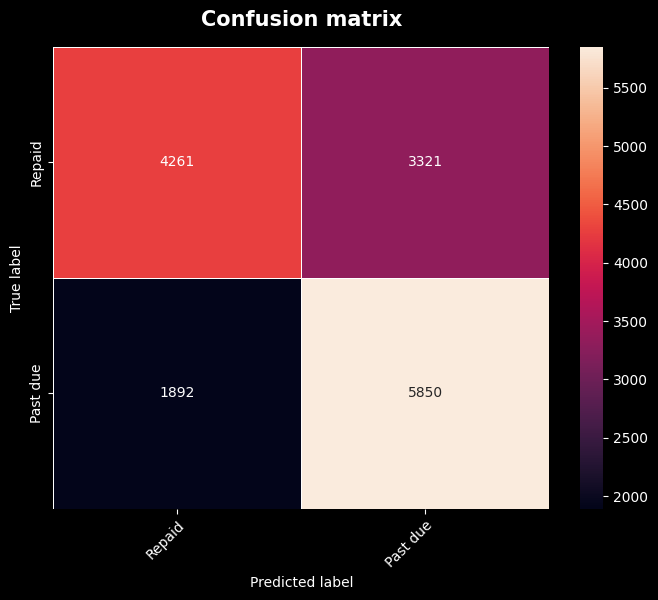

In [3]:
from pepper.scoring import show_confusion_matrix
y_train = res["resamples"]["y_train"]
train_pred_discr = res["preds"]["train"]["discr"]
show_confusion_matrix(y_train, train_pred_discr, ["Repaid", "Past due"])

,feature,importance,fold
0,ACTIVE_AMT_ANNUITY_MAX,-0.000033,0
1,ACTIVE_AMT_ANNUITY_MEAN,-0.000145,0
2,ACTIVE_AMT_CREDIT_MAX_OVERDUE_MEAN,0.000801,0
3,ACTIVE_AMT_CREDIT_SUM_DEBT_MAX,-0.000114,0
4,ACTIVE_AMT_CREDIT_SUM_DEBT_MEAN,-0.000238,0
...,...,...,...
783,YEARS_BEGINEXPLUATATION_MEDI,-0.000409,4
784,YEARS_BEGINEXPLUATATION_MODE,-0.000290,4
785,YEARS_BUILD_AVG,-0.001552,4
786,YEARS_BUILD_MEDI,-0.001620,4


,importance
feature,
CODE_GENDER_M,0.031026
NAME_EDUCATION_TYPE_Secondary_secondary_special,0.030517
NAME_INCOME_TYPE_Working,0.029999
DAYS_BIRTH,0.018470
BURO_DAYS_CREDIT_MIN,0.018252
...,...
BURO_CREDIT_ACTIVE_Closed_MEAN,-0.016998
NAME_FAMILY_STATUS_Married,-0.019992
EXT_SOURCE_3,-0.029804


,feature,importance
0,CODE_GENDER_M,0.031026
1,NAME_EDUCATION_TYPE_Secondary_secondary_special,0.030517
2,NAME_INCOME_TYPE_Working,0.029999
3,DAYS_BIRTH,0.018470
4,BURO_DAYS_CREDIT_MIN,0.018252
...,...,...
783,BURO_CREDIT_ACTIVE_Closed_MEAN,-0.016998
784,NAME_FAMILY_STATUS_Married,-0.019992
785,EXT_SOURCE_3,-0.029804
786,NAME_EDUCATION_TYPE_Higher_education,-0.032042


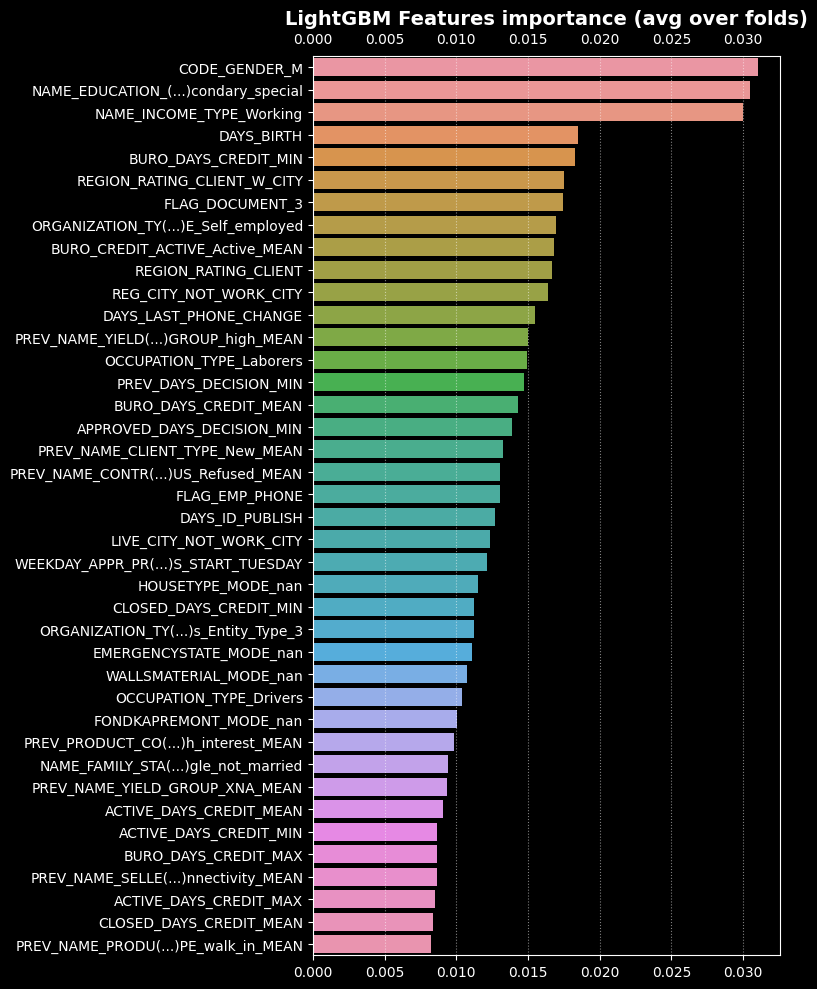

In [4]:
from home_credit.lightgbm_kernel_v2 import display_importances
feat_imps = res["feat_imps"]
selected_best_feats = display_importances(feat_imps)

Références :
* https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html
* https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

Nous allons utiliser la [**`LogisticRegression` de Scikit-Learn**](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html) pour notre premier modèle. La seule modification que nous apporterons aux paramètres par défaut du modèle sera de baisser le [**paramètre de régularisation, C**](https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression), qui contrôle le niveau de sur-apprentissage (une valeur plus faible devrait diminuer le sur-apprentissage). Cela nous donnera des résultats légèrement meilleurs que la `LogisticRegression` par défaut, mais cela fixera tout de même une barre basse pour tous les modèles futurs.

Ici, nous utilisons la syntaxe familière de modélisation de Scikit-Learn : nous créons d'abord le modèle, puis nous l'entraînons en utilisant `.fit` et ensuite nous faisons des prédictions sur les données de test en utilisant `.predict_proba` (rappelez-vous que nous voulons des probabilités et non un 0 ou 1).

Maintenant que le modèle a été entraîné, nous pouvons l'utiliser pour faire des prédictions. Nous voulons prédire les probabilités de non-remboursement d'un prêt, donc nous utilisons la méthode predict.proba du modèle. Cela renvoie un tableau de dimensions m x 2 où m est le nombre d'observations. La première colonne est la probabilité que la cible soit 0 et la deuxième colonne est la probabilité que la cible soit 1 (donc pour une seule ligne, les deux colonnes doivent s'additionner à 1). Nous voulons la probabilité que le prêt ne soit pas remboursé, donc nous sélectionnons la deuxième colonne.

Le code suivant effectue les prédictions et sélectionne la bonne colonne.

In [ ]:
# Save the submission to a csv file
submit.to_csv('log_reg_baseline.csv', index=False)

La soumission a maintenant été sauvegardée dans l'environnement virtuel dans lequel notre notebook s'exécute. Pour accéder à la soumission, à la fin du notebook, nous appuierons sur le bouton bleu "Commit & Run" en haut à droite du noyau. Cela exécute l'ensemble du notebook, puis nous permet de télécharger tous les fichiers qui ont été créés pendant l'exécution.

Une fois que nous avons exécuté le notebook, les fichiers créés sont disponibles dans l'onglet "Versions" sous l'onglet "Output". À partir de là, les fichiers de soumission peuvent être soumis à la compétition ou téléchargés. Comme il y a plusieurs modèles dans ce notebook, il y aura plusieurs fichiers de sortie.

**Le score de base de la régression logistique devrait être d'environ 0,671 lorsqu'il est soumis.**

## Modèle amélioré : Forêt aléatoire

Pour essayer de battre les mauvaises performances de notre modèle de base, nous pouvons mettre à jour l'algorithme. Essayons d'utiliser une forêt aléatoire sur les mêmes données d'entraînement pour voir comment cela affecte les performances. La forêt aléatoire est un modèle beaucoup plus puissant que la régression logistique, surtout lorsque nous utilisons des centaines d'arbres. Nous utiliserons 100 arbres dans la forêt aléatoire.

Ces prévisions seront également disponibles lorsque nous exécuterons l'ensemble du notebook.

**Ce modèle devrait avoir un score d'environ 0,678 lorsqu'il est soumis.**

In [2]:
from home_credit.load import load_prep_dataset
from home_credit.best_model_search import kfold_train_and_eval_model
from sklearn.ensemble import RandomForestClassifier

data = load_prep_dataset("baseline_v1")
data = data.sample(10_000)

# Create the random forest classifier
clf = RandomForestClassifier(
    n_estimators=100, random_state=42,
    verbose=1, n_jobs=-1
)

# Train and cross eval it
res = kfold_train_and_eval_model(
    data, clf,
    verbosity=3
)


Starting train and eval of:
Labeled dataset of shape: (10000, 790)
Features set of shape: (10000, 788)

With:
Classifier: 


RandomForestClassifier(n_jobs=-1, random_state=42, verbose=1)

Loss function: 


{'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

Eval metrics: 


{'F2': <function home_credit.best_model_search.<lambda>(y_valid, y_pred)>,
 'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

On 5 KFolds: 

Resampling
Sampler: 


SMOTETomek()

Original dataset shape: Counter({0.0: 7891, -1.0: 1373, 1.0: 736})
Resampled dataset shape: Counter({1.0: 7713, -1.0: 7632, 0.0: 7566})

Train vs. test subsets shapes
	Train shape: (15279, 788)
	Test shape: (7632, 788)

Evaluate the 1-th fold (on 5)


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


Fold  0 F2: 0.940910
Fold  0 AUC: 0.994281

Evaluate the 2-th fold (on 5)


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    3.9s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished


Fold  1 F2: 0.942714
Fold  1 AUC: 0.992358

Evaluate the 3-th fold (on 5)


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished


Fold  2 F2: 0.934510
Fold  2 AUC: 0.993590

Evaluate the 4-th fold (on 5)


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished


Fold  3 F2: 0.929779
Fold  3 AUC: 0.991059

Evaluate the 5-th fold (on 5)


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.4s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s


Fold  4 F2: 0.934308
Fold  4 AUC: 0.991845
Full F2: 0.936422
Full AUC: 0.992594


[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished


Courbe ROC et AUC :

overall AUC verif: 0.9925937030076379


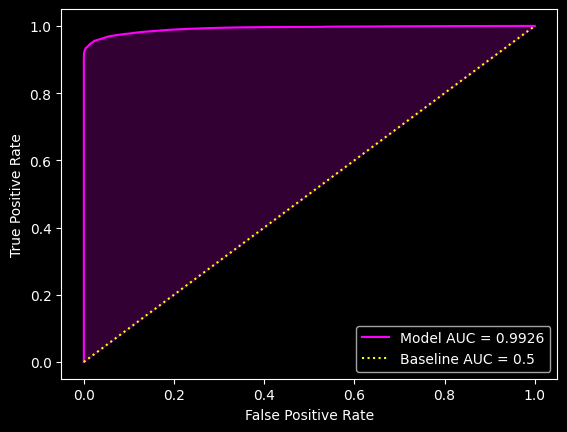

In [3]:
from home_credit.best_model_search import plot_roc_curve
from sklearn.metrics import roc_auc_score
y_train = res["resamples"]["y_train"]
train_pred_proba = res["preds"]["train"]["proba"]
overall_auc = res["scores"]['AUC']['overall']
print("overall AUC verif:", roc_auc_score(y_train, train_pred_proba))
plot_roc_curve(y_train, train_pred_proba, overall_auc)

Matrice de confusion


Confusion matrix


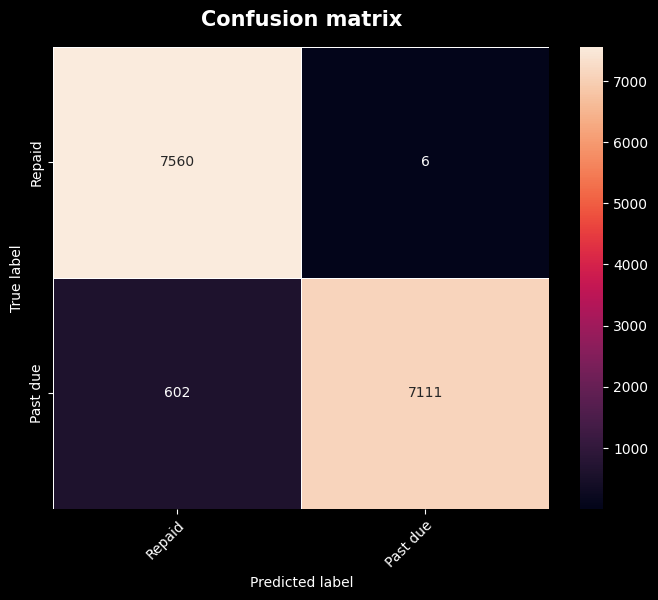

In [4]:
from pepper.scoring import show_confusion_matrix
y_train = res["resamples"]["y_train"]
train_pred_discr = res["preds"]["train"]["discr"]
show_confusion_matrix(y_train, train_pred_discr, ["Repaid", "Past due"])

Importance des caractéristiques

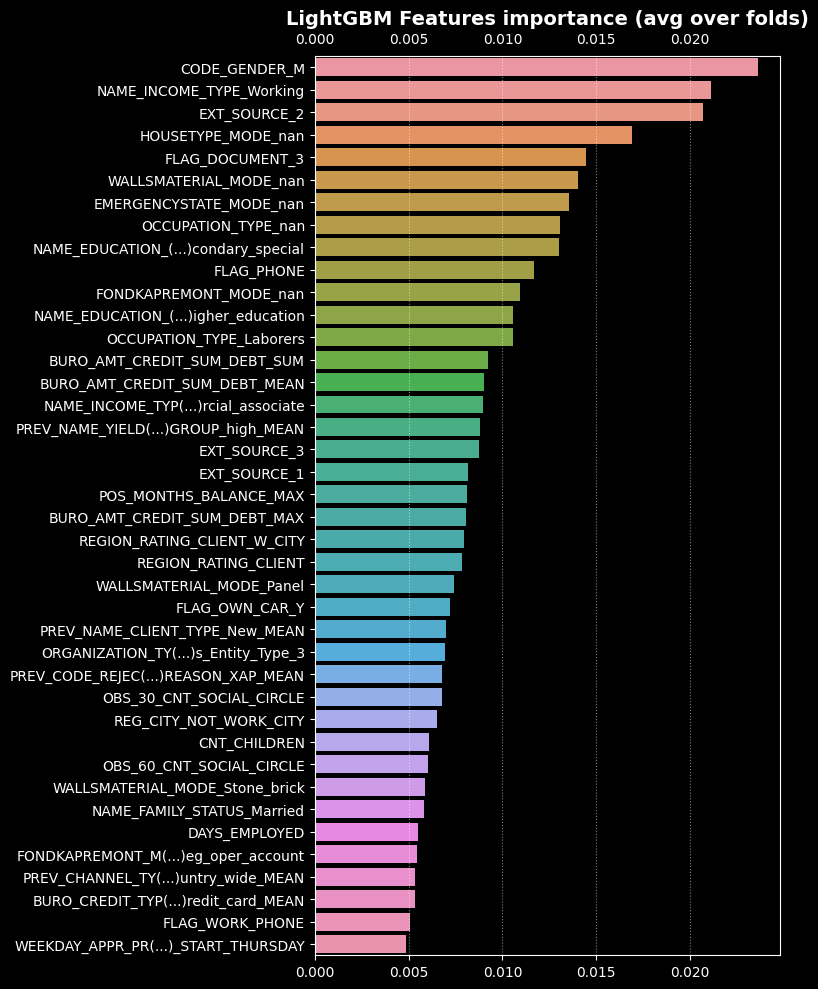

In [5]:
from home_credit.lightgbm_kernel_v2 import display_importances
feat_imps = res["feat_imps"]
selected_best_feats = display_importances(feat_imps)

## Modèle de performance : LGBM

Nous l'avons déjà étudié apprécié plus haut, il a été notre base de départ.

# Importances des caractéristiques et explication de modèle

Valeurs de Shapeley et SHAP

https://shap.readthedocs.io/en/latest/index.html

RuntimeError: Cannot install on Python version 3.11.1; only versions >=3.7,<3.11 are supported.

SHAP fait partie des retardataires.

## Explication de la régression logistique

Exécution de la régression logistique :

On récupère le classifieur entraîné et on interprète à l'aide de SHAP ce qu'il se passe à l'échelle de l'ensemble du jeu de données.

In [6]:
from home_credit.load import load_prep_dataset
from home_credit.best_model_search import kfold_train_and_eval_model
from sklearn.linear_model import LogisticRegression

data = load_prep_dataset("baseline_v1")
sample_10k = data.sample(10_000)
clf = LogisticRegression(C=1e-4, random_state=42)
res = kfold_train_and_eval_model(
    sample_10k, clf,
    verbosity=1,
    return_trained_clf=True
)

Starting train and eval of:
Labeled dataset of shape: (10000, 790)
Features set of shape: (10000, 788)
With:
Classifier: 


LogisticRegression(C=0.0001, random_state=42)

Loss function: 


{'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

Eval metrics: 


{'F2': <function home_credit.best_model_search.<lambda>(y_valid, y_pred)>,
 'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

On 5 KFolds: 
Sampler: 


SMOTETomek()

Original dataset shape: Counter({0.0: 7880, -1.0: 1439, 1.0: 681})
Resampled dataset shape: Counter({1.0: 7732, -1.0: 7623, 0.0: 7563})
	Train shape: (15295, 788)
	Test shape: (7623, 788)
Fold  0 F2: 0.768374
Fold  0 AUC: 0.709677
Fold  1 F2: 0.688719
Fold  1 AUC: 0.674584
Fold  2 F2: 0.711875
Fold  2 AUC: 0.691724
Fold  3 F2: 0.721076
Fold  3 AUC: 0.699175
Fold  4 F2: 0.704945
Fold  4 AUC: 0.688924
Full F2: 0.719011
Full AUC: 0.691448


Interprétation basée sur les valeurs de Shapley (avec SHAP) :

In [8]:
display(res["trained_clf"])

LogisticRegression(C=0.0001, random_state=42)

In [11]:
def logreg_predict_proba(clf, x):
    return clf.predict_proba(x)[:,1]

def logreg_log_odds(clf, x):
    p = clf.predict_log_proba(x)
    return p[:,1] - p[:,0]

In [14]:
display(data)

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,CC_NAME_CONTRACT_STATUS_Sent_proposal_MIN_nan,CC_NAME_CONTRACT_STATUS_Sent_proposal_MAX_False,CC_NAME_CONTRACT_STATUS_Sent_proposal_MAX_True,CC_NAME_CONTRACT_STATUS_Sent_proposal_MAX_nan,CC_NAME_CONTRACT_STATUS_Signed_MIN_False,CC_NAME_CONTRACT_STATUS_Signed_MIN_True,CC_NAME_CONTRACT_STATUS_Signed_MIN_nan,CC_NAME_CONTRACT_STATUS_Signed_MAX_False,CC_NAME_CONTRACT_STATUS_Signed_MAX_True,CC_NAME_CONTRACT_STATUS_Signed_MAX_nan
0,100002,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461,-637,...,True,False,False,True,False,False,True,False,False,True
1,100003,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765,-1188,...,True,False,False,True,False,False,True,False,False,True
2,100004,0,0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046,-225,...,True,False,False,True,False,False,True,False,False,True
3,100006,0,0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005,-3039,...,False,True,False,False,True,False,False,True,False,False
4,100007,0,0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932,-3038,...,True,False,False,True,False,False,True,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
356250,456221,-1,0,121500.0,412560.0,17473.5,270000.0,0.002042,-19970,-5169,...,True,False,False,True,False,False,True,False,False,True
356251,456222,-1,2,157500.0,622413.0,31909.5,495000.0,0.035792,-11186,-1149,...,True,False,False,True,False,False,True,False,False,True
356252,456223,-1,1,202500.0,315000.0,33205.5,315000.0,0.026392,-15922,-3037,...,True,False,False,True,False,False,True,False,False,True
356253,456224,-1,0,225000.0,450000.0,25128.0,450000.0,0.018850,-13968,-2731,...,True,False,False,True,False,False,True,False,False,True


In [13]:
import shap

# Exclude non-feature columns
not_feat_names = ["TARGET", "SK_ID_CURR", "SK_ID_BUREAU", "SK_ID_PREV", "index"]
feat_names = data.columns.difference(not_feat_names)
X = data[feat_names]
y = data.TARGET

# make a standard partial dependence plot
sample_ind = 18
fig,ax = shap.partial_dependence_plot(
    "CODE_GENDER_M", logreg_predict_proba, X, model_expected_value=True,
    feature_expected_value=True, show=False, ice=False
)

TypeError: numpy boolean subtract, the `-` operator, is not supported, use the bitwise_xor, the `^` operator, or the logical_xor function instead.

In [15]:
explainer = shap.TreeExplainer(clf)
display(explainer)

InvalidModelError: Model type not yet supported by TreeExplainer: <class 'sklearn.linear_model._logistic.LogisticRegression'>

## Explication du modèle LGBM

In [20]:
from home_credit.load import load_prep_dataset
from home_credit.best_model_search import kfold_train_and_eval_model
from home_credit.lightgbm_kernel_v2 import get_opt_lgbm_classifier

data = load_prep_dataset("baseline_v1")
sample_10k = data.sample(10_000)
clf = get_opt_lgbm_classifier()
res = kfold_train_and_eval_model(
    sample_10k, clf,
    verbosity=1,
    return_trained_clf=True
)

Starting train and eval of:
Labeled dataset of shape: (10000, 790)
Features set of shape: (10000, 788)
With:
Classifier: 


LGBMClassifier(callbacks=None, colsample_bytree=0.9497036, learning_rate=0.02,
               max_depth=8, min_child_weight=39.3259775,
               min_split_gain=0.0222415, n_estimators=10000, n_jobs=4,
               num_leaves=34, reg_alpha=0.041545473, reg_lambda=0.0735294,
               subsample=0.8715623)

Loss function: 


{'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

Eval metrics: 


{'F2': <function home_credit.best_model_search.<lambda>(y_valid, y_pred)>,
 'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

On 5 KFolds: 
Sampler: 


SMOTETomek()

Original dataset shape: Counter({0.0: 7929, -1.0: 1382, 1.0: 689})
Resampled dataset shape: Counter({1.0: 7718, -1.0: 7687, 0.0: 7592})
	Train shape: (15310, 788)
	Test shape: (7687, 788)
[200]	training's binary_logloss: 0.14362	valid_1's binary_logloss: 0.160164
[400]	training's binary_logloss: 0.105498	valid_1's binary_logloss: 0.135968
[600]	training's binary_logloss: 0.0888959	valid_1's binary_logloss: 0.131345
[800]	training's binary_logloss: 0.0776405	valid_1's binary_logloss: 0.129553
[1000]	training's binary_logloss: 0.0691532	valid_1's binary_logloss: 0.128319
[1200]	training's binary_logloss: 0.062559	valid_1's binary_logloss: 0.127621
Fold  0 F2: 0.937170
Fold  0 AUC: 0.983726
[200]	training's binary_logloss: 0.14207	valid_1's binary_logloss: 0.163544
[400]	training's binary_logloss: 0.103995	valid_1's binary_logloss: 0.140456
[600]	training's binary_logloss: 0.0879184	valid_1's binary_logloss: 0.135803
[800]	training's binary_logloss: 0.0768787	valid_1's binary_logloss: 0.1

In [22]:
import shap

# Exclude non-feature columns
not_feat_names = ["TARGET", "SK_ID_CURR", "SK_ID_BUREAU", "SK_ID_PREV", "index"]
feat_names = data.columns.difference(not_feat_names)
X = data[feat_names]
y = data.TARGET

explainer = shap.TreeExplainer(clf)
shap_values = explainer.shap_values(X)  # TODO : X_test plutôt, non ?

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


In [23]:
shap.initjs()
shap.force_plot(
    explainer.expected_value[0], shap_values[0][0,:], 
    features=X.iloc[0, :])

In [25]:
import numpy as np
print(f'shape of test dataset: {X.shape}')
print(f'type of shap_values: {type(shap_values)}. length of the list: {len(shap_values)}')
print(f'shape of shap_values: {np.array(shap_values).shape}')

shape of test dataset: (356255, 788)
type of shap_values: <class 'list'>. length of the list: 2
shape of shap_values: (2, 356255, 788)


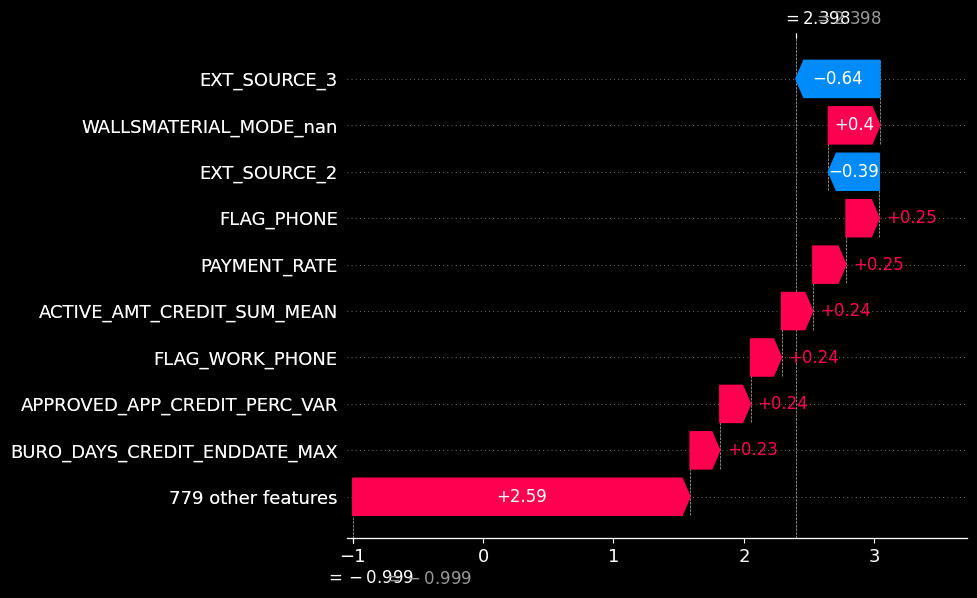

In [26]:
shap.plots._waterfall.waterfall_legacy(
    explainer.expected_value[0],
    shap_values[0][0], 
    feature_names=X.columns
)

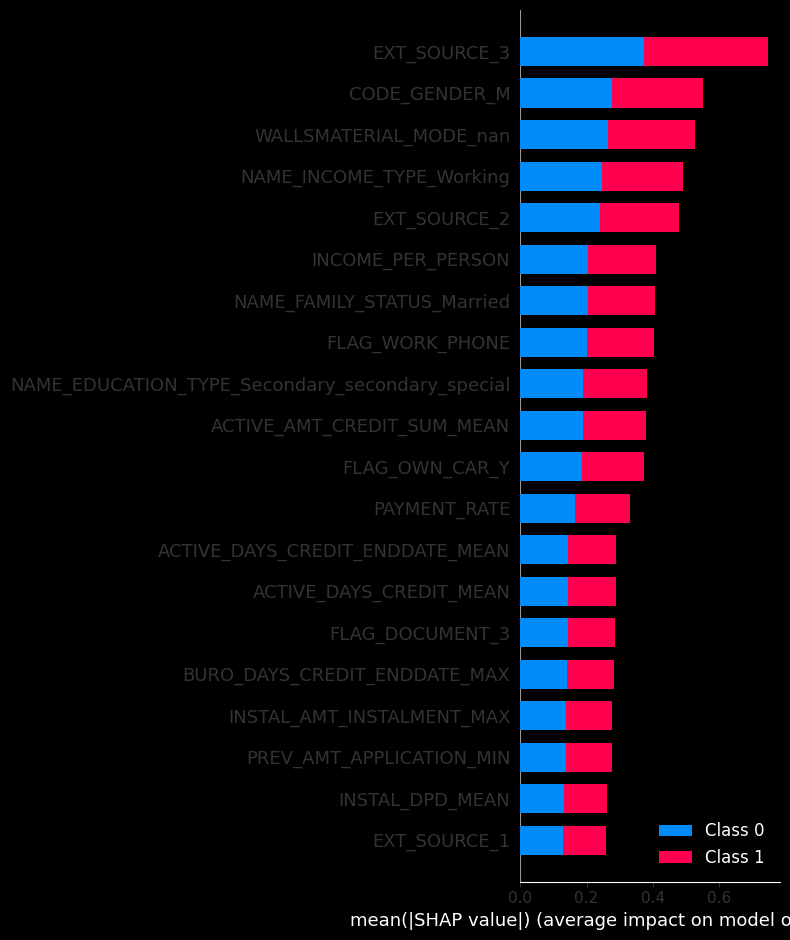

In [27]:
shap.summary_plot(shap_values, features=X)

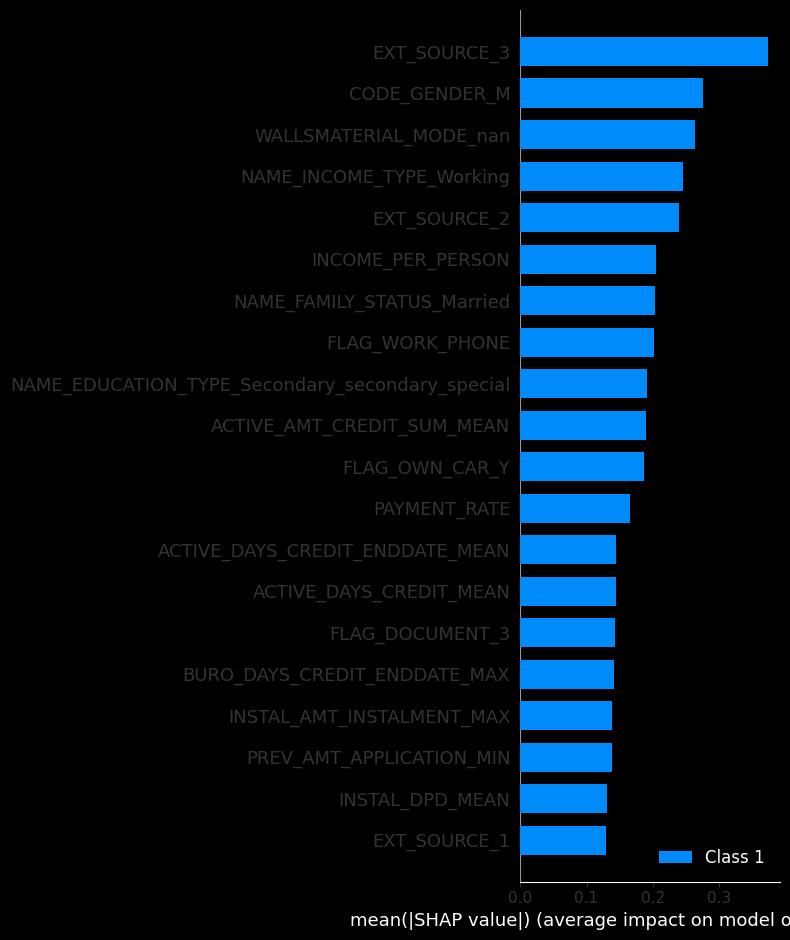

In [29]:
shap.summary_plot(shap_values, features=X, class_inds=[1])

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


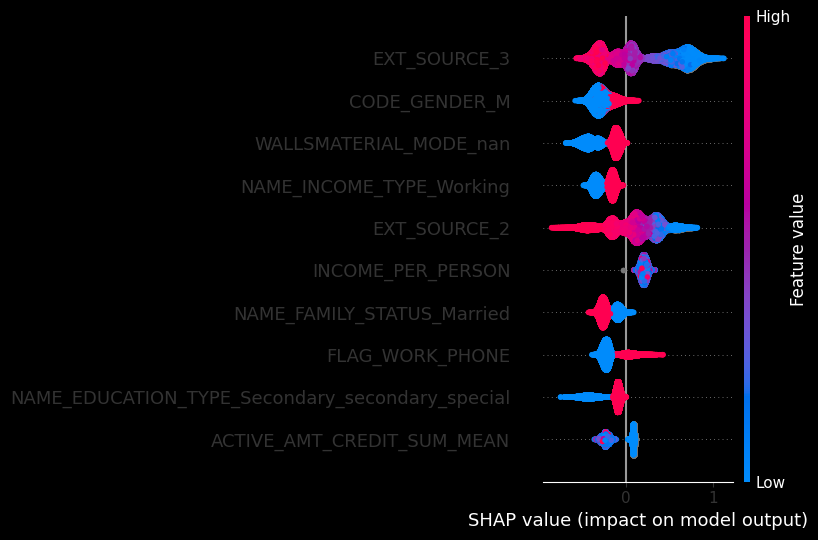

In [30]:
shap.summary_plot(shap_values[1], features=X, max_display=10)

In [ ]:
explainer = shap.Explainer(clf, X[y > -1].to_numpy())  # X_train
shap_values = explainer(X[y > -1].to_numpy(), check_additivity=False)  # X_train
shap.plots.bar(shap_values)

# Choix du meilleur modèle

Nous avons pré-évalué 3 types de modèles, régression logistique, forêt aléatoire et LightGBM, sur la base d'un petit échantillon.

Il s'agit à présent de passer à l'échelle, avec d'une part un échantillon plus important, et une recherche en grille des meilleures configurations.

Il ne s'agit pas seulement de faire jouer les hyper-paramètres de la LGBM, qui est la meilleure candidate pour la haute performance, mais de jouer également sur les paramètres liés à la préparation des données, l'échantillonnage équilibré et la mise à l'échelle des données.

Nous n'utiliserons pas la pipeline de SKL, étant donné que notre fonction `kfold_train_and_eval_model` en est déjà une.

**Note du 5 mai** - Dans l'obligation de livrer sans disposer d'un temps raisonnable pour couvrir l'ensemble des demandes, nous nous voyons dans l'obligation de passer aux étapes aval sans avoir pu mener une véritable recherche en grille avec variation des combinaison d'hyperparamètres, ni sans avoir également fait varier les paramètres de pré-traitement des données, alors que le framework pour le faire est en place. Ce n'est donc pas une faute de conception ou de méthodologie, mais un manque de moyens alloués pour réaliser cette stratégie.

Nous nous contentons donc ici de dérouler la pipeline d'entrainement et de mesure des performances prédictives élaborée dans les sections précédentes et en particulier dans la section `kfold_train_and_eval_model_v2`.

Ce que nous faisons varier :
1. Les 3 modèles, à paramètres fixes, en anticipant que la LightGBM donnera les meilleurs résultats.
2. Les tailles des échantillons d'entrainement : 
    * `_10k` : échantillon de $10\,000$ individus (3.25\,\%$).
    * `_100k` : échantillon de $100\,000$ individus (32.5\,\%$).
    * `_50pcts` : échantillon de $50\,\%$ de la population ($153\,756$ individus).
    * `_75pcts` : échantillon de $75\,\%$ de la population ($230\,633$ individus).
    * `_85pcts` : échantillon de $85\,\%$ de la population ($261\,384$ individus).
    * `_95pcts` : échantillon de $95\,\%$ de la population ($292\,135$ individus).
3. les seuils de prédiction des cas positifs : 50 %, 45 %, 40 %, 35 %

Pour des raisons pratiques, nous divisons cette évaluation en 3 sections principales, une par type de modèle, puis en sections secondaires, une par taille d'échantillon.

Les détails des étapes ayant été explicités plus hauts, nous nous contentons ici du code, dense, et des rapports générés qui sont suffisamment explicites. Quelques commentaires viendront compléter ici et là les résultats remarquables observables dans les rapports.

Pour satisfaire l'une des exigences pléthoriques du projet, les expériences menées ci-après seront enregistrées dans une instance `mlflow` (un dossier `mlruns/` local qui fera partie du livrable). Notons que cela nous oblige de quitter Python 3.11 et ses performances amliorées pour un retour à Python 3.10.

## A exécuter avant de démarrer

Fixe la localisation du dossier `mlruns/` dans le sous dossier `tmp/` du projet.

A défaut, le lancement depuis ce notebook va créer un dossier `mlruns/` comme sous-dossier du dossier parent, donc dans le dossier `notebooks/experiments`.

In [1]:
import mlflow
from home_credit.load import get_mlflow_dir
print("default `mlruns/`:", mlflow.get_tracking_uri())
mlflow.set_tracking_uri("file://" + get_mlflow_dir())
print("this project `mlruns/`:", mlflow.get_tracking_uri())

default `mlruns/`: file:///c:/Users/franc/Projects/pepper_credit_scoring_tool/notebooks/experiments/mlruns
this project `mlruns/`: file://C:\Users\franc\Projects\pepper_credit_scoring_tool\tmp\mlruns


Pour rappel, pour visualiser dans l'UI les enregistrements de modèles et d'expériences dans mlflow :

Depuis le terminal, soit se déplacer jusqu'au sous-dossier `tmp/` du projet :

```sh
$ py3105 -m mlflow ui
```

Soit, de n'importe où :

```sh
$ py3105 -m mlflow ui --backend-store-uri <path_to_mlruns>
```

Une fois lancé, s'il ne rencontre pas de problème au démarrage, il indique à quelle URL:port on peut y accéder depuis un navigateur, en l'occurrence, l'adresse est celle générique de `localhost` :

```sh
INFO:waitress:Serving on http://127.0.0.1:5000
```

## Régression logistique

### `50pcts`

default `mlruns/`: file://C:\Users\franc\Projects\pepper_credit_scoring_tool\tmp\mlruns
this project `mlruns/`: file://C:\Users\franc\Projects\pepper_credit_scoring_tool\tmp\mlruns


2023/05/06 14:23:50 INFO mlflow.tracking.fluent: Experiment with name 'LogisticRegression_train_baseline_50pcts' does not exist. Creating a new experiment.



Starting train and eval of:
Labeled dataset of shape: (153756, 790)
Features set of shape: (153756, 788)

With:
Classifier: 


LogisticRegression(C=0.0001, random_state=42)

Loss function: 


{'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

Eval metrics: 


{'F2': <function home_credit.best_model_search.<lambda>(y, y_pred)>,
 'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

On 5 KFolds: 

Resampling
Sampler: 


RandomUnderSampler(random_state=42)

Original dataset shape: Counter({0.0: 141324, 1.0: 12432})
Resampled dataset shape: Counter({0.0: 12432, 1.0: 12432})
Data shape: (24864, 788)

Evaluate the 1-th fold (on 5)
Fold  0 F2: 0.647092
Fold  0 AUC: 0.691855

Evaluate the 2-th fold (on 5)
Fold  1 F2: 0.645044
Fold  1 AUC: 0.687888

Evaluate the 3-th fold (on 5)
Fold  2 F2: 0.644187
Fold  2 AUC: 0.685698

Evaluate the 4-th fold (on 5)
Fold  3 F2: 0.641015
Fold  3 AUC: 0.684159

Evaluate the 5-th fold (on 5)
Fold  4 F2: 0.641322
Fold  4 AUC: 0.692186
Full F2: 0.643725
Full AUC: 0.688243
Train time (min.): 1.0

Post train eval with threshold of 45.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (153756, 788)	ys class counts : (array([0., 1.]), array([141324,  12432], dtype=int64))
Xrs : shape (24864, 788)	yrs class counts : (array([0., 1.]), array([12432, 12432], dtype=int64))
Xv : shape (153755, 788)	yv class counts : (array([0., 1.]), array([141362,  12393], dtype=

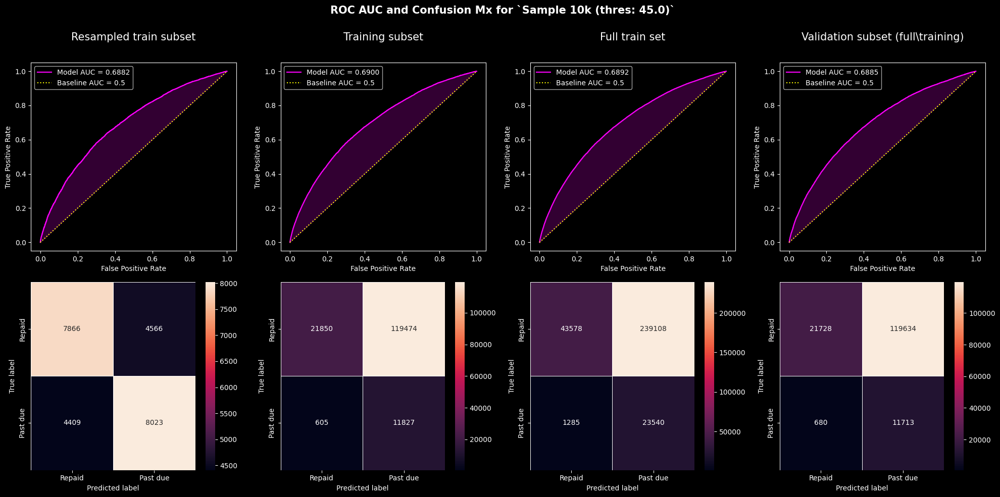


Validation set metrics
ROC AUC: 0.6884684595786571
Accuracy: 0.2174953660043576
ARI: -0.052512866504493064
Jaccard Index: 0.12201671841762476
Precision: 0.2174953660043576
Recall: 0.2174953660043576
F1: 0.2174953660043576
F2: 0.2174953660043576
F4: 0.2174953660043576
F8: 0.2174953660043576
F16: 0.2174953660043576

Undersampled validation set metrics
Original dataset shape Counter({0.0: 141362, 1.0: 12393})
Resampled dataset shape Counter({0.0: 12393, 1.0: 12393})
ROC AUC: 0.686434068151416
Accuracy: 0.550956184943113
ARI: 0.010371017901365603
Jaccard Index: 0.3802205145339125
Precision: 0.550956184943113
Recall: 0.550956184943113
F1: 0.550956184943113
F2: 0.550956184943113
F4: 0.550956184943113
F8: 0.550956184943113
F16: 0.550956184943113


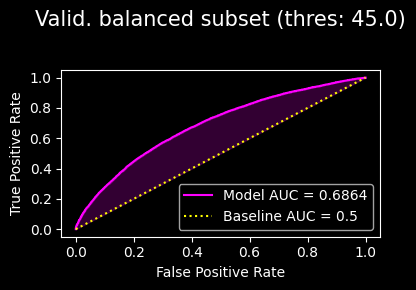

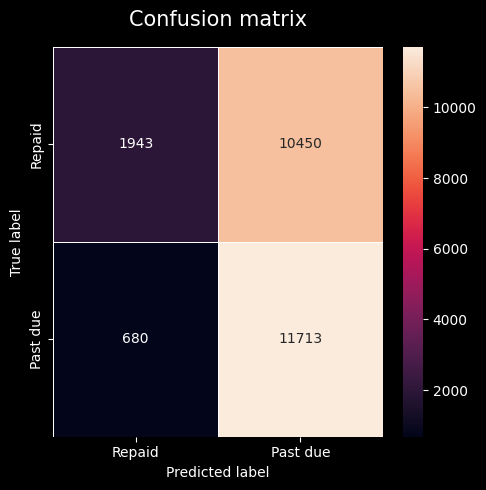

45 % exp res: AUC (0.686434068151416), FNR (0.34997426659804426), FPR (0.8921710919491164)

Post train eval with threshold of 40.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (153756, 788)	ys class counts : (array([0., 1.]), array([141324,  12432], dtype=int64))
Xrs : shape (24864, 788)	yrs class counts : (array([0., 1.]), array([12432, 12432], dtype=int64))
Xv : shape (153755, 788)	yv class counts : (array([0., 1.]), array([141362,  12393], dtype=int64))


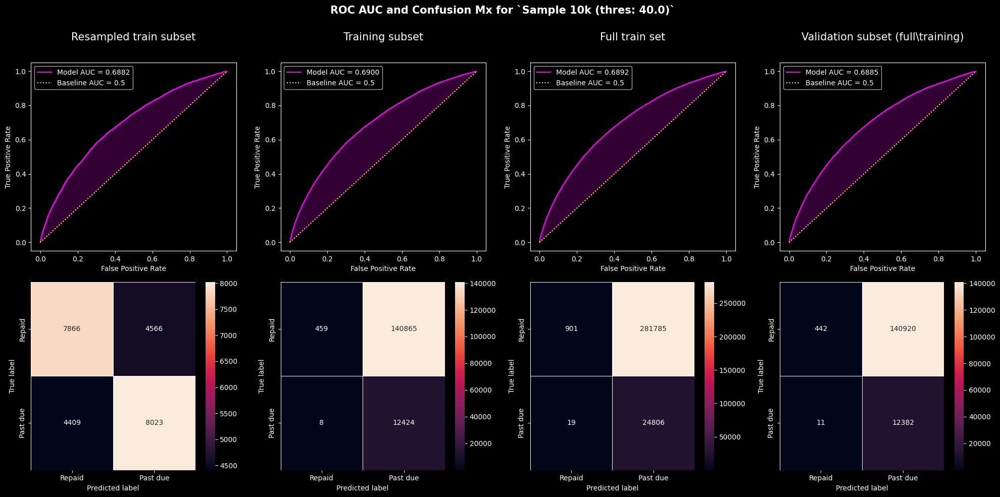


Validation set metrics
ROC AUC: 0.6884684595786571
Accuracy: 0.08340541770999317
ARI: -0.003631511686791561
Jaccard Index: 0.04351750676991781
Precision: 0.08340541770999317
Recall: 0.08340541770999317
F1: 0.08340541770999317
F2: 0.08340541770999317
F4: 0.08340541770999317
F8: 0.08340541770999317
F16: 0.08340541770999317

Undersampled validation set metrics
Original dataset shape Counter({0.0: 141362, 1.0: 12393})
Resampled dataset shape Counter({0.0: 12393, 1.0: 12393})
ROC AUC: 0.686434068151416
Accuracy: 0.5008875978374889
ARI: 2.8653339224595924e-06
Jaccard Index: 0.33412277632747533
Precision: 0.5008875978374889
Recall: 0.5008875978374889
F1: 0.5008875978374889
F2: 0.5008875978374889
F4: 0.5008875978374889
F8: 0.5008875978374889
F16: 0.5008875978374889


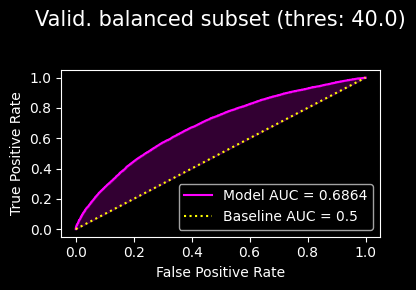

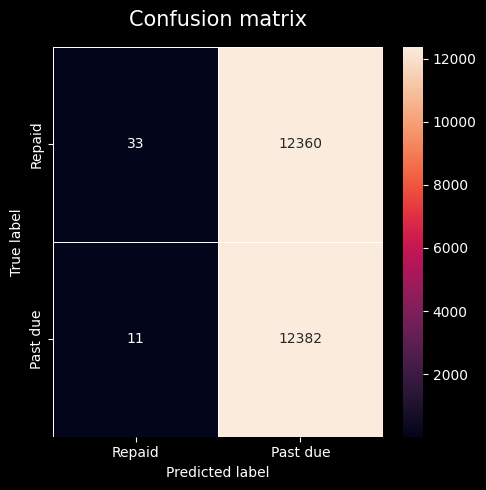

40 % exp res: AUC (0.686434068151416), FNR (0.3333333333333333), FPR (0.9982232272653853)

Post train eval with threshold of 35.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (153756, 788)	ys class counts : (array([0., 1.]), array([141324,  12432], dtype=int64))
Xrs : shape (24864, 788)	yrs class counts : (array([0., 1.]), array([12432, 12432], dtype=int64))
Xv : shape (153755, 788)	yv class counts : (array([0., 1.]), array([141362,  12393], dtype=int64))


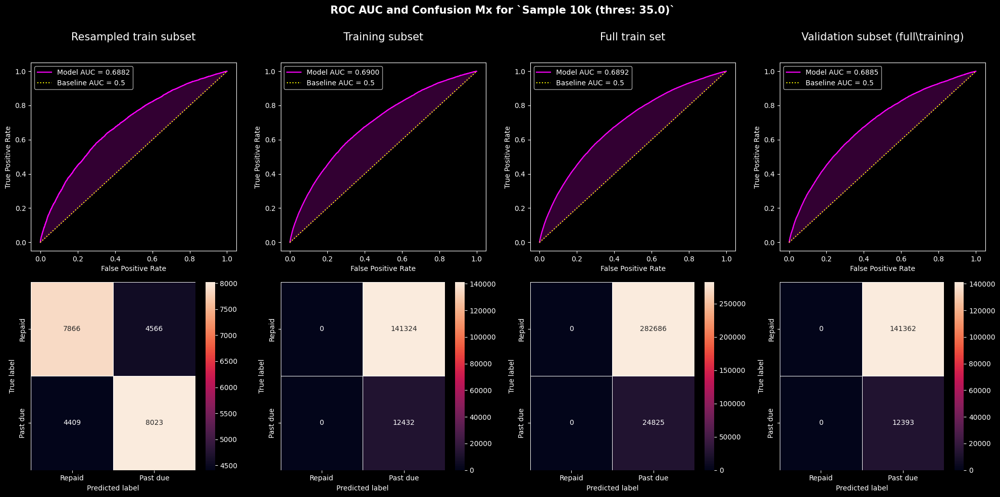


Validation set metrics
ROC AUC: 0.6884684595786571
Accuracy: 0.08060225683717602
ARI: 0.0
Jaccard Index: 0.04199351443664716
Precision: 0.08060225683717602
Recall: 0.08060225683717602
F1: 0.08060225683717602
F2: 0.080602256837176
F4: 0.08060225683717602
F8: 0.08060225683717602
F16: 0.08060225683717602

Undersampled validation set metrics
Original dataset shape Counter({0.0: 141362, 1.0: 12393})
Resampled dataset shape Counter({0.0: 12393, 1.0: 12393})
ROC AUC: 0.686434068151416
Accuracy: 0.5
ARI: 0.0
Jaccard Index: 0.3333333333333333
Precision: 0.5
Recall: 0.5
F1: 0.5
F2: 0.5
F4: 0.5
F8: 0.5
F16: 0.5


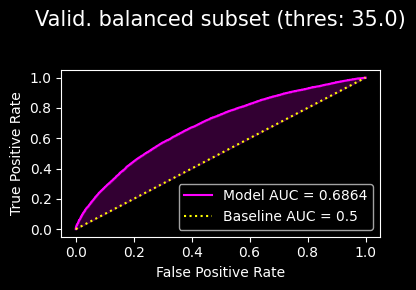

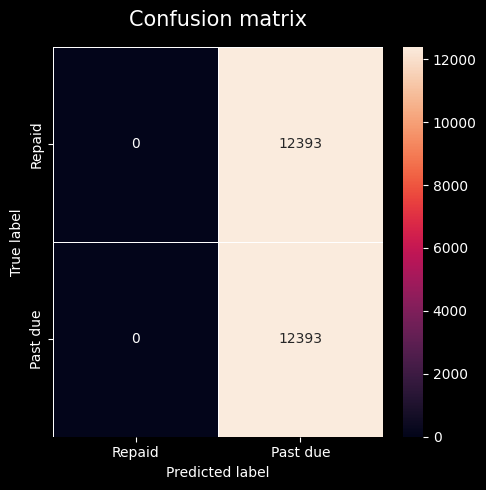

C:\Users\franc\Projects\pepper_credit_scoring_tool\modules\home_credit\mlflow_tracking.py:83: RuntimeWarning: invalid value encountered in longlong_scalars
  fnr, fpr = fn / tn, fp / tp


35 % exp res: AUC (0.686434068151416), FNR (nan), FPR (1.0)
Mlflow run (64e825c4aee04e40b8f129c8fd123849) completed


In [6]:
from sklearn import linear_model
from home_credit.mlflow_tracking import do_first_experiment

run_id = do_first_experiment(
    trainset_name="train_baseline_50pcts",
    clf=linear_model.LogisticRegression(C=1e-4, random_state=42)
)
print(f"Mlflow run ({run_id}) completed")

### `95pcts`

default `mlruns/`: file://C:\Users\franc\Projects\pepper_credit_scoring_tool\tmp\mlruns
this project `mlruns/`: file://C:\Users\franc\Projects\pepper_credit_scoring_tool\tmp\mlruns


2023/05/06 15:12:39 INFO mlflow.tracking.fluent: Experiment with name 'LogisticRegression_train_baseline_95pcts' does not exist. Creating a new experiment.



Starting train and eval of:
Labeled dataset of shape: (292135, 790)
Features set of shape: (292135, 788)

With:
Classifier: 


LogisticRegression(C=0.0001, random_state=42)

Loss function: 


{'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

Eval metrics: 


{'F2': <function home_credit.best_model_search.<lambda>(y, y_pred)>,
 'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

On 5 KFolds: 

Resampling
Sampler: 


RandomUnderSampler(random_state=42)

Original dataset shape: Counter({0.0: 268517, 1.0: 23618})
Resampled dataset shape: Counter({0.0: 23618, 1.0: 23618})
Data shape: (47236, 788)

Evaluate the 1-th fold (on 5)
Fold  0 F2: 0.628263
Fold  0 AUC: 0.693986

Evaluate the 2-th fold (on 5)
Fold  1 F2: 0.660706
Fold  1 AUC: 0.702155

Evaluate the 3-th fold (on 5)
Fold  2 F2: 0.638065
Fold  2 AUC: 0.699994

Evaluate the 4-th fold (on 5)
Fold  3 F2: 0.647980
Fold  3 AUC: 0.695721

Evaluate the 5-th fold (on 5)
Fold  4 F2: 0.650857
Fold  4 AUC: 0.695337
Full F2: 0.645130
Full AUC: 0.697002
Train time (min.): 2.7

Post train eval with threshold of 45.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (292135, 788)	ys class counts : (array([0., 1.]), array([268517,  23618], dtype=int64))
Xrs : shape (47236, 788)	yrs class counts : (array([0., 1.]), array([23618, 23618], dtype=int64))
Xv : shape (15376, 788)	yv class counts : (array([0., 1.]), array([14169,  1207], dtype=int

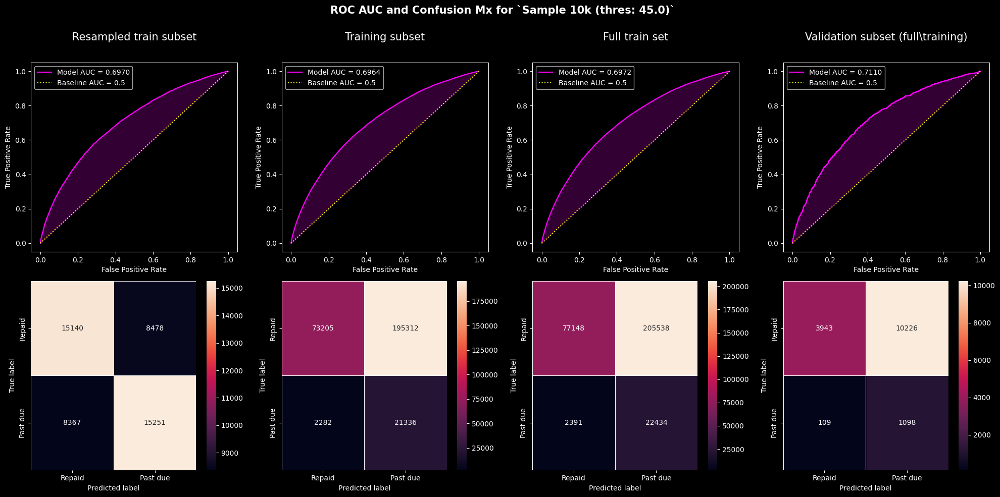


Validation set metrics
ROC AUC: 0.710995911994533
Accuracy: 0.32784859521331944
ARI: -0.04806812982298072
Jaccard Index: 0.19606394150363657
Precision: 0.32784859521331944
Recall: 0.32784859521331944
F1: 0.32784859521331944
F2: 0.32784859521331944
F4: 0.32784859521331944
F8: 0.32784859521331944
F16: 0.32784859521331944

Undersampled validation set metrics
Original dataset shape Counter({0.0: 14169, 1.0: 1207})
Resampled dataset shape Counter({0.0: 1207, 1.0: 1207})
ROC AUC: 0.7172301316059523
Accuracy: 0.5911350455675228
ARI: 0.03298430623359505
Jaccard Index: 0.4195824757424287
Precision: 0.5911350455675228
Recall: 0.5911350455675228
F1: 0.5911350455675228
F2: 0.5911350455675228
F4: 0.5911350455675228
F8: 0.5911350455675228
F16: 0.5911350455675228


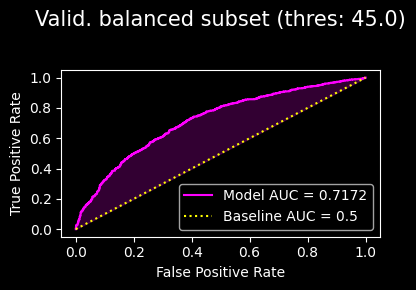

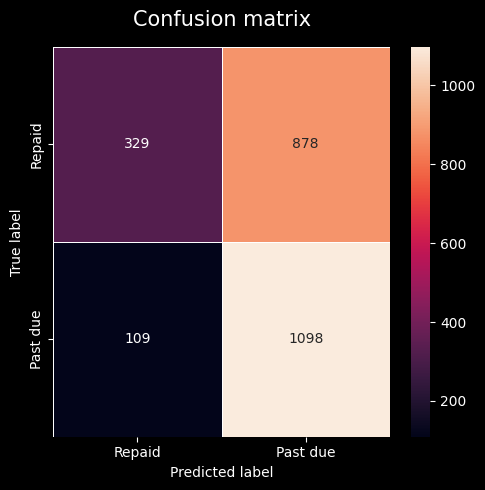

45 % exp res: AUC (0.7172301316059523), FNR (0.331306990881459), FPR (0.7996357012750456)

Post train eval with threshold of 40.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (292135, 788)	ys class counts : (array([0., 1.]), array([268517,  23618], dtype=int64))
Xrs : shape (47236, 788)	yrs class counts : (array([0., 1.]), array([23618, 23618], dtype=int64))
Xv : shape (15376, 788)	yv class counts : (array([0., 1.]), array([14169,  1207], dtype=int64))


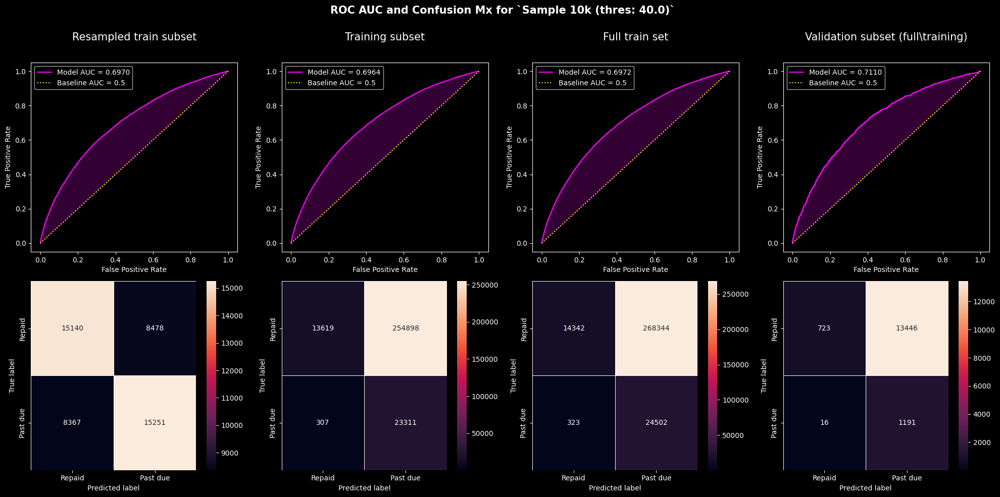


Validation set metrics
ROC AUC: 0.710995911994533
Accuracy: 0.12447970863683663
ARI: -0.03943498562622825
Jaccard Index: 0.06637076080171996
Precision: 0.12447970863683663
Recall: 0.12447970863683663
F1: 0.12447970863683663
F2: 0.12447970863683663
F4: 0.12447970863683663
F8: 0.12447970863683662
F16: 0.12447970863683663

Undersampled validation set metrics
Original dataset shape Counter({0.0: 14169, 1.0: 1207})
Resampled dataset shape Counter({0.0: 1207, 1.0: 1207})
ROC AUC: 0.7172301316059523
Accuracy: 0.519884009942005
ARI: 0.001528461371038918
Jaccard Index: 0.3512454520011195
Precision: 0.519884009942005
Recall: 0.519884009942005
F1: 0.519884009942005
F2: 0.519884009942005
F4: 0.519884009942005
F8: 0.519884009942005
F16: 0.519884009942005


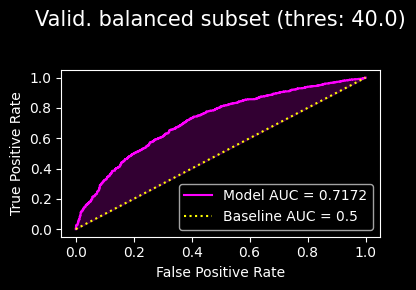

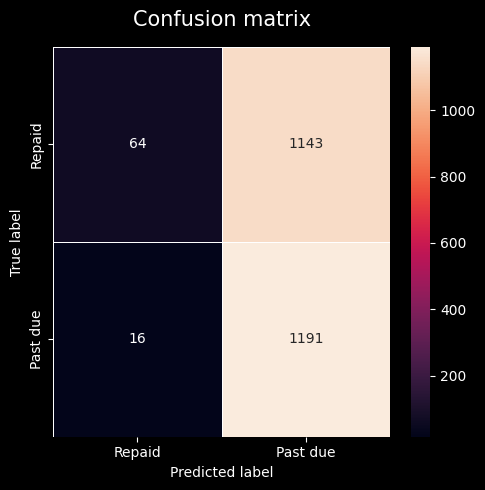

40 % exp res: AUC (0.7172301316059523), FNR (0.25), FPR (0.9596977329974811)

Post train eval with threshold of 35.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (292135, 788)	ys class counts : (array([0., 1.]), array([268517,  23618], dtype=int64))
Xrs : shape (47236, 788)	yrs class counts : (array([0., 1.]), array([23618, 23618], dtype=int64))
Xv : shape (15376, 788)	yv class counts : (array([0., 1.]), array([14169,  1207], dtype=int64))


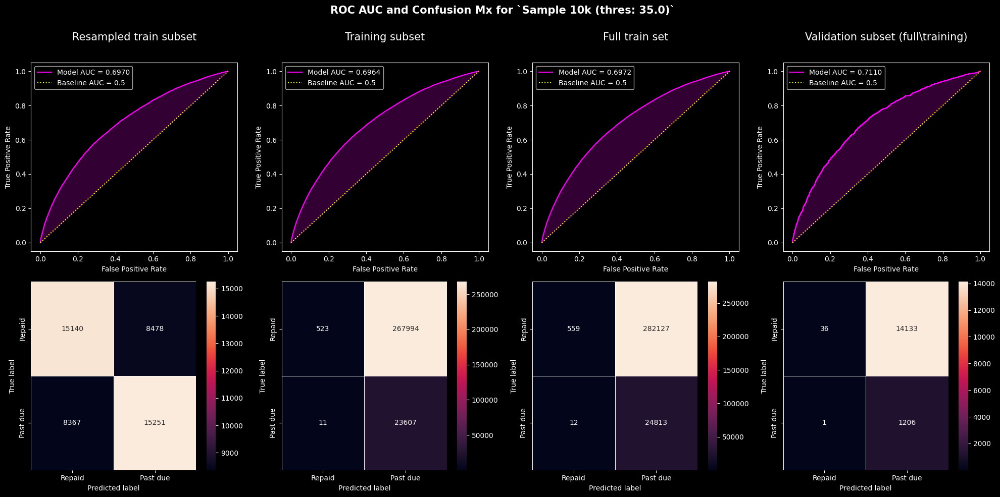


Validation set metrics
ROC AUC: 0.710995911994533
Accuracy: 0.08077523413111343
ARI: -0.0028065688151028187
Jaccard Index: 0.04208742799051169
Precision: 0.08077523413111343
Recall: 0.08077523413111343
F1: 0.08077523413111343
F2: 0.08077523413111343
F4: 0.08077523413111343
F8: 0.08077523413111343
F16: 0.08077523413111343

Undersampled validation set metrics
Original dataset shape Counter({0.0: 14169, 1.0: 1207})
Resampled dataset shape Counter({0.0: 1207, 1.0: 1207})
ROC AUC: 0.7172301316059523
Accuracy: 0.5008285004142502
ARI: 3.4135838477862344e-09
Jaccard Index: 0.33407018513401493
Precision: 0.5008285004142502
Recall: 0.5008285004142502
F1: 0.5008285004142502
F2: 0.5008285004142502
F4: 0.5008285004142502
F8: 0.5008285004142502
F16: 0.5008285004142502


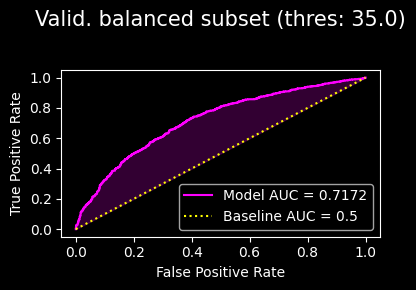

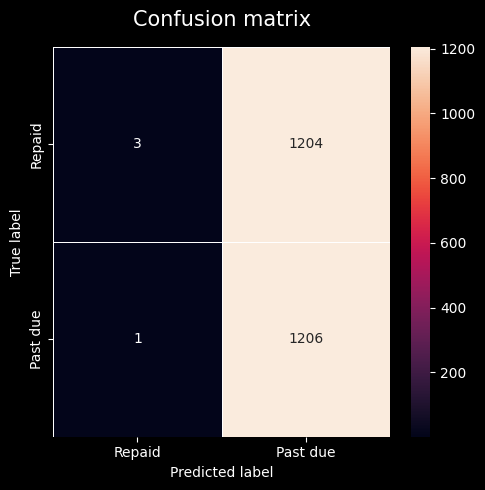

35 % exp res: AUC (0.7172301316059523), FNR (0.3333333333333333), FPR (0.9983416252072969)
Mlflow run (335d6814abe14e0290c0829f27d3d69f) completed


In [7]:
from sklearn import linear_model
from home_credit.mlflow_tracking import do_first_experiment

run_id = do_first_experiment(
    trainset_name="train_baseline_95pcts",
    clf=linear_model.LogisticRegression(C=1e-4, random_state=42)
)
print(f"Mlflow run ({run_id}) completed")

## Forêt aléatoire

### `50pcts`

default `mlruns/`: file://C:\Users\franc\Projects\pepper_credit_scoring_tool\tmp\mlruns
this project `mlruns/`: file://C:\Users\franc\Projects\pepper_credit_scoring_tool\tmp\mlruns

Starting train and eval of:
Labeled dataset of shape: (153756, 790)
Features set of shape: (153756, 788)

With:
Classifier: 


RandomForestClassifier(n_jobs=-1, random_state=42, verbose=1)

Loss function: 


{'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

Eval metrics: 


{'F2': <function home_credit.best_model_search.<lambda>(y, y_pred)>,
 'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

On 5 KFolds: 

Resampling
Sampler: 


RandomUnderSampler(random_state=42)

Original dataset shape: Counter({0.0: 141324, 1.0: 12432})
Resampled dataset shape: Counter({0.0: 12432, 1.0: 12432})
Data shape: (24864, 788)

Evaluate the 1-th fold (on 5)


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.2s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished


Fold  0 F2: 0.676889
Fold  0 AUC: 0.741176

Evaluate the 2-th fold (on 5)


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.9s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished


Fold  1 F2: 0.660324
Fold  1 AUC: 0.739160

Evaluate the 3-th fold (on 5)


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


Fold  2 F2: 0.669272
Fold  2 AUC: 0.749402

Evaluate the 4-th fold (on 5)


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.2s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished


Fold  3 F2: 0.674398
Fold  3 AUC: 0.745620

Evaluate the 5-th fold (on 5)


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.3s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished


Fold  4 F2: 0.670474
Fold  4 AUC: 0.738195
Full F2: 0.670284
Full AUC: 0.742705
Train time (min.): 1.3

Post train eval with threshold of 45.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (153756, 788)	ys class counts : (array([0., 1.]), array([141324,  12432], dtype=int64))
Xrs : shape (24864, 788)	yrs class counts : (array([0., 1.]), array([12432, 12432], dtype=int64))
Xv : shape (153755, 788)	yv class counts : (array([0., 1.]), array([141362,  12393], dtype=int64))


[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.8s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    1.9s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.7s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    3.2s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.3s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    1.3s finished


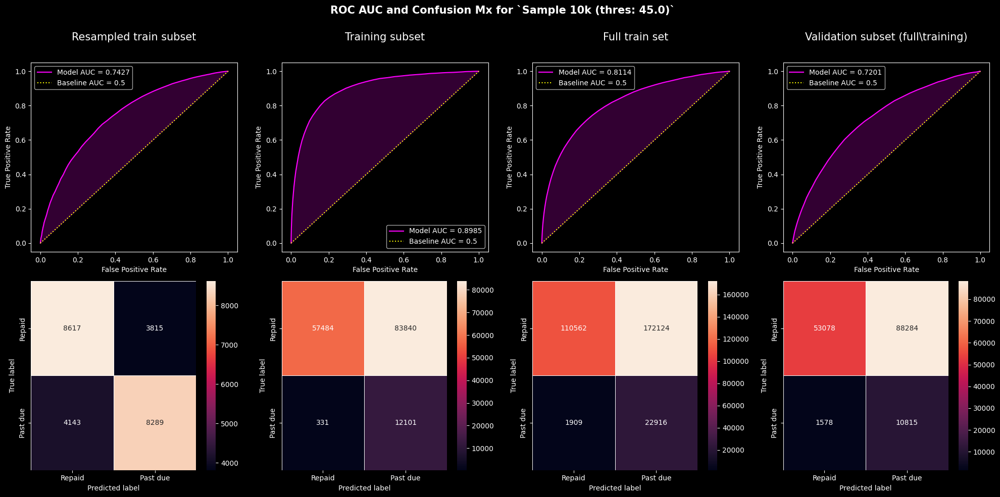


Validation set metrics


[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.3s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    1.2s finished


ROC AUC: 0.7200999024221293
Accuracy: 0.4155507137979253
ARI: -0.03214912819104839
Jaccard Index: 0.2622682325125094
Precision: 0.4155507137979253
Recall: 0.4155507137979253
F1: 0.4155507137979253
F2: 0.4155507137979253
F4: 0.4155507137979253
F8: 0.4155507137979253
F16: 0.4155507137979253

Undersampled validation set metrics
Original dataset shape Counter({0.0: 141362, 1.0: 12393})
Resampled dataset shape Counter({0.0: 12393, 1.0: 12393})


[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.1s finished


ROC AUC: 0.7201888722617711
Accuracy: 0.626321310417171
ARI: 0.06379969039545565
Jaccard Index: 0.45594454887218044
Precision: 0.626321310417171
Recall: 0.626321310417171
F1: 0.626321310417171
F2: 0.626321310417171
F4: 0.626321310417171
F8: 0.626321310417171
F16: 0.626321310417171


[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.1s finished


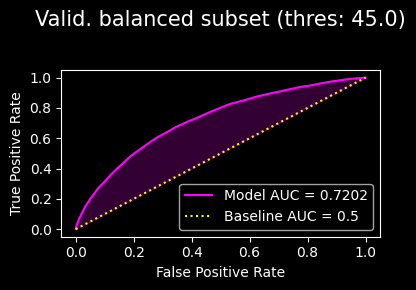

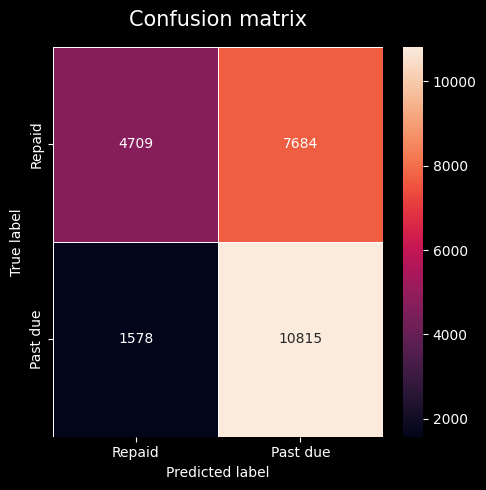

45 % exp res: AUC (0.7201888722617711), FNR (0.3351029942662986), FPR (0.7104946833102173)

Post train eval with threshold of 40.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (153756, 788)	ys class counts : (array([0., 1.]), array([141324,  12432], dtype=int64))
Xrs : shape (24864, 788)	yrs class counts : (array([0., 1.]), array([12432, 12432], dtype=int64))
Xv : shape (153755, 788)	yv class counts : (array([0., 1.]), array([141362,  12393], dtype=int64))


[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    1.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    1.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    3.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.3s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    1.3s finished


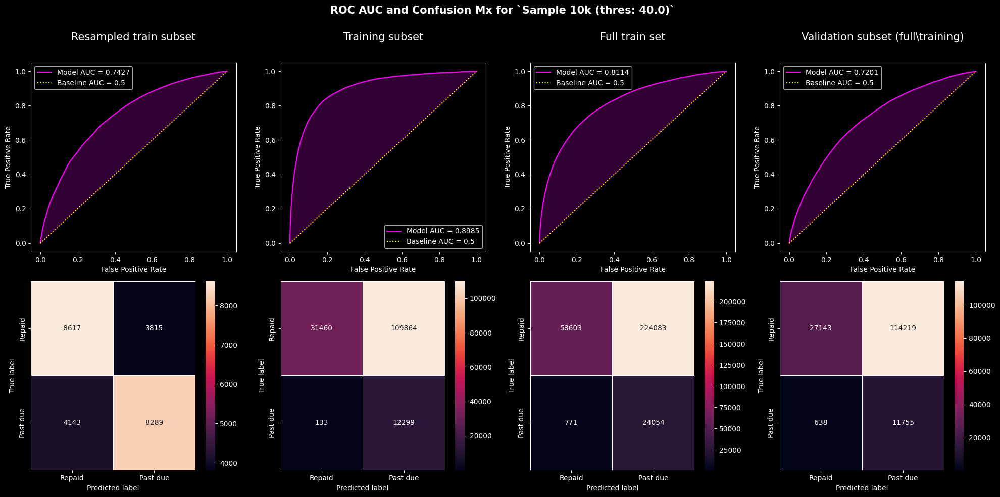


Validation set metrics


[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.3s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    1.2s finished


ROC AUC: 0.7200999024221293
Accuracy: 0.2529868947351306
ARI: -0.06015745002519426
Jaccard Index: 0.14481110300358882
Precision: 0.2529868947351306
Recall: 0.2529868947351306
F1: 0.2529868947351306
F2: 0.2529868947351306
F4: 0.2529868947351306
F8: 0.2529868947351306
F16: 0.2529868947351306

Undersampled validation set metrics
Original dataset shape Counter({0.0: 141362, 1.0: 12393})
Resampled dataset shape Counter({0.0: 12393, 1.0: 12393})


[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.2s finished


ROC AUC: 0.7201888722617711
Accuracy: 0.5685467602678932
ARI: 0.01877790752884876
Jaccard Index: 0.3971815107102593
Precision: 0.5685467602678932
Recall: 0.5685467602678932
F1: 0.5685467602678932
F2: 0.5685467602678932
F4: 0.5685467602678932
F8: 0.5685467602678932
F16: 0.5685467602678932


[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.1s finished


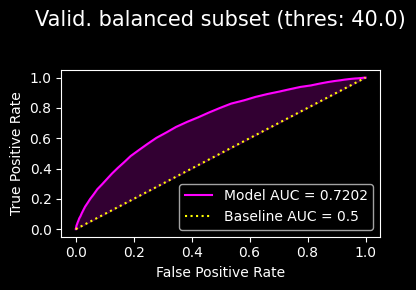

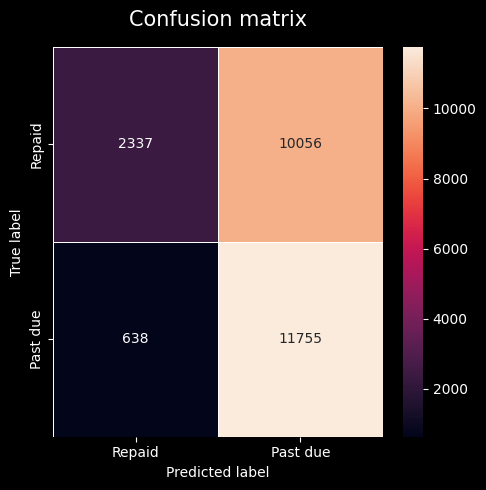

40 % exp res: AUC (0.7201888722617711), FNR (0.2729995721009842), FPR (0.8554657592513824)

Post train eval with threshold of 35.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (153756, 788)	ys class counts : (array([0., 1.]), array([141324,  12432], dtype=int64))
Xrs : shape (24864, 788)	yrs class counts : (array([0., 1.]), array([12432, 12432], dtype=int64))
Xv : shape (153755, 788)	yv class counts : (array([0., 1.]), array([141362,  12393], dtype=int64))


[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    1.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    1.9s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.9s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    3.3s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.3s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    1.3s finished


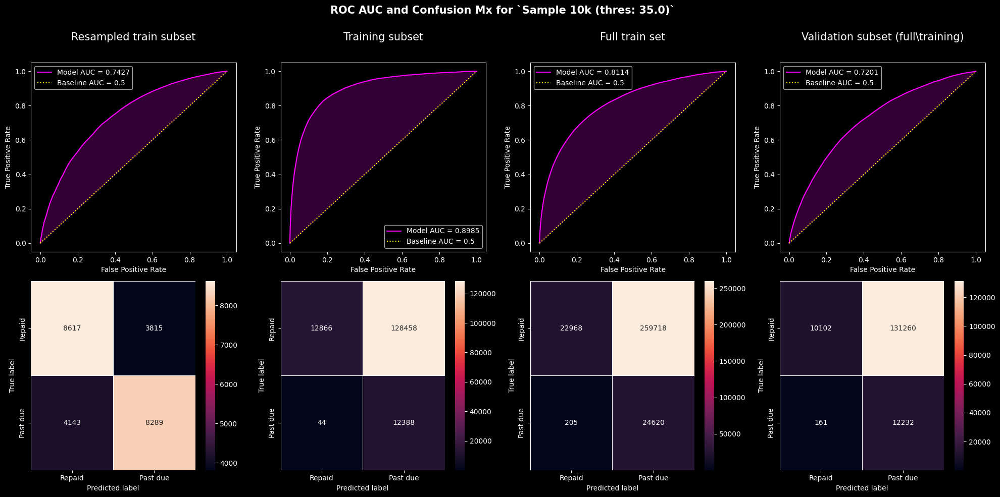


Validation set metrics


[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.3s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    1.4s finished


ROC AUC: 0.7200999024221293
Accuracy: 0.14525706481090045
ARI: -0.0527722187386209
Jaccard Index: 0.07831654837714254
Precision: 0.14525706481090045
Recall: 0.14525706481090045
F1: 0.14525706481090045
F2: 0.14525706481090045
F4: 0.14525706481090045
F8: 0.14525706481090045
F16: 0.14525706481090045

Undersampled validation set metrics
Original dataset shape Counter({0.0: 141362, 1.0: 12393})
Resampled dataset shape Counter({0.0: 12393, 1.0: 12393})


[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.1s finished


ROC AUC: 0.7201888722617711
Accuracy: 0.5292100379246348
ARI: 0.0034064041349578596
Jaccard Index: 0.35981346865999175
Precision: 0.5292100379246348
Recall: 0.5292100379246348
F1: 0.5292100379246348
F2: 0.5292100379246348
F4: 0.5292100379246348
F8: 0.5292100379246348
F16: 0.5292100379246348


[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.1s finished


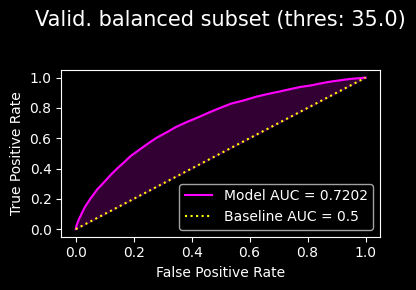

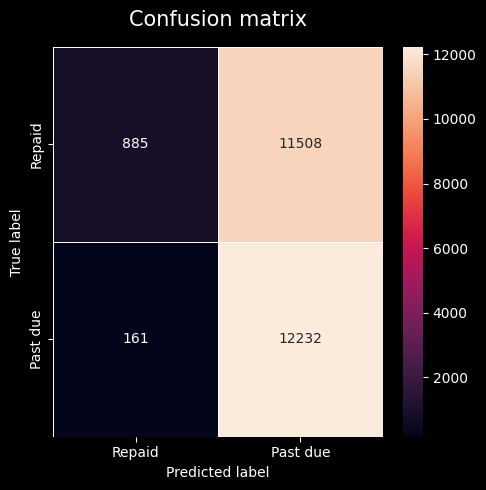

35 % exp res: AUC (0.7201888722617711), FNR (0.18192090395480226), FPR (0.9408109875735775)
Mlflow run (2e56faed257e4e7cb7b984269ac39302) completed


In [8]:
from sklearn import ensemble
from home_credit.mlflow_tracking import do_first_experiment

run_id = do_first_experiment(
    trainset_name="train_baseline_50pcts",
    clf=ensemble.RandomForestClassifier(
        n_estimators=100, random_state=42,
        verbose=1, n_jobs=-1
    )
)
print(f"Mlflow run ({run_id}) completed")

### `95pcts`

default `mlruns/`: file://C:\Users\franc\Projects\pepper_credit_scoring_tool\tmp\mlruns
this project `mlruns/`: file://C:\Users\franc\Projects\pepper_credit_scoring_tool\tmp\mlruns


2023/05/06 15:44:06 INFO mlflow.tracking.fluent: Experiment with name 'RandomForestClassifier_train_baseline_95pcts' does not exist. Creating a new experiment.



Starting train and eval of:
Labeled dataset of shape: (292135, 790)
Features set of shape: (292135, 788)

With:
Classifier: 


RandomForestClassifier(n_jobs=-1, random_state=42, verbose=1)

Loss function: 


{'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

Eval metrics: 


{'F2': <function home_credit.best_model_search.<lambda>(y, y_pred)>,
 'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

On 5 KFolds: 

Resampling
Sampler: 


RandomUnderSampler(random_state=42)

Original dataset shape: Counter({0.0: 268517, 1.0: 23618})
Resampled dataset shape: Counter({0.0: 23618, 1.0: 23618})
Data shape: (47236, 788)

Evaluate the 1-th fold (on 5)


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   19.5s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.1s finished


Fold  0 F2: 0.665081
Fold  0 AUC: 0.738003

Evaluate the 2-th fold (on 5)


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   19.1s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.1s finished


Fold  1 F2: 0.678768
Fold  1 AUC: 0.749985

Evaluate the 3-th fold (on 5)


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   19.3s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.1s finished


Fold  2 F2: 0.661743
Fold  2 AUC: 0.741127

Evaluate the 4-th fold (on 5)


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   19.3s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.1s finished


Fold  3 F2: 0.676805
Fold  3 AUC: 0.743129

Evaluate the 5-th fold (on 5)


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   21.6s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.2s finished


Fold  4 F2: 0.673355
Fold  4 AUC: 0.746554
Full F2: 0.671103
Full AUC: 0.743694
Train time (min.): 4.7

Post train eval with threshold of 45.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (292135, 788)	ys class counts : (array([0., 1.]), array([268517,  23618], dtype=int64))
Xrs : shape (47236, 788)	yrs class counts : (array([0., 1.]), array([23618, 23618], dtype=int64))
Xv : shape (15376, 788)	yv class counts : (array([0., 1.]), array([14169,  1207], dtype=int64))


[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    2.7s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    6.4s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    1.8s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    5.8s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.2s finished


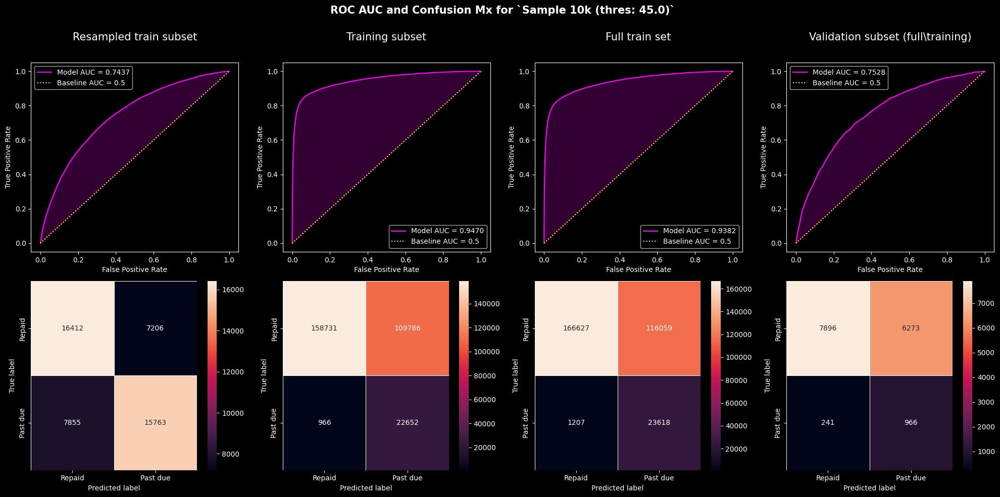


Validation set metrics


[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.2s finished


ROC AUC: 0.7527786982363391
Accuracy: 0.5763527575442248
ARI: 0.020927390980514615
Jaccard Index: 0.4048423937871174
Precision: 0.5763527575442248
Recall: 0.5763527575442248
F1: 0.5763527575442248
F2: 0.5763527575442248
F4: 0.5763527575442248
F8: 0.5763527575442248
F16: 0.5763527575442248

Undersampled validation set metrics
Original dataset shape Counter({0.0: 14169, 1.0: 1207})
Resampled dataset shape Counter({0.0: 1207, 1.0: 1207})
ROC AUC: 0.7579378507999114
Accuracy: 0.6888980944490473
ARI: 0.14239220202651626
Jaccard Index: 0.525434439178515
Precision: 0.6888980944490473
Recall: 0.6888980944490473
F1: 0.6888980944490473
F2: 0.6888980944490473
F4: 0.6888980944490473
F8: 0.6888980944490473
F16: 0.6888980944490473


[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished


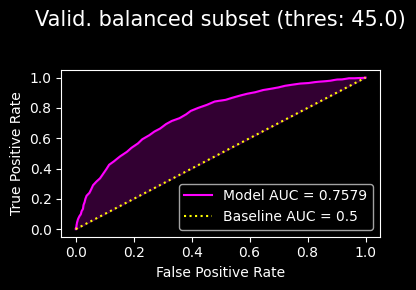

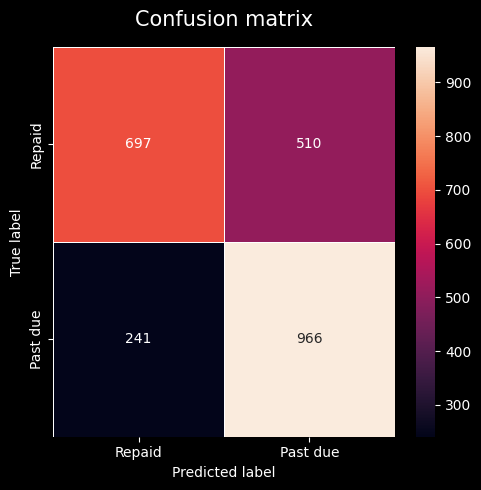

45 % exp res: AUC (0.7579378507999114), FNR (0.34576757532281205), FPR (0.5279503105590062)

Post train eval with threshold of 40.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (292135, 788)	ys class counts : (array([0., 1.]), array([268517,  23618], dtype=int64))
Xrs : shape (47236, 788)	yrs class counts : (array([0., 1.]), array([23618, 23618], dtype=int64))
Xv : shape (15376, 788)	yv class counts : (array([0., 1.]), array([14169,  1207], dtype=int64))


[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    2.8s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    8.2s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    1.9s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    6.7s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.2s finished


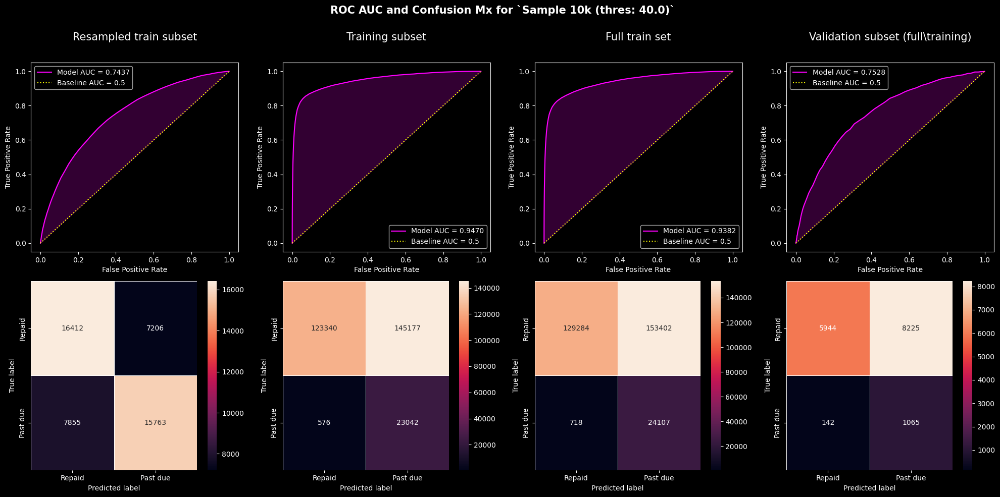


Validation set metrics


[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.2s finished


ROC AUC: 0.7527786982363391
Accuracy: 0.45584027055150883
ARI: -0.02380994325645603
Jaccard Index: 0.29520279661373877
Precision: 0.45584027055150883
Recall: 0.45584027055150883
F1: 0.45584027055150883
F2: 0.45584027055150883
F4: 0.45584027055150883
F8: 0.45584027055150883
F16: 0.4558402705515089

Undersampled validation set metrics
Original dataset shape Counter({0.0: 14169, 1.0: 1207})
Resampled dataset shape Counter({0.0: 1207, 1.0: 1207})
ROC AUC: 0.7579378507999114
Accuracy: 0.6570008285004143
ARI: 0.09829926422581792
Jaccard Index: 0.4892041949413942
Precision: 0.6570008285004143
Recall: 0.6570008285004143
F1: 0.6570008285004143
F2: 0.6570008285004143
F4: 0.6570008285004143
F8: 0.6570008285004143
F16: 0.6570008285004143


[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished


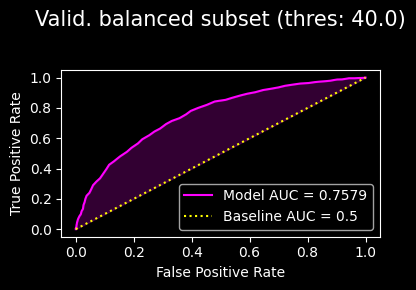

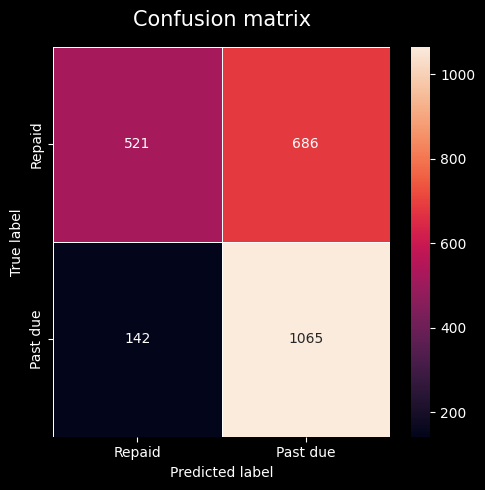

40 % exp res: AUC (0.7579378507999114), FNR (0.272552783109405), FPR (0.644131455399061)

Post train eval with threshold of 35.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (292135, 788)	ys class counts : (array([0., 1.]), array([268517,  23618], dtype=int64))
Xrs : shape (47236, 788)	yrs class counts : (array([0., 1.]), array([23618, 23618], dtype=int64))
Xv : shape (15376, 788)	yv class counts : (array([0., 1.]), array([14169,  1207], dtype=int64))


[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    1.7s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    3.9s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.9s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    3.1s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.1s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.2s finished


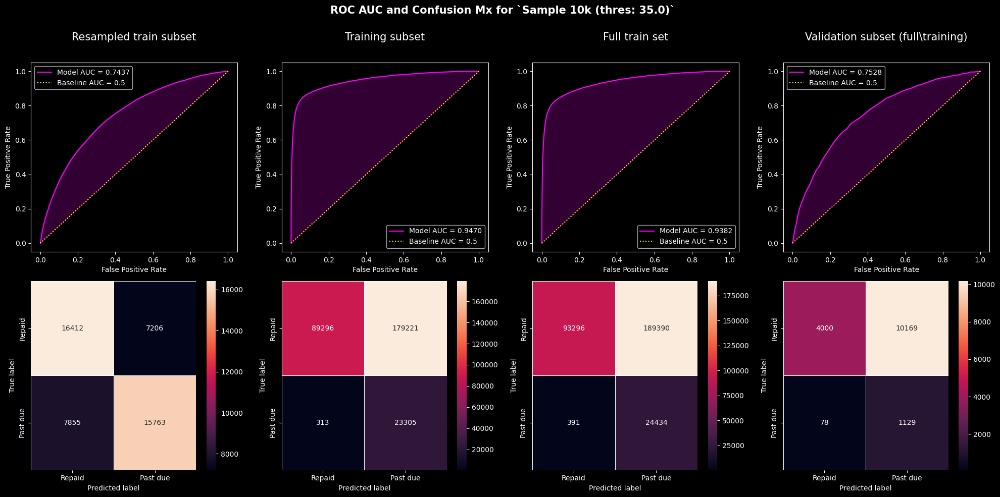


Validation set metrics


[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.1s finished


ROC AUC: 0.7527786982363391
Accuracy: 0.33357180020811655
ARI: -0.05444436931889648
Jaccard Index: 0.20017172071966594
Precision: 0.33357180020811655
Recall: 0.33357180020811655
F1: 0.33357180020811655
F2: 0.33357180020811655
F4: 0.33357180020811655
F8: 0.33357180020811655
F16: 0.33357180020811655

Undersampled validation set metrics
Original dataset shape Counter({0.0: 14169, 1.0: 1207})
Resampled dataset shape Counter({0.0: 1207, 1.0: 1207})
ROC AUC: 0.7579378507999114
Accuracy: 0.6180613090306545
ARI: 0.055520121973629766
Jaccard Index: 0.447242206235012
Precision: 0.6180613090306545
Recall: 0.6180613090306545
F1: 0.6180613090306545
F2: 0.6180613090306545
F4: 0.6180613090306545
F8: 0.6180613090306545
F16: 0.6180613090306545


[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished


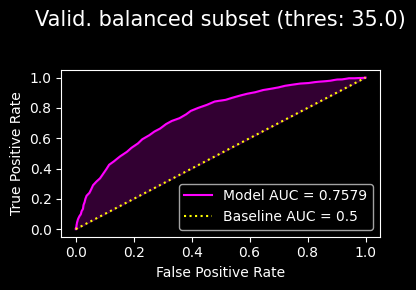

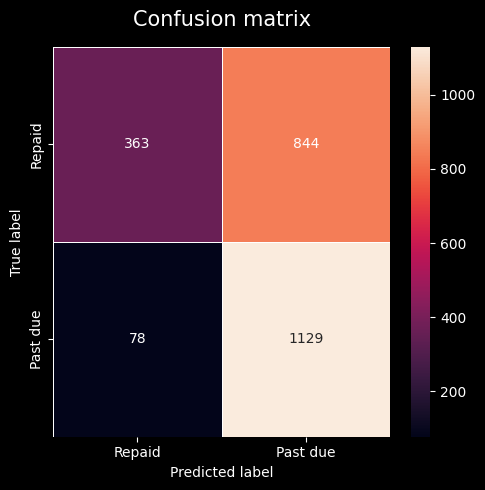

35 % exp res: AUC (0.7579378507999114), FNR (0.21487603305785125), FPR (0.7475642161204605)
Mlflow run (640e9e1272094f4c95a99155812dc593) completed


In [9]:
from sklearn import ensemble
from home_credit.mlflow_tracking import do_first_experiment

run_id = do_first_experiment(
    trainset_name="train_baseline_95pcts",
    clf=ensemble.RandomForestClassifier(
        n_estimators=100, random_state=42,
        verbose=1, n_jobs=-1
    )
)
print(f"Mlflow run ({run_id}) completed")

## Light GBM

### `10k`

default `mlruns/`: file://C:\Users\franc\Projects\pepper_credit_scoring_tool\tmp\mlruns
this project `mlruns/`: file://C:\Users\franc\Projects\pepper_credit_scoring_tool\tmp\mlruns

Starting train and eval of:
Labeled dataset of shape: (10000, 790)
Features set of shape: (10000, 788)

With:
Classifier: 


LGBMClassifier(callbacks=None, colsample_bytree=0.9497036, learning_rate=0.02,
               max_depth=8, min_child_weight=39.3259775,
               min_split_gain=0.0222415, n_estimators=10000, n_jobs=4,
               num_leaves=34, reg_alpha=0.041545473, reg_lambda=0.0735294,
               subsample=0.8715623)

Loss function: 


{'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

Eval metrics: 


{'F2': <function home_credit.best_model_search.<lambda>(y, y_pred)>,
 'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

On 5 KFolds: 

Resampling
Sampler: 


RandomUnderSampler(random_state=42)

Original dataset shape: Counter({0.0: 9177, 1.0: 823})
Resampled dataset shape: Counter({0.0: 823, 1.0: 823})
Data shape: (1646, 788)

Evaluate the 1-th fold (on 5)
[200]	training's binary_logloss: 0.516255	valid_1's binary_logloss: 0.607693
[400]	training's binary_logloss: 0.449198	valid_1's binary_logloss: 0.604725
Fold  0 F2: 0.670498
Fold  0 AUC: 0.736055

Evaluate the 2-th fold (on 5)
[200]	training's binary_logloss: 0.512073	valid_1's binary_logloss: 0.627128
[400]	training's binary_logloss: 0.446837	valid_1's binary_logloss: 0.621482
[600]	training's binary_logloss: 0.404953	valid_1's binary_logloss: 0.623076
Fold  1 F2: 0.624235
Fold  1 AUC: 0.710326

Evaluate the 3-th fold (on 5)
[200]	training's binary_logloss: 0.510743	valid_1's binary_logloss: 0.610891
[400]	training's binary_logloss: 0.444432	valid_1's binary_logloss: 0.607295
Fold  2 F2: 0.645995
Fold  2 AUC: 0.736173

Evaluate the 4-th fold (on 5)
[200]	training's binary_logloss: 0.522062	valid_1's binary_logloss: 0.6040

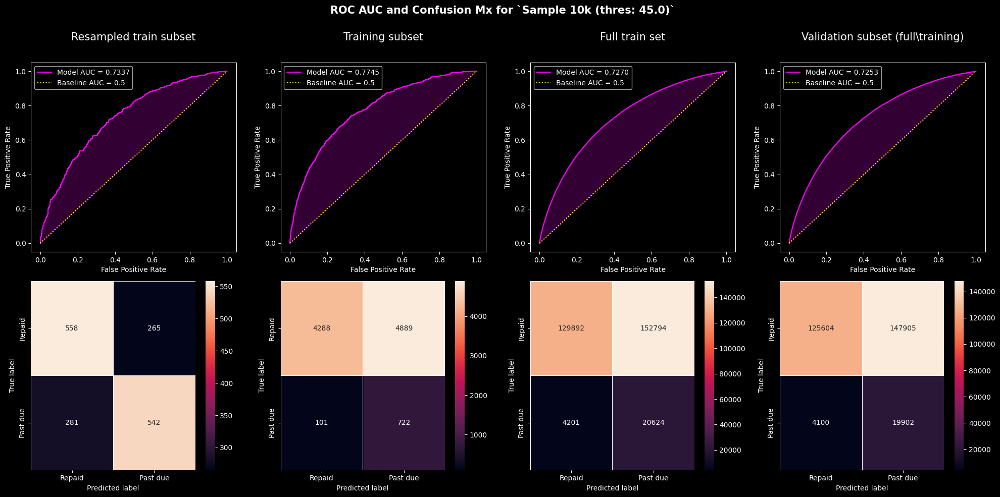


Validation set metrics
ROC AUC: 0.7253127805138387
Accuracy: 0.48907771477357137
ARI: -0.011189328537394775
Jaccard Index: 0.3236948184269303
Precision: 0.48907771477357137
Recall: 0.48907771477357137
F1: 0.48907771477357137
F2: 0.48907771477357137
F4: 0.48907771477357137
F8: 0.48907771477357137
F16: 0.48907771477357137

Undersampled validation set metrics
Original dataset shape Counter({0.0: 273509, 1.0: 24002})
Resampled dataset shape Counter({0.0: 24002, 1.0: 24002})
ROC AUC: 0.7257024690280615
Accuracy: 0.6468419298391801
ARI: 0.08623370537306514
Jaccard Index: 0.47802392351863543
Precision: 0.6468419298391801
Recall: 0.6468419298391801
F1: 0.6468419298391801
F2: 0.6468419298391801
F4: 0.6468419298391801
F8: 0.6468419298391801
F16: 0.6468419298391801


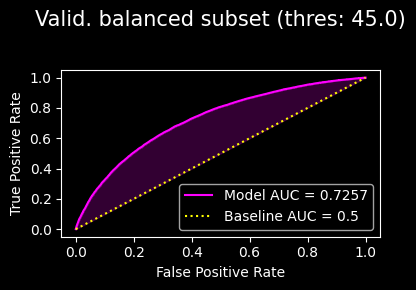

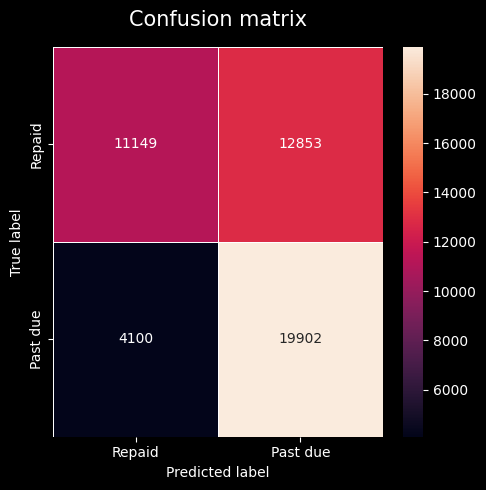

45 % exp res: AUC (0.7257024690280615), FNR (0.36774598618710197), FPR (0.645814491005929)

Post train eval with threshold of 40.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (10000, 788)	ys class counts : (array([0., 1.]), array([9177,  823], dtype=int64))
Xrs : shape (1646, 788)	yrs class counts : (array([0., 1.]), array([823, 823], dtype=int64))
Xv : shape (297511, 788)	yv class counts : (array([0., 1.]), array([273509,  24002], dtype=int64))


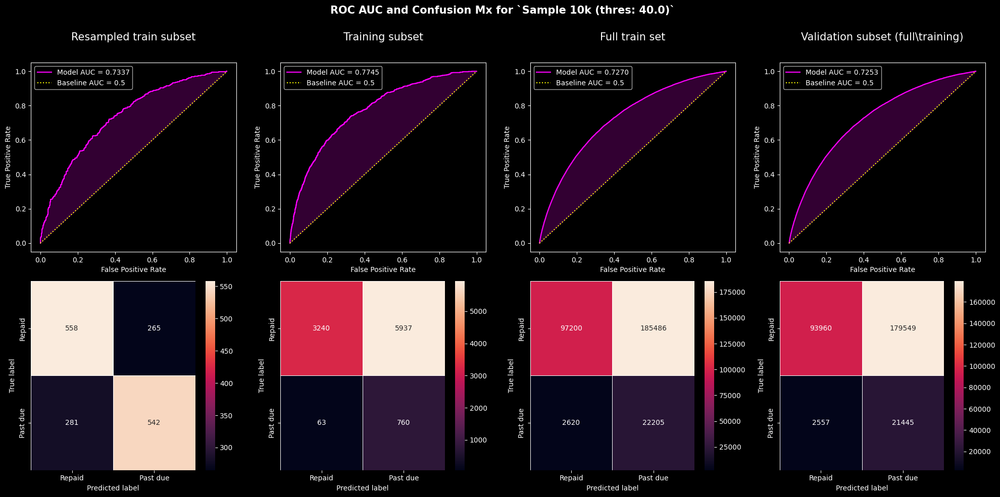


Validation set metrics
ROC AUC: 0.7253127805138387
Accuracy: 0.38790162380550636
ARI: -0.03993561625196241
Jaccard Index: 0.2406190773054333
Precision: 0.38790162380550636
Recall: 0.38790162380550636
F1: 0.38790162380550636
F2: 0.38790162380550636
F4: 0.38790162380550636
F8: 0.38790162380550636
F16: 0.38790162380550636

Undersampled validation set metrics
Original dataset shape Counter({0.0: 273509, 1.0: 24002})
Resampled dataset shape Counter({0.0: 24002, 1.0: 24002})
ROC AUC: 0.7257024690280615
Accuracy: 0.6174485459545038
ARI: 0.05516295917437493
Jaccard Index: 0.4466007714561234
Precision: 0.6174485459545038
Recall: 0.6174485459545038
F1: 0.6174485459545038
F2: 0.6174485459545038
F4: 0.6174485459545038
F8: 0.6174485459545038
F16: 0.6174485459545038


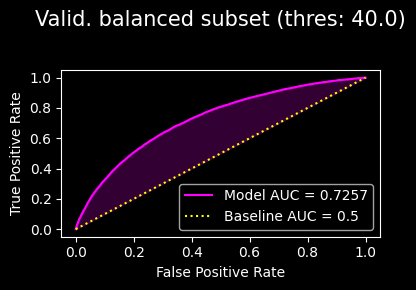

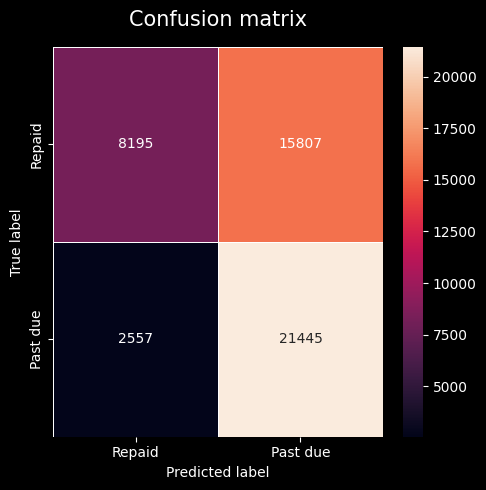

40 % exp res: AUC (0.7257024690280615), FNR (0.312019524100061), FPR (0.7370948939146654)

Post train eval with threshold of 35.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (10000, 788)	ys class counts : (array([0., 1.]), array([9177,  823], dtype=int64))
Xrs : shape (1646, 788)	yrs class counts : (array([0., 1.]), array([823, 823], dtype=int64))
Xv : shape (297511, 788)	yv class counts : (array([0., 1.]), array([273509,  24002], dtype=int64))


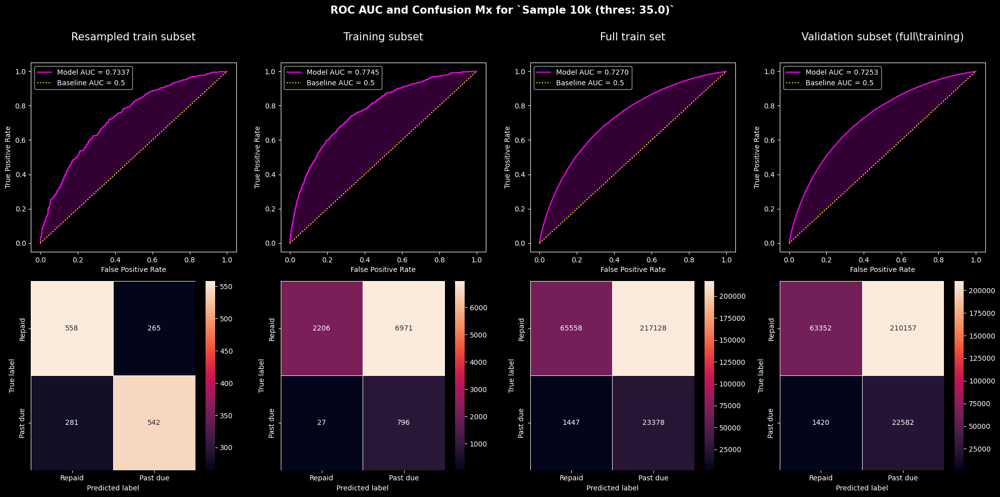


Validation set metrics
ROC AUC: 0.7253127805138387
Accuracy: 0.28884310159960475
ARI: -0.05907838819537573
Jaccard Index: 0.16879989314224653
Precision: 0.28884310159960475
Recall: 0.28884310159960475
F1: 0.28884310159960475
F2: 0.28884310159960475
F4: 0.28884310159960475
F8: 0.28884310159960475
F16: 0.28884310159960475

Undersampled validation set metrics
Original dataset shape Counter({0.0: 273509, 1.0: 24002})
Resampled dataset shape Counter({0.0: 24002, 1.0: 24002})
ROC AUC: 0.7257024690280615
Accuracy: 0.587596866927756
ARI: 0.030682730147003255
Jaccard Index: 0.4160263122962788
Precision: 0.587596866927756
Recall: 0.587596866927756
F1: 0.587596866927756
F2: 0.587596866927756
F4: 0.587596866927756
F8: 0.587596866927756
F16: 0.587596866927756


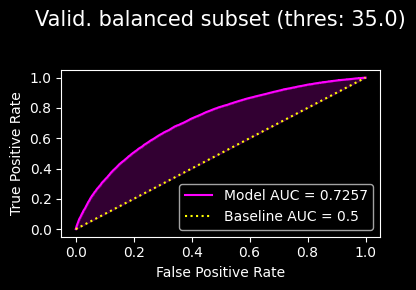

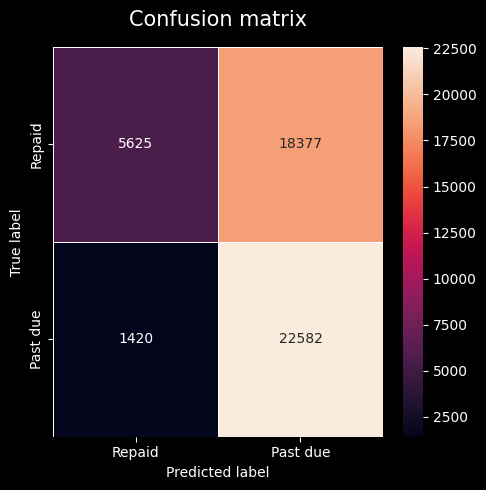

35 % exp res: AUC (0.7257024690280615), FNR (0.25244444444444447), FPR (0.8137897440439288)
Mlflow run (2d84540ae6eb4174bbc8b7e0bd49a7a7) completed


In [5]:
from home_credit.mlflow_tracking import do_first_experiment
from home_credit.lightgbm_kernel_v2 import get_opt_lgbm_classifier

run_id = do_first_experiment(
    trainset_name="train_baseline_10k",
    clf=get_opt_lgbm_classifier()
)
print(f"Mlflow run ({run_id}) completed")

### `100k`

default `mlruns/`: file:///c:/Users/franc/Projects/pepper_credit_scoring_tool/notebooks/experiments/mlruns
this project `mlruns/`: file://C:\Users\franc\Projects\pepper_credit_scoring_tool\tmp\mlruns


2023/05/06 10:53:21 INFO mlflow.tracking.fluent: Experiment with name 'LGBMClassifier_train_baseline_100k' does not exist. Creating a new experiment.



Starting train and eval of:
Labeled dataset of shape: (100000, 790)
Features set of shape: (100000, 788)

With:
Classifier: 


LGBMClassifier(callbacks=None, colsample_bytree=0.9497036, learning_rate=0.02,
               max_depth=8, min_child_weight=39.3259775,
               min_split_gain=0.0222415, n_estimators=10000, n_jobs=4,
               num_leaves=34, reg_alpha=0.041545473, reg_lambda=0.0735294,
               subsample=0.8715623)

Loss function: 


{'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

Eval metrics: 


{'F2': <function home_credit.best_model_search.<lambda>(y, y_pred)>,
 'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

On 5 KFolds: 

Resampling
Sampler: 


RandomUnderSampler(random_state=42)

Original dataset shape: Counter({0.0: 91990, 1.0: 8010})
Resampled dataset shape: Counter({0.0: 8010, 1.0: 8010})
Data shape: (16020, 788)

Evaluate the 1-th fold (on 5)
[200]	training's binary_logloss: 0.50486	valid_1's binary_logloss: 0.568342
[400]	training's binary_logloss: 0.450624	valid_1's binary_logloss: 0.558426
[600]	training's binary_logloss: 0.415462	valid_1's binary_logloss: 0.556715
[800]	training's binary_logloss: 0.385416	valid_1's binary_logloss: 0.556749
Fold  0 F2: 0.703282
Fold  0 AUC: 0.788646

Evaluate the 2-th fold (on 5)
[200]	training's binary_logloss: 0.501554	valid_1's binary_logloss: 0.591805
[400]	training's binary_logloss: 0.447903	valid_1's binary_logloss: 0.586962
[600]	training's binary_logloss: 0.413936	valid_1's binary_logloss: 0.586515
Fold  1 F2: 0.694792
Fold  1 AUC: 0.757821

Evaluate the 3-th fold (on 5)
[200]	training's binary_logloss: 0.501477	valid_1's binary_logloss: 0.578556
[400]	training's binary_logloss: 0.447462	valid_1's binary_logloss:

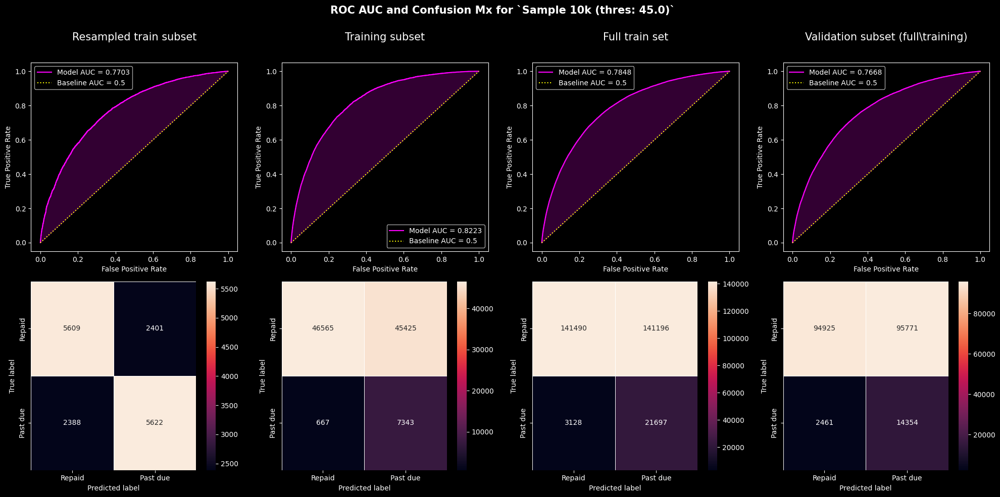


Validation set metrics
ROC AUC: 0.7668309455544857
Accuracy: 0.5266178660408364
ARI: 0.00018698269783057938
Jaccard Index: 0.3574211020366779
Precision: 0.5266178660408364
Recall: 0.5266178660408364
F1: 0.5266178660408364
F2: 0.5266178660408364
F4: 0.5266178660408364
F8: 0.5266178660408364
F16: 0.5266178660408364

Undersampled validation set metrics
Original dataset shape Counter({0.0: 190696, 1.0: 16815})
Resampled dataset shape Counter({0.0: 16815, 1.0: 16815})
ROC AUC: 0.7643097325860502
Accuracy: 0.6762414510853405
ARI: 0.12422143229474888
Jaccard Index: 0.5108495440046723
Precision: 0.6762414510853405
Recall: 0.6762414510853405
F1: 0.6762414510853405
F2: 0.6762414510853405
F4: 0.6762414510853405
F8: 0.6762414510853405
F16: 0.6762414510853405


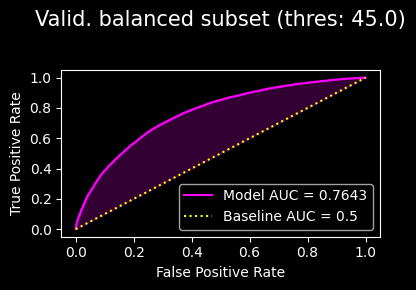

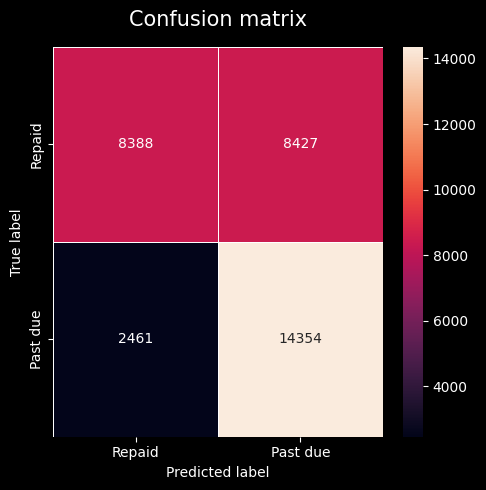

45 % exp res: AUC (0.7643097325860502), FNR (0.29339532665712925), FPR (0.5870837397241188)

Post train eval with threshold of 40.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (100000, 788)	ys class counts : (array([0., 1.]), array([91990,  8010], dtype=int64))
Xrs : shape (16020, 788)	yrs class counts : (array([0., 1.]), array([8010, 8010], dtype=int64))
Xv : shape (207511, 788)	yv class counts : (array([0., 1.]), array([190696,  16815], dtype=int64))


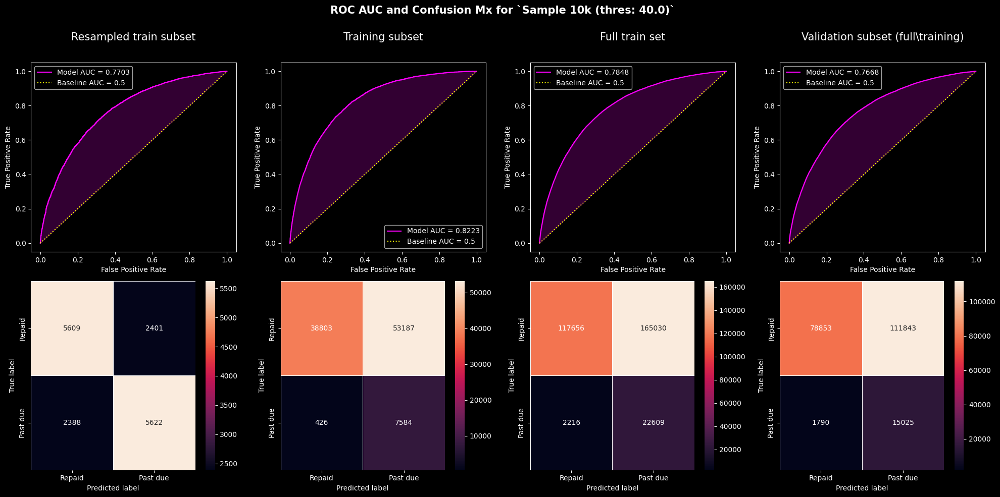


Validation set metrics
ROC AUC: 0.7668309455544857
Accuracy: 0.45240011372891076
ARI: -0.02671026275154391
Jaccard Index: 0.29232369279824627
Precision: 0.45240011372891076
Recall: 0.45240011372891076
F1: 0.45240011372891076
F2: 0.45240011372891076
F4: 0.45240011372891076
F8: 0.45240011372891076
F16: 0.45240011372891076

Undersampled validation set metrics
Original dataset shape Counter({0.0: 190696, 1.0: 16815})
Resampled dataset shape Counter({0.0: 16815, 1.0: 16815})
ROC AUC: 0.7643097325860502
Accuracy: 0.6545941123996432
ARI: 0.09557660668661741
Jaccard Index: 0.4865402466516377
Precision: 0.6545941123996432
Recall: 0.6545941123996432
F1: 0.6545941123996432
F2: 0.6545941123996432
F4: 0.6545941123996432
F8: 0.6545941123996432
F16: 0.6545941123996432


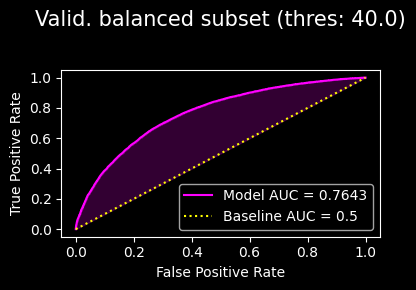

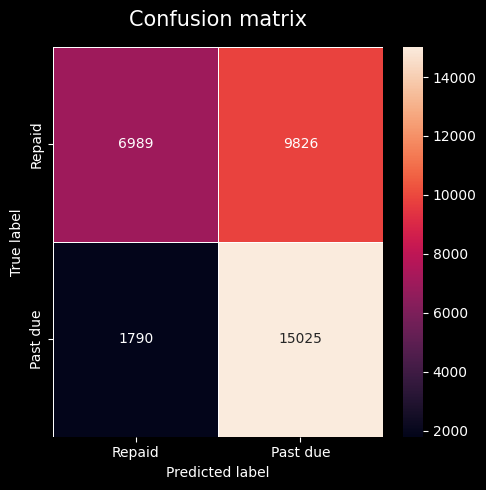

40 % exp res: AUC (0.7643097325860502), FNR (0.256116754900558), FPR (0.6539767054908486)

Post train eval with threshold of 35.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (100000, 788)	ys class counts : (array([0., 1.]), array([91990,  8010], dtype=int64))
Xrs : shape (16020, 788)	yrs class counts : (array([0., 1.]), array([8010, 8010], dtype=int64))
Xv : shape (207511, 788)	yv class counts : (array([0., 1.]), array([190696,  16815], dtype=int64))


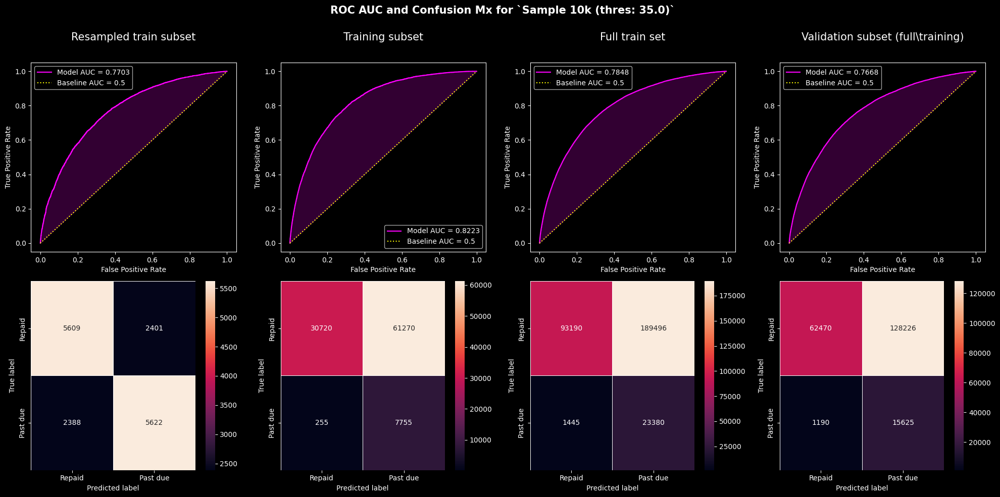


Validation set metrics
ROC AUC: 0.7668309455544857
Accuracy: 0.3763414951496547
ARI: -0.048808911646378315
Jaccard Index: 0.23178611390597964
Precision: 0.3763414951496547
Recall: 0.3763414951496547
F1: 0.37634149514965476
F2: 0.3763414951496547
F4: 0.3763414951496547
F8: 0.37634149514965476
F16: 0.3763414951496547

Undersampled validation set metrics
Original dataset shape Counter({0.0: 190696, 1.0: 16815})
Resampled dataset shape Counter({0.0: 16815, 1.0: 16815})
ROC AUC: 0.7643097325860502
Accuracy: 0.6297353553374962
ARI: 0.06730726582290843
Jaccard Index: 0.459572067184584
Precision: 0.6297353553374962
Recall: 0.6297353553374962
F1: 0.6297353553374962
F2: 0.6297353553374962
F4: 0.6297353553374962
F8: 0.6297353553374962
F16: 0.6297353553374962


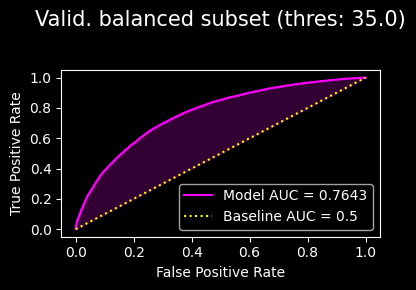

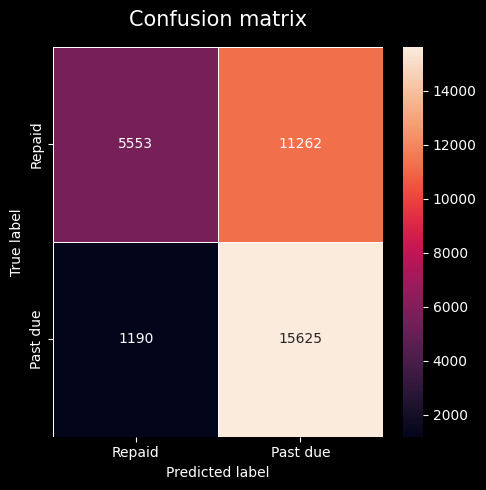

35 % exp res: AUC (0.7643097325860502), FNR (0.21429857734557897), FPR (0.720768)
Mlflow run (546f69d710d54b48b6f2b107bebca3f7) completed


In [1]:
from home_credit.mlflow_tracking import do_first_experiment
from home_credit.lightgbm_kernel_v2 import get_opt_lgbm_classifier

run_id = do_first_experiment(
    trainset_name="train_baseline_100k",
    clf=get_opt_lgbm_classifier()
)
print(f"Mlflow run ({run_id}) completed")

### `50pcts`

default `mlruns/`: file://C:\Users\franc\Projects\pepper_credit_scoring_tool\tmp\mlruns
this project `mlruns/`: file://C:\Users\franc\Projects\pepper_credit_scoring_tool\tmp\mlruns


2023/05/06 11:18:32 INFO mlflow.tracking.fluent: Experiment with name 'LGBMClassifier_train_baseline_50pcts' does not exist. Creating a new experiment.



Starting train and eval of:
Labeled dataset of shape: (153756, 790)
Features set of shape: (153756, 788)

With:
Classifier: 


LGBMClassifier(callbacks=None, colsample_bytree=0.9497036, learning_rate=0.02,
               max_depth=8, min_child_weight=39.3259775,
               min_split_gain=0.0222415, n_estimators=10000, n_jobs=4,
               num_leaves=34, reg_alpha=0.041545473, reg_lambda=0.0735294,
               subsample=0.8715623)

Loss function: 


{'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

Eval metrics: 


{'F2': <function home_credit.best_model_search.<lambda>(y, y_pred)>,
 'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

On 5 KFolds: 

Resampling
Sampler: 


RandomUnderSampler(random_state=42)

Original dataset shape: Counter({0.0: 141324, 1.0: 12432})
Resampled dataset shape: Counter({0.0: 12432, 1.0: 12432})
Data shape: (24864, 788)

Evaluate the 1-th fold (on 5)
[200]	training's binary_logloss: 0.515674	valid_1's binary_logloss: 0.57608
[400]	training's binary_logloss: 0.469739	valid_1's binary_logloss: 0.568515
[600]	training's binary_logloss: 0.438244	valid_1's binary_logloss: 0.567055
[800]	training's binary_logloss: 0.413912	valid_1's binary_logloss: 0.567018
Fold  0 F2: 0.702853
Fold  0 AUC: 0.777001

Evaluate the 2-th fold (on 5)
[200]	training's binary_logloss: 0.514712	valid_1's binary_logloss: 0.57867
[400]	training's binary_logloss: 0.467271	valid_1's binary_logloss: 0.572233
[600]	training's binary_logloss: 0.43651	valid_1's binary_logloss: 0.571228
[800]	training's binary_logloss: 0.410872	valid_1's binary_logloss: 0.57156
Fold  1 F2: 0.708709
Fold  1 AUC: 0.773291

Evaluate the 3-th fold (on 5)
[200]	training's binary_logloss: 0.517882	valid_1's binary_logloss

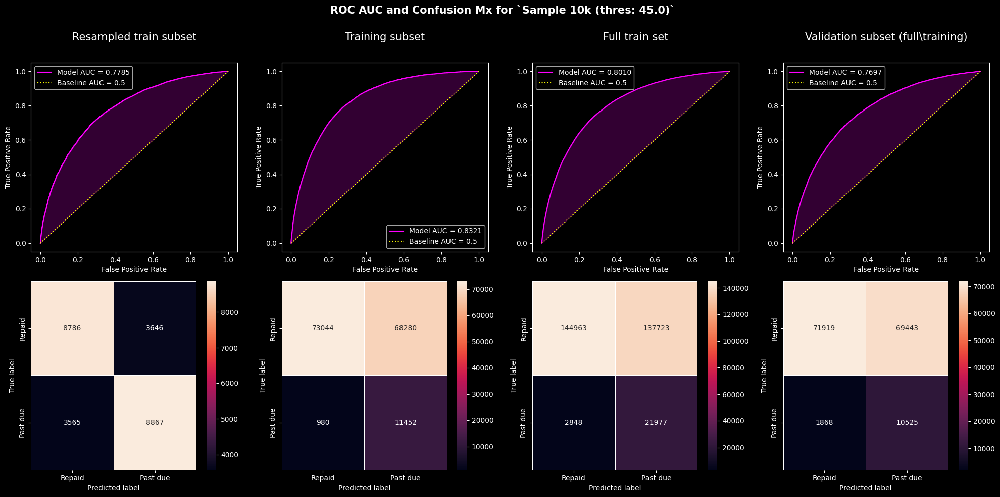


Validation set metrics
ROC AUC: 0.7697064706687307
Accuracy: 0.5362037006926604
ARI: 0.004108558441245985
Jaccard Index: 0.3663103267485982
Precision: 0.5362037006926604
Recall: 0.5362037006926604
F1: 0.5362037006926604
F2: 0.5362037006926604
F4: 0.5362037006926604
F8: 0.5362037006926604
F16: 0.5362037006926604

Undersampled validation set metrics
Original dataset shape Counter({0.0: 141362, 1.0: 12393})
Resampled dataset shape Counter({0.0: 12393, 1.0: 12393})
ROC AUC: 0.7707276701214701
Accuracy: 0.6797385620915033
ARI: 0.12919270753478226
Jaccard Index: 0.5148514851485149
Precision: 0.6797385620915033
Recall: 0.6797385620915033
F1: 0.6797385620915033
F2: 0.6797385620915033
F4: 0.6797385620915033
F8: 0.6797385620915033
F16: 0.6797385620915033


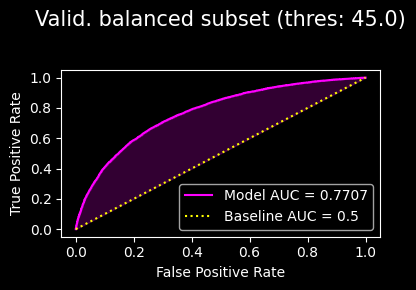

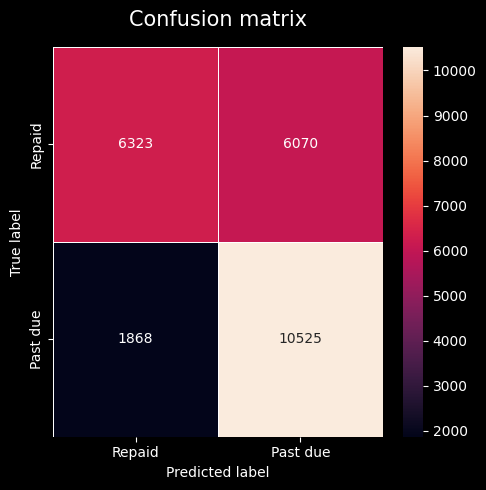

45 % exp res: AUC (0.7707276701214701), FNR (0.29542938478570296), FPR (0.5767220902612826)

Post train eval with threshold of 40.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (153756, 788)	ys class counts : (array([0., 1.]), array([141324,  12432], dtype=int64))
Xrs : shape (24864, 788)	yrs class counts : (array([0., 1.]), array([12432, 12432], dtype=int64))
Xv : shape (153755, 788)	yv class counts : (array([0., 1.]), array([141362,  12393], dtype=int64))


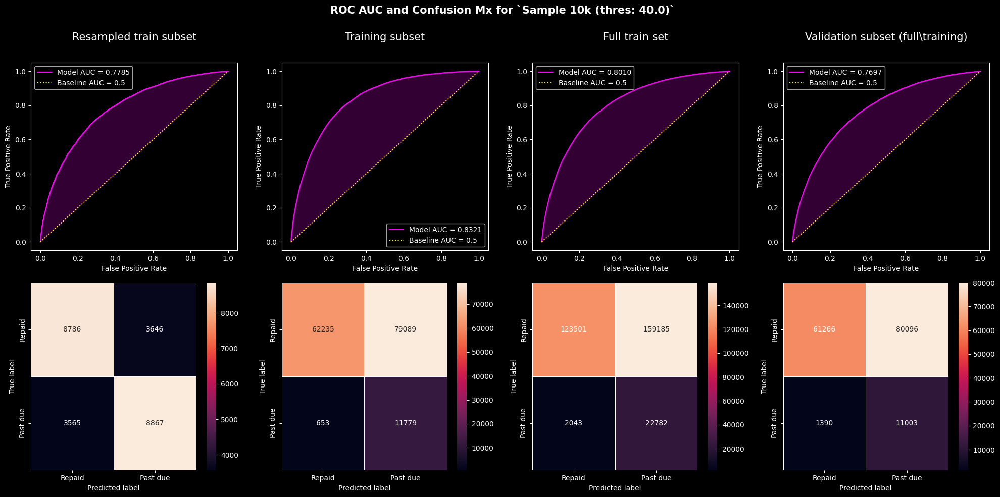


Validation set metrics
ROC AUC: 0.7697064706687307
Accuracy: 0.47002699099216283
ARI: -0.020990892761251406
Jaccard Index: 0.3072126032451826
Precision: 0.47002699099216283
Recall: 0.47002699099216283
F1: 0.47002699099216283
F2: 0.4700269909921628
F4: 0.47002699099216283
F8: 0.47002699099216283
F16: 0.47002699099216283

Undersampled validation set metrics
Original dataset shape Counter({0.0: 141362, 1.0: 12393})
Resampled dataset shape Counter({0.0: 12393, 1.0: 12393})
ROC AUC: 0.7707276701214701
Accuracy: 0.6620672960542242
ARI: 0.10503448705016469
Jaccard Index: 0.49484349556721546
Precision: 0.6620672960542242
Recall: 0.6620672960542242
F1: 0.6620672960542242
F2: 0.6620672960542242
F4: 0.6620672960542242
F8: 0.6620672960542242
F16: 0.6620672960542242


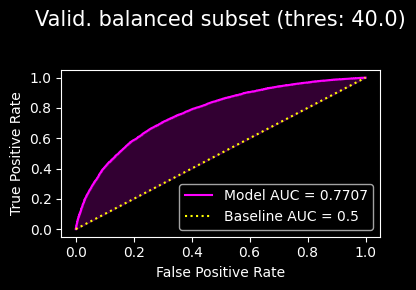

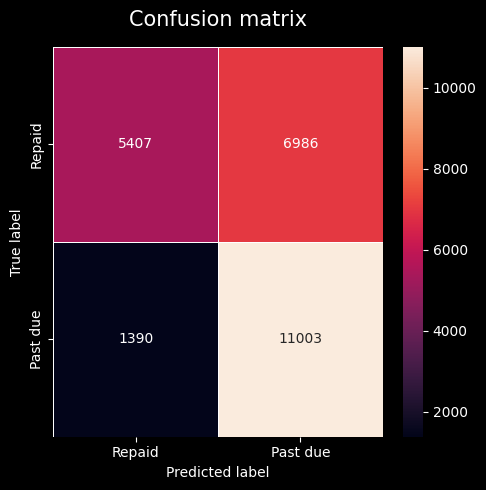

40 % exp res: AUC (0.7707276701214701), FNR (0.25707416312187903), FPR (0.634917749704626)

Post train eval with threshold of 35.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (153756, 788)	ys class counts : (array([0., 1.]), array([141324,  12432], dtype=int64))
Xrs : shape (24864, 788)	yrs class counts : (array([0., 1.]), array([12432, 12432], dtype=int64))
Xv : shape (153755, 788)	yv class counts : (array([0., 1.]), array([141362,  12393], dtype=int64))


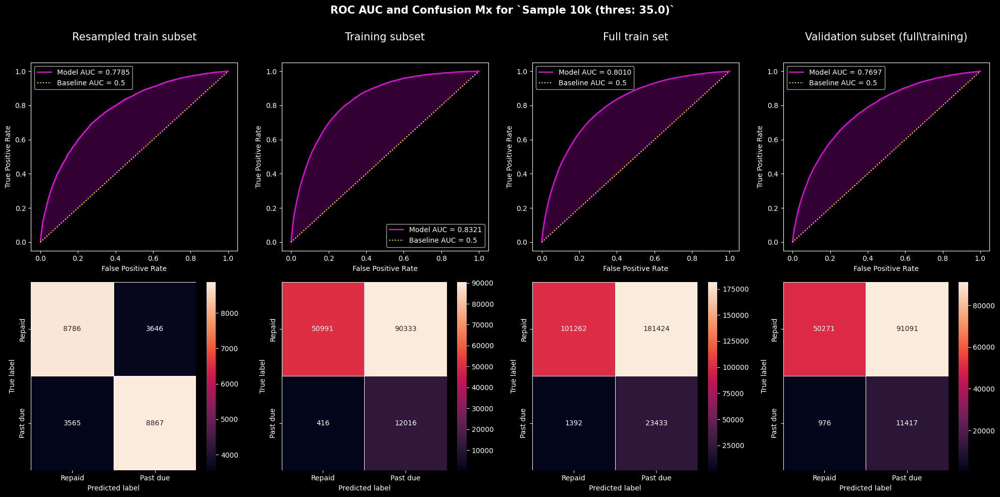


Validation set metrics
ROC AUC: 0.7697064706687307
Accuracy: 0.40120971675717865
ARI: -0.04249041148467725
Jaccard Index: 0.2509458063151386
Precision: 0.40120971675717865
Recall: 0.40120971675717865
F1: 0.4012097167571786
F2: 0.40120971675717865
F4: 0.4012097167571787
F8: 0.40120971675717865
F16: 0.40120971675717865

Undersampled validation set metrics
Original dataset shape Counter({0.0: 141362, 1.0: 12393})
Resampled dataset shape Counter({0.0: 12393, 1.0: 12393})
ROC AUC: 0.7707276701214701
Accuracy: 0.6381828451545227
ARI: 0.07635267222331028
Jaccard Index: 0.4686259406292588
Precision: 0.6381828451545227
Recall: 0.6381828451545227
F1: 0.6381828451545227
F2: 0.6381828451545228
F4: 0.6381828451545227
F8: 0.6381828451545227
F16: 0.6381828451545227


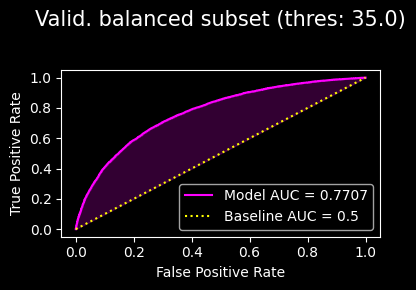

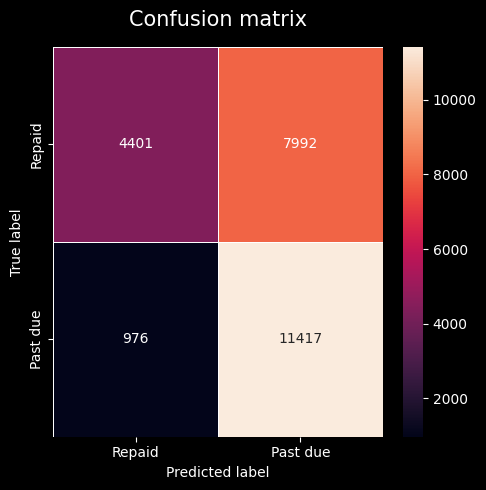

35 % exp res: AUC (0.7707276701214701), FNR (0.22176778004998865), FPR (0.7000087588683542)
Mlflow run (3a37b04d885446a7a74fa7d2622ac0eb) completed


In [2]:
from home_credit.mlflow_tracking import do_first_experiment
from home_credit.lightgbm_kernel_v2 import get_opt_lgbm_classifier

run_id = do_first_experiment(
    trainset_name="train_baseline_50pcts",
    clf=get_opt_lgbm_classifier()
)
print(f"Mlflow run ({run_id}) completed")

### `75pcts`

default `mlruns/`: file://C:\Users\franc\Projects\pepper_credit_scoring_tool\tmp\mlruns
this project `mlruns/`: file://C:\Users\franc\Projects\pepper_credit_scoring_tool\tmp\mlruns


2023/05/06 13:07:29 INFO mlflow.tracking.fluent: Experiment with name 'LGBMClassifier_train_baseline_75pcts' does not exist. Creating a new experiment.



Starting train and eval of:
Labeled dataset of shape: (230633, 790)
Features set of shape: (230633, 788)

With:
Classifier: 


LGBMClassifier(callbacks=None, colsample_bytree=0.9497036, learning_rate=0.02,
               max_depth=8, min_child_weight=39.3259775,
               min_split_gain=0.0222415, n_estimators=10000, n_jobs=4,
               num_leaves=34, reg_alpha=0.041545473, reg_lambda=0.0735294,
               subsample=0.8715623)

Loss function: 


{'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

Eval metrics: 


{'F2': <function home_credit.best_model_search.<lambda>(y, y_pred)>,
 'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

On 5 KFolds: 

Resampling
Sampler: 


RandomUnderSampler(random_state=42)

Original dataset shape: Counter({0.0: 211973, 1.0: 18660})
Resampled dataset shape: Counter({0.0: 18660, 1.0: 18660})
Data shape: (37320, 788)

Evaluate the 1-th fold (on 5)
[200]	training's binary_logloss: 0.536036	valid_1's binary_logloss: 0.572579
[400]	training's binary_logloss: 0.492077	valid_1's binary_logloss: 0.561934
[600]	training's binary_logloss: 0.463373	valid_1's binary_logloss: 0.559585
[800]	training's binary_logloss: 0.439779	valid_1's binary_logloss: 0.558761
Fold  0 F2: 0.710359
Fold  0 AUC: 0.785286

Evaluate the 2-th fold (on 5)
[200]	training's binary_logloss: 0.533139	valid_1's binary_logloss: 0.583325
[400]	training's binary_logloss: 0.488903	valid_1's binary_logloss: 0.574121
[600]	training's binary_logloss: 0.460094	valid_1's binary_logloss: 0.572223
[800]	training's binary_logloss: 0.437054	valid_1's binary_logloss: 0.571952
[1000]	training's binary_logloss: 0.417021	valid_1's binary_logloss: 0.571982
Fold  1 F2: 0.707747
Fold  1 AUC: 0.772531

Evaluate the 3

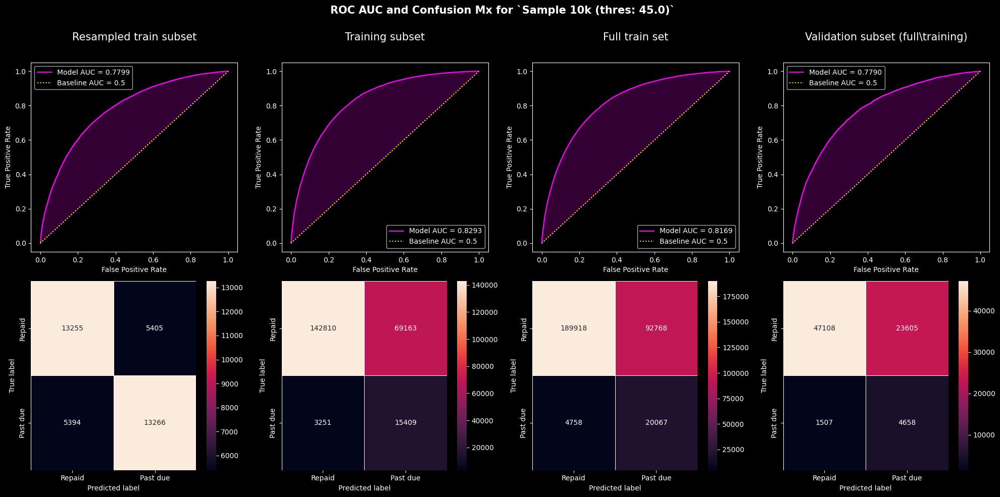


Validation set metrics
ROC AUC: 0.7790386299191038
Accuracy: 0.6733525846145841
ARI: 0.07447557836266937
Jaccard Index: 0.5075595646632023
Precision: 0.6733525846145841
Recall: 0.6733525846145841
F1: 0.6733525846145841
F2: 0.6733525846145841
F4: 0.6733525846145841
F8: 0.6733525846145841
F16: 0.6733525846145841

Undersampled validation set metrics
Original dataset shape Counter({0.0: 70713, 1.0: 6165})
Resampled dataset shape Counter({0.0: 6165, 1.0: 6165})
ROC AUC: 0.7867001076768957
Accuracy: 0.716220600162206
ARI: 0.18693985291455045
Jaccard Index: 0.5579000568576663
Precision: 0.716220600162206
Recall: 0.716220600162206
F1: 0.716220600162206
F2: 0.716220600162206
F4: 0.716220600162206
F8: 0.716220600162206
F16: 0.716220600162206


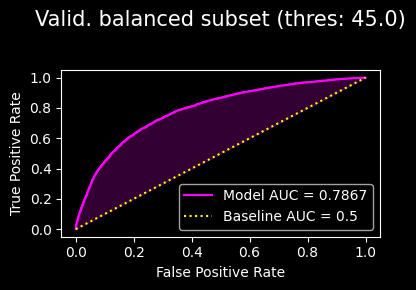

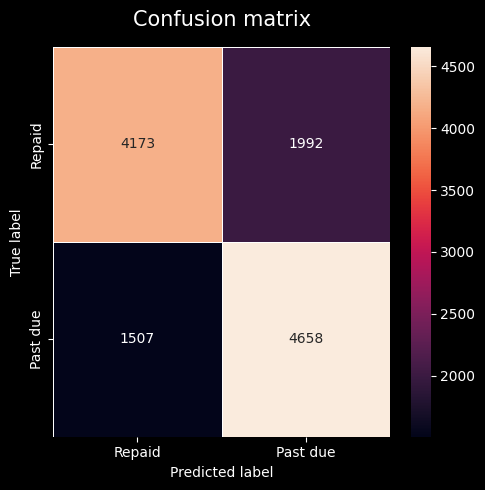

45 % exp res: AUC (0.7867001076768957), FNR (0.361131080757249), FPR (0.42765135251180764)

Post train eval with threshold of 40.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (230633, 788)	ys class counts : (array([0., 1.]), array([211973,  18660], dtype=int64))
Xrs : shape (37320, 788)	yrs class counts : (array([0., 1.]), array([18660, 18660], dtype=int64))
Xv : shape (76878, 788)	yv class counts : (array([0., 1.]), array([70713,  6165], dtype=int64))


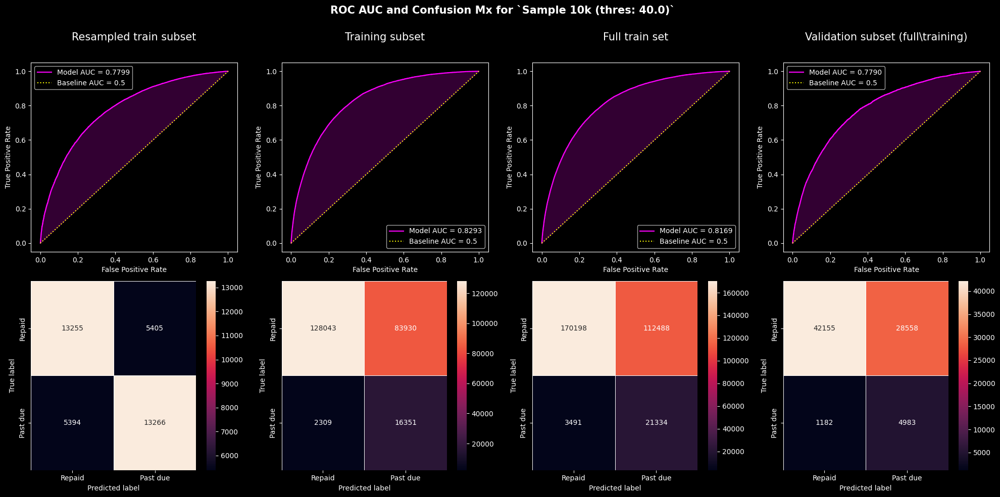


Validation set metrics
ROC AUC: 0.7790386299191038
Accuracy: 0.6131533078383933
ARI: 0.04022545367920087
Jaccard Index: 0.4421204674632801
Precision: 0.6131533078383933
Recall: 0.6131533078383933
F1: 0.6131533078383933
F2: 0.6131533078383933
F4: 0.6131533078383933
F8: 0.6131533078383933
F16: 0.6131533078383933

Undersampled validation set metrics
Original dataset shape Counter({0.0: 70713, 1.0: 6165})
Resampled dataset shape Counter({0.0: 6165, 1.0: 6165})
ROC AUC: 0.7867001076768957
Accuracy: 0.7066504460665045
ARI: 0.1707531459567103
Jaccard Index: 0.5463723584373237
Precision: 0.7066504460665045
Recall: 0.7066504460665045
F1: 0.7066504460665045
F2: 0.7066504460665045
F4: 0.7066504460665045
F8: 0.7066504460665045
F16: 0.7066504460665045


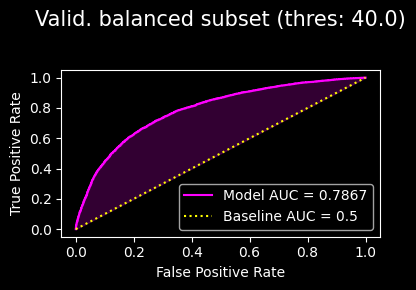

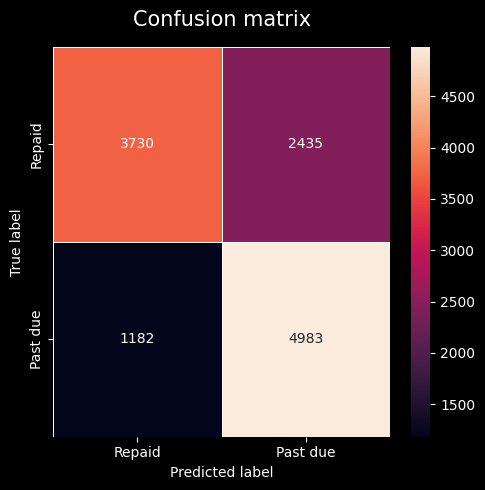

40 % exp res: AUC (0.7867001076768957), FNR (0.31689008042895445), FPR (0.4886614489263496)

Post train eval with threshold of 35.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (230633, 788)	ys class counts : (array([0., 1.]), array([211973,  18660], dtype=int64))
Xrs : shape (37320, 788)	yrs class counts : (array([0., 1.]), array([18660, 18660], dtype=int64))
Xv : shape (76878, 788)	yv class counts : (array([0., 1.]), array([70713,  6165], dtype=int64))


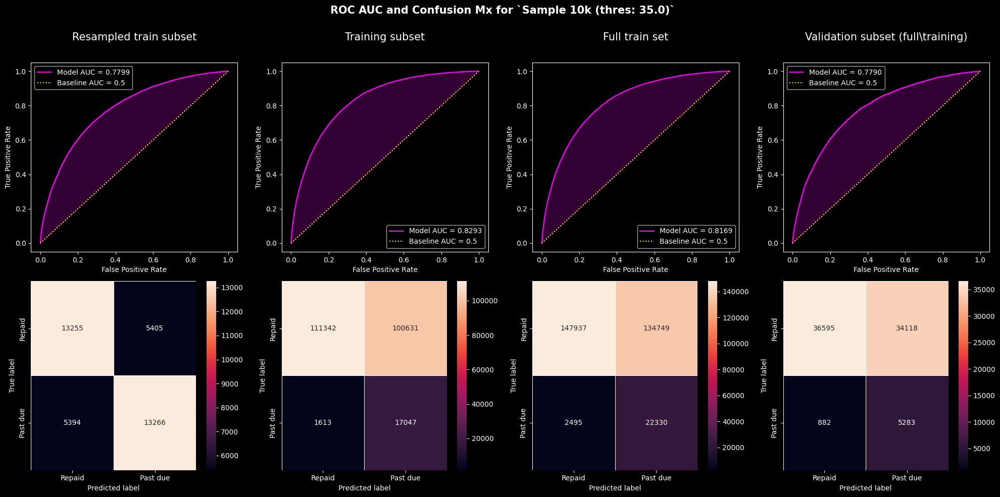


Validation set metrics
ROC AUC: 0.7790386299191038
Accuracy: 0.5447332136632066
ARI: 0.007562236841136362
Jaccard Index: 0.37431845403028297
Precision: 0.5447332136632066
Recall: 0.5447332136632066
F1: 0.5447332136632066
F2: 0.5447332136632066
F4: 0.5447332136632066
F8: 0.5447332136632066
F16: 0.5447332136632066

Undersampled validation set metrics
Original dataset shape Counter({0.0: 70713, 1.0: 6165})
Resampled dataset shape Counter({0.0: 6165, 1.0: 6165})
ROC AUC: 0.7867001076768957
Accuracy: 0.6900243309002433
ARI: 0.14437531954884888
Jaccard Index: 0.5267459138187222
Precision: 0.6900243309002433
Recall: 0.6900243309002433
F1: 0.6900243309002433
F2: 0.6900243309002433
F4: 0.6900243309002434
F8: 0.6900243309002433
F16: 0.6900243309002433


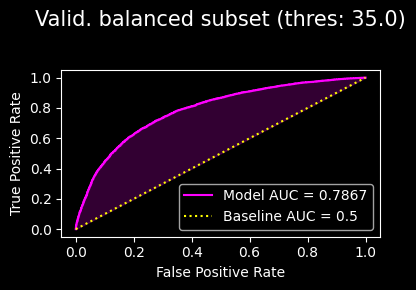

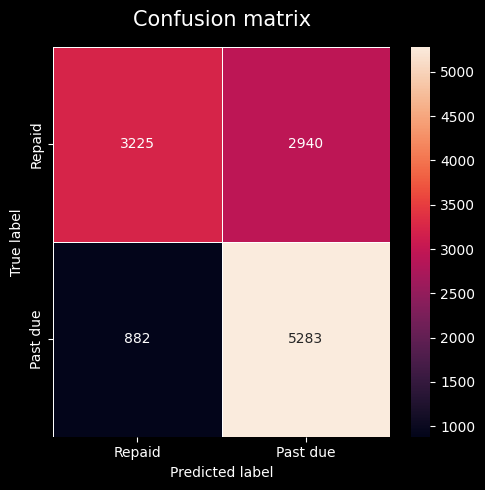

35 % exp res: AUC (0.7867001076768957), FNR (0.27348837209302324), FPR (0.5565019875070982)
Mlflow run (635990a9e4e94390823f84fa13aef58e) completed


In [3]:
from home_credit.mlflow_tracking import do_first_experiment
from home_credit.lightgbm_kernel_v2 import get_opt_lgbm_classifier

run_id = do_first_experiment(
    trainset_name="train_baseline_75pcts",
    clf=get_opt_lgbm_classifier()
)
print(f"Mlflow run ({run_id}) completed")

### `85pcts`

default `mlruns/`: file://C:\Users\franc\Projects\pepper_credit_scoring_tool\tmp\mlruns
this project `mlruns/`: file://C:\Users\franc\Projects\pepper_credit_scoring_tool\tmp\mlruns


2023/05/06 11:46:18 INFO mlflow.tracking.fluent: Experiment with name 'LGBMClassifier_train_baseline_85pcts' does not exist. Creating a new experiment.



Starting train and eval of:
Labeled dataset of shape: (261384, 790)
Features set of shape: (261384, 788)

With:
Classifier: 


LGBMClassifier(callbacks=None, colsample_bytree=0.9497036, learning_rate=0.02,
               max_depth=8, min_child_weight=39.3259775,
               min_split_gain=0.0222415, n_estimators=10000, n_jobs=4,
               num_leaves=34, reg_alpha=0.041545473, reg_lambda=0.0735294,
               subsample=0.8715623)

Loss function: 


{'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

Eval metrics: 


{'F2': <function home_credit.best_model_search.<lambda>(y, y_pred)>,
 'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

On 5 KFolds: 

Resampling
Sampler: 


RandomUnderSampler(random_state=42)

Original dataset shape: Counter({0.0: 240274, 1.0: 21110})
Resampled dataset shape: Counter({0.0: 21110, 1.0: 21110})
Data shape: (42220, 788)

Evaluate the 1-th fold (on 5)
[200]	training's binary_logloss: 0.534374	valid_1's binary_logloss: 0.581261
[400]	training's binary_logloss: 0.491201	valid_1's binary_logloss: 0.571896
[600]	training's binary_logloss: 0.463453	valid_1's binary_logloss: 0.569951
[800]	training's binary_logloss: 0.441014	valid_1's binary_logloss: 0.569513
[1000]	training's binary_logloss: 0.42264	valid_1's binary_logloss: 0.569552
Fold  0 F2: 0.712300
Fold  0 AUC: 0.776136

Evaluate the 2-th fold (on 5)
[200]	training's binary_logloss: 0.535819	valid_1's binary_logloss: 0.575076
[400]	training's binary_logloss: 0.492892	valid_1's binary_logloss: 0.564223
[600]	training's binary_logloss: 0.46416	valid_1's binary_logloss: 0.561846
[800]	training's binary_logloss: 0.441573	valid_1's binary_logloss: 0.561165
[1000]	training's binary_logloss: 0.422078	valid_1's binary_

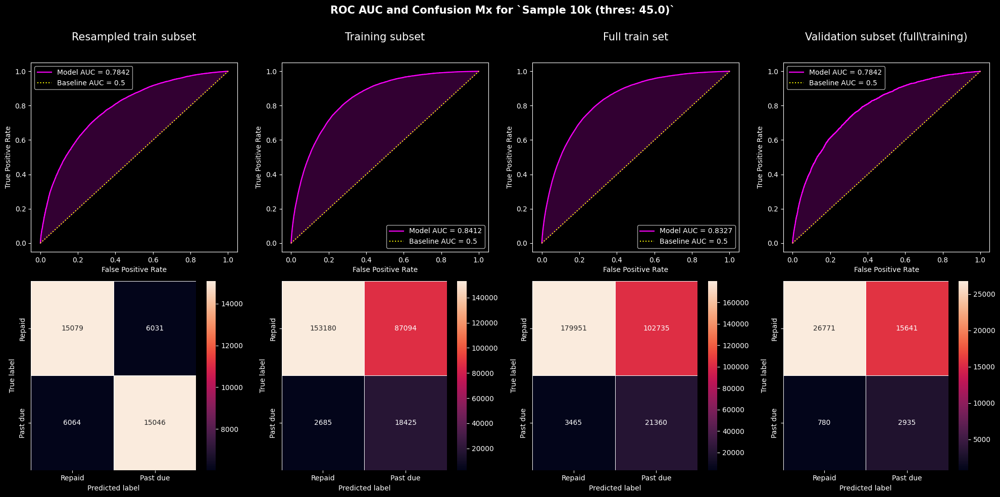


Validation set metrics
ROC AUC: 0.7842311128836921
Accuracy: 0.6440045960066773
ARI: 0.05784038512652429
Jaccard Index: 0.47493125279785126
Precision: 0.6440045960066773
Recall: 0.6440045960066773
F1: 0.6440045960066773
F2: 0.6440045960066773
F4: 0.6440045960066773
F8: 0.6440045960066773
F16: 0.6440045960066773

Undersampled validation set metrics
Original dataset shape Counter({0.0: 42412, 1.0: 3715})
Resampled dataset shape Counter({0.0: 3715, 1.0: 3715})
ROC AUC: 0.777168475986733
Accuracy: 0.7086137281292059
ARI: 0.1739705092812667
Jaccard Index: 0.5487232933819698
Precision: 0.7086137281292059
Recall: 0.7086137281292059
F1: 0.7086137281292059
F2: 0.7086137281292059
F4: 0.7086137281292059
F8: 0.7086137281292058
F16: 0.7086137281292059


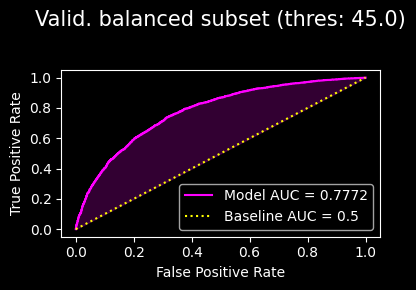

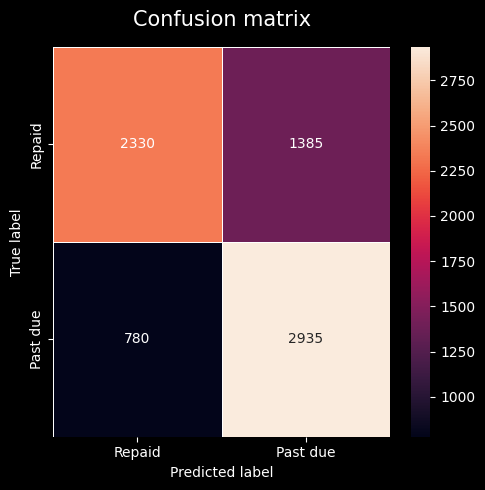

45 % exp res: AUC (0.777168475986733), FNR (0.33476394849785407), FPR (0.47189097103918226)

Post train eval with threshold of 40.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (261384, 788)	ys class counts : (array([0., 1.]), array([240274,  21110], dtype=int64))
Xrs : shape (42220, 788)	yrs class counts : (array([0., 1.]), array([21110, 21110], dtype=int64))
Xv : shape (46127, 788)	yv class counts : (array([0., 1.]), array([42412,  3715], dtype=int64))


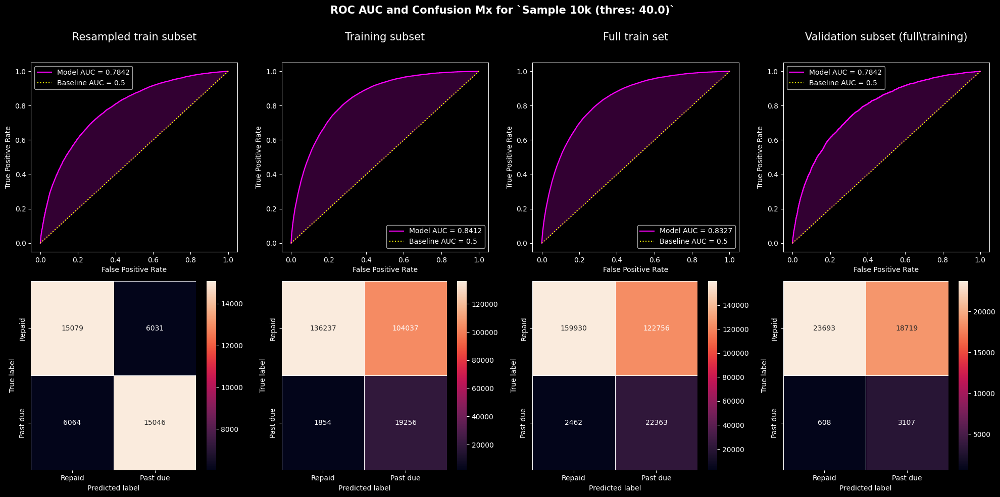


Validation set metrics
ROC AUC: 0.7842311128836921
Accuracy: 0.581004617685954
ARI: 0.024263699162737504
Jaccard Index: 0.4094478565099154
Precision: 0.581004617685954
Recall: 0.581004617685954
F1: 0.581004617685954
F2: 0.581004617685954
F4: 0.581004617685954
F8: 0.581004617685954
F16: 0.581004617685954

Undersampled validation set metrics
Original dataset shape Counter({0.0: 42412, 1.0: 3715})
Resampled dataset shape Counter({0.0: 3715, 1.0: 3715})
ROC AUC: 0.777168475986733
Accuracy: 0.6942126514131898
ARI: 0.15076913939300274
Jaccard Index: 0.5316429602143888
Precision: 0.6942126514131898
Recall: 0.6942126514131898
F1: 0.6942126514131898
F2: 0.6942126514131898
F4: 0.6942126514131898
F8: 0.6942126514131898
F16: 0.6942126514131898


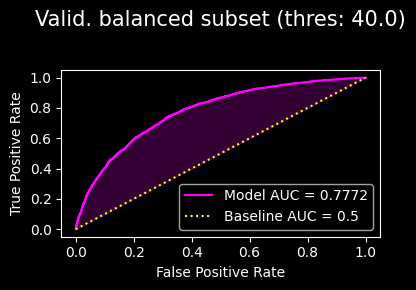

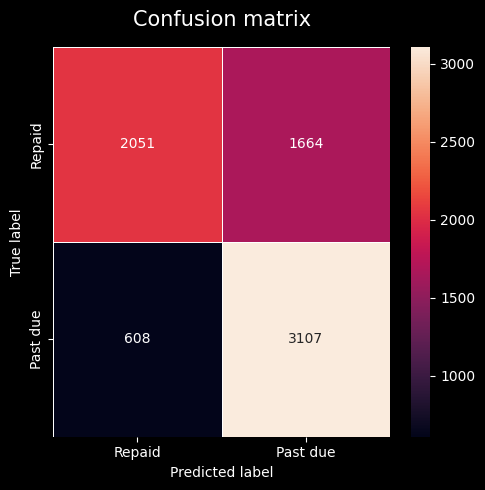

40 % exp res: AUC (0.777168475986733), FNR (0.29644076060458313), FPR (0.5355648535564853)

Post train eval with threshold of 35.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (261384, 788)	ys class counts : (array([0., 1.]), array([240274,  21110], dtype=int64))
Xrs : shape (42220, 788)	yrs class counts : (array([0., 1.]), array([21110, 21110], dtype=int64))
Xv : shape (46127, 788)	yv class counts : (array([0., 1.]), array([42412,  3715], dtype=int64))


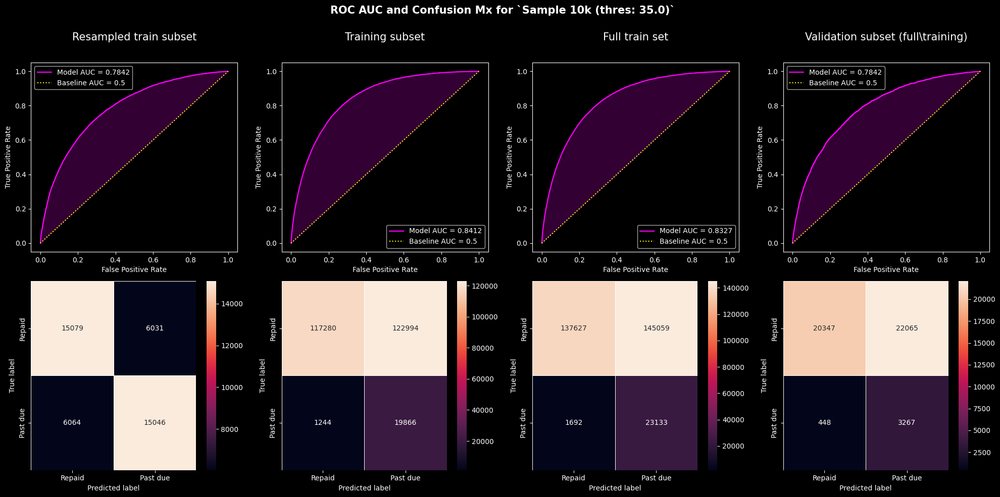


Validation set metrics
ROC AUC: 0.7842311128836921
Accuracy: 0.5119344418670193
ARI: -0.0062883033872942985
Jaccard Index: 0.3440268065268065
Precision: 0.5119344418670193
Recall: 0.5119344418670193
F1: 0.5119344418670193
F2: 0.5119344418670193
F4: 0.5119344418670193
F8: 0.5119344418670193
F16: 0.5119344418670193

Undersampled validation set metrics
Original dataset shape Counter({0.0: 42412, 1.0: 3715})
Resampled dataset shape Counter({0.0: 3715, 1.0: 3715})
ROC AUC: 0.777168475986733
Accuracy: 0.6784656796769852
ARI: 0.12730149641603233
Jaccard Index: 0.5133924024849781
Precision: 0.6784656796769852
Recall: 0.6784656796769852
F1: 0.6784656796769852
F2: 0.6784656796769851
F4: 0.6784656796769852
F8: 0.6784656796769852
F16: 0.6784656796769852


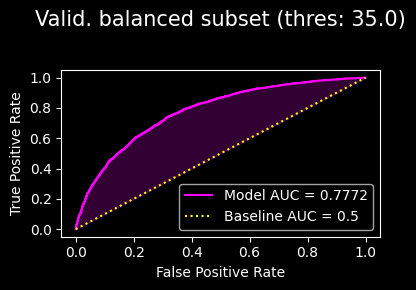

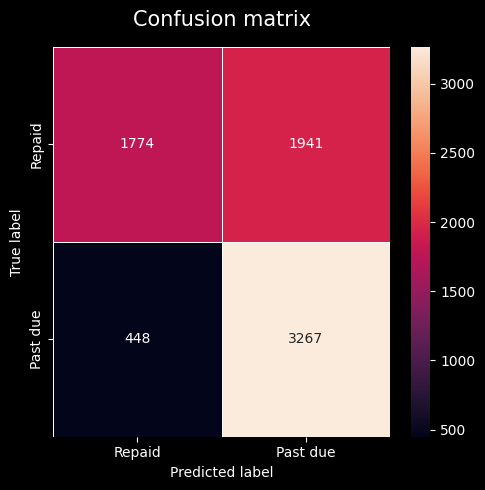

35 % exp res: AUC (0.777168475986733), FNR (0.2525366403607666), FPR (0.5941230486685032)
Mlflow run (437db2265b2e4aeab2670ee6dad2e704) completed


In [3]:
from home_credit.mlflow_tracking import do_first_experiment
from home_credit.lightgbm_kernel_v2 import get_opt_lgbm_classifier

run_id = do_first_experiment(
    trainset_name="train_baseline_85pcts",
    clf=get_opt_lgbm_classifier()
)
print(f"Mlflow run ({run_id}) completed")

### `95pcts`

default `mlruns/`: file://C:\Users\franc\Projects\pepper_credit_scoring_tool\tmp\mlruns
this project `mlruns/`: file://C:\Users\franc\Projects\pepper_credit_scoring_tool\tmp\mlruns


2023/05/06 13:38:03 INFO mlflow.tracking.fluent: Experiment with name 'LGBMClassifier_train_baseline_95pcts' does not exist. Creating a new experiment.



Starting train and eval of:
Labeled dataset of shape: (292135, 790)
Features set of shape: (292135, 788)

With:
Classifier: 


LGBMClassifier(callbacks=None, colsample_bytree=0.9497036, learning_rate=0.02,
               max_depth=8, min_child_weight=39.3259775,
               min_split_gain=0.0222415, n_estimators=10000, n_jobs=4,
               num_leaves=34, reg_alpha=0.041545473, reg_lambda=0.0735294,
               subsample=0.8715623)

Loss function: 


{'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

Eval metrics: 


{'F2': <function home_credit.best_model_search.<lambda>(y, y_pred)>,
 'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

On 5 KFolds: 

Resampling
Sampler: 


RandomUnderSampler(random_state=42)

Original dataset shape: Counter({0.0: 268517, 1.0: 23618})
Resampled dataset shape: Counter({0.0: 23618, 1.0: 23618})
Data shape: (47236, 788)

Evaluate the 1-th fold (on 5)
[200]	training's binary_logloss: 0.538927	valid_1's binary_logloss: 0.578677
[400]	training's binary_logloss: 0.498565	valid_1's binary_logloss: 0.569028
[600]	training's binary_logloss: 0.474265	valid_1's binary_logloss: 0.566546
[800]	training's binary_logloss: 0.453494	valid_1's binary_logloss: 0.565835
[1000]	training's binary_logloss: 0.435349	valid_1's binary_logloss: 0.565549
Fold  0 F2: 0.709208
Fold  0 AUC: 0.779484

Evaluate the 2-th fold (on 5)
[200]	training's binary_logloss: 0.541624	valid_1's binary_logloss: 0.572236
[400]	training's binary_logloss: 0.50178	valid_1's binary_logloss: 0.560955
[600]	training's binary_logloss: 0.476641	valid_1's binary_logloss: 0.558344
[800]	training's binary_logloss: 0.455911	valid_1's binary_logloss: 0.557672
[1000]	training's binary_logloss: 0.437537	valid_1's binary

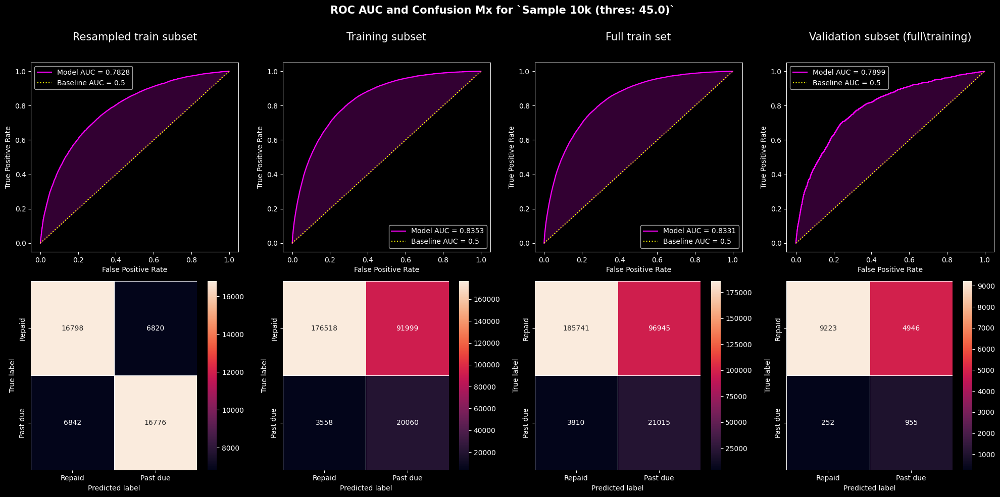


Validation set metrics
ROC AUC: 0.7898711511992498
Accuracy: 0.6619406867845994
ARI: 0.06914186476253138
Jaccard Index: 0.4947020511324973
Precision: 0.6619406867845994
Recall: 0.6619406867845994
F1: 0.6619406867845994
F2: 0.6619406867845994
F4: 0.6619406867845994
F8: 0.6619406867845994
F16: 0.6619406867845994

Undersampled validation set metrics
Original dataset shape Counter({0.0: 14169, 1.0: 1207})
Resampled dataset shape Counter({0.0: 1207, 1.0: 1207})
ROC AUC: 0.7994582829105831
Accuracy: 0.724109362054681
ARI: 0.20057469340212108
Jaccard Index: 0.5675324675324676
Precision: 0.724109362054681
Recall: 0.724109362054681
F1: 0.7241093620546811
F2: 0.724109362054681
F4: 0.724109362054681
F8: 0.724109362054681
F16: 0.7241093620546809


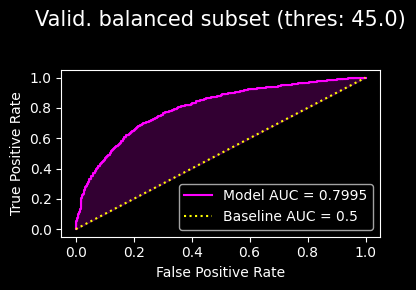

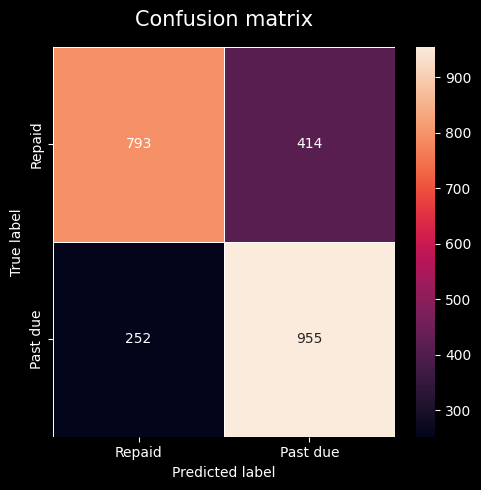

45 % exp res: AUC (0.7994582829105831), FNR (0.31778058007566207), FPR (0.43350785340314135)

Post train eval with threshold of 40.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (292135, 788)	ys class counts : (array([0., 1.]), array([268517,  23618], dtype=int64))
Xrs : shape (47236, 788)	yrs class counts : (array([0., 1.]), array([23618, 23618], dtype=int64))
Xv : shape (15376, 788)	yv class counts : (array([0., 1.]), array([14169,  1207], dtype=int64))


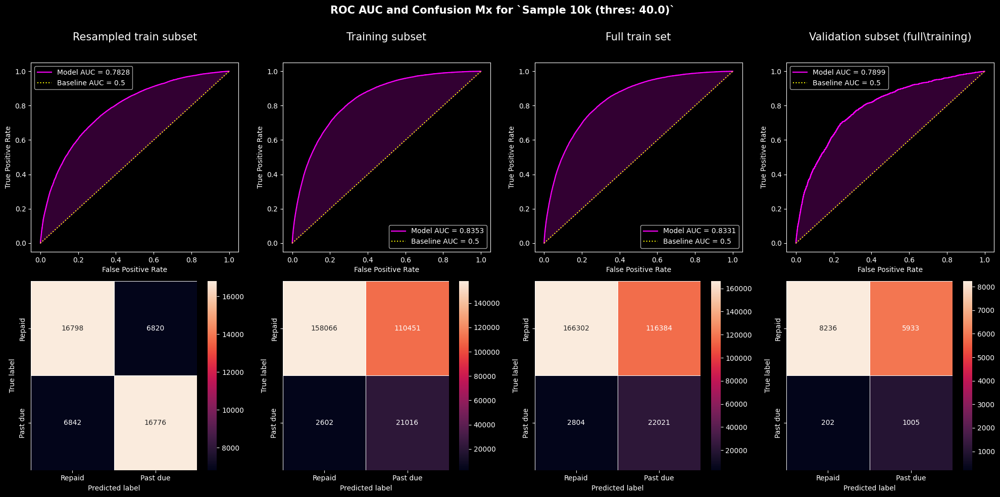


Validation set metrics
ROC AUC: 0.7898711511992498
Accuracy: 0.6010015608740895
ARI: 0.0342557251630091
Jaccard Index: 0.4295941611268653
Precision: 0.6010015608740895
Recall: 0.6010015608740895
F1: 0.6010015608740895
F2: 0.6010015608740895
F4: 0.6010015608740895
F8: 0.6010015608740895
F16: 0.6010015608740895

Undersampled validation set metrics
Original dataset shape Counter({0.0: 14169, 1.0: 1207})
Resampled dataset shape Counter({0.0: 1207, 1.0: 1207})
ROC AUC: 0.7994582829105831
Accuracy: 0.7129246064623033
ARI: 0.18102760984053473
Jaccard Index: 0.5539105246218217
Precision: 0.7129246064623033
Recall: 0.7129246064623033
F1: 0.7129246064623034
F2: 0.7129246064623034
F4: 0.7129246064623033
F8: 0.7129246064623034
F16: 0.7129246064623032


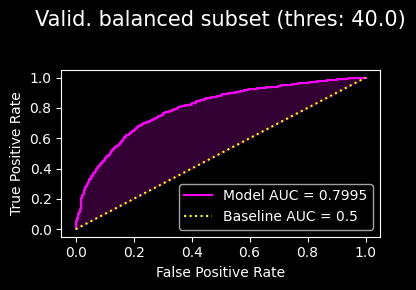

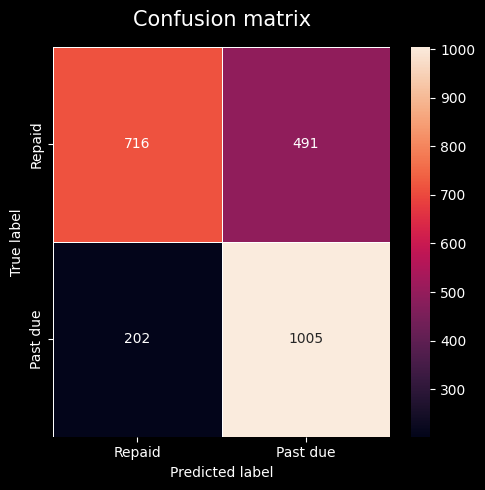

40 % exp res: AUC (0.7994582829105831), FNR (0.28212290502793297), FPR (0.48855721393034823)

Post train eval with threshold of 35.0 %
X : shape (307511, 788)	y class counts : (array([0., 1.]), array([282686,  24825], dtype=int64))
Xs : shape (292135, 788)	ys class counts : (array([0., 1.]), array([268517,  23618], dtype=int64))
Xrs : shape (47236, 788)	yrs class counts : (array([0., 1.]), array([23618, 23618], dtype=int64))
Xv : shape (15376, 788)	yv class counts : (array([0., 1.]), array([14169,  1207], dtype=int64))


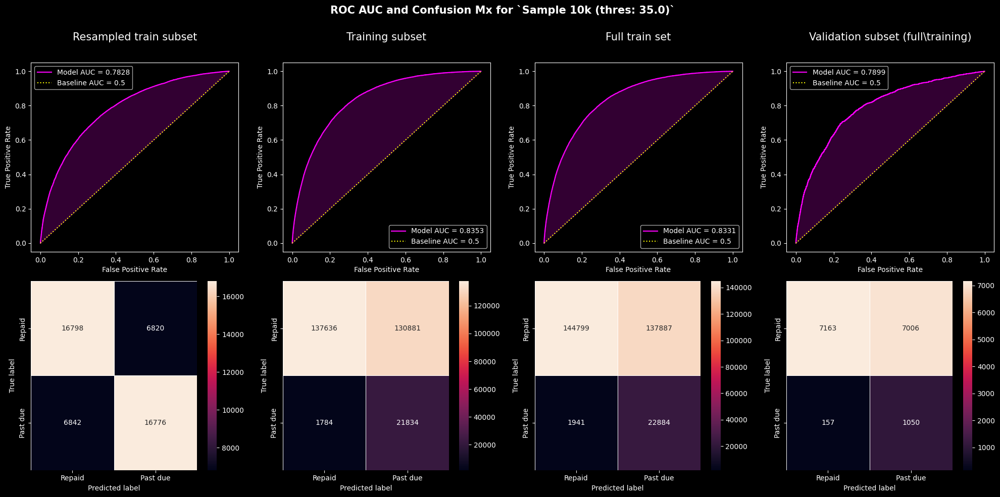


Validation set metrics
ROC AUC: 0.7898711511992498
Accuracy: 0.5341441207075962
ARI: 0.003021214662216285
Jaccard Index: 0.36439061182838633
Precision: 0.5341441207075962
Recall: 0.5341441207075962
F1: 0.5341441207075962
F2: 0.5341441207075962
F4: 0.5341441207075962
F8: 0.5341441207075962
F16: 0.5341441207075962

Undersampled validation set metrics
Original dataset shape Counter({0.0: 14169, 1.0: 1207})
Resampled dataset shape Counter({0.0: 1207, 1.0: 1207})
ROC AUC: 0.7994582829105831
Accuracy: 0.7009113504556752
ARI: 0.16115356863471775
Jaccard Index: 0.5395408163265306
Precision: 0.7009113504556752
Recall: 0.7009113504556752
F1: 0.7009113504556752
F2: 0.7009113504556751
F4: 0.7009113504556752
F8: 0.7009113504556752
F16: 0.7009113504556752


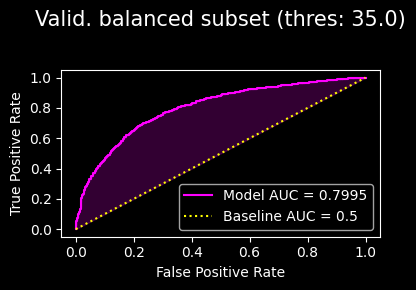

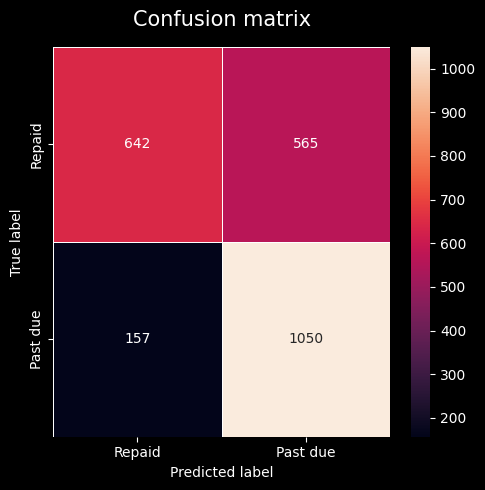

35 % exp res: AUC (0.7994582829105831), FNR (0.24454828660436137), FPR (0.5380952380952381)
Mlflow run (80a184b45deb4b719d99d5999ba4fa1b) completed


In [4]:
from home_credit.mlflow_tracking import do_first_experiment
from home_credit.lightgbm_kernel_v2 import get_opt_lgbm_classifier

run_id = do_first_experiment(
    trainset_name="train_baseline_95pcts",
    clf=get_opt_lgbm_classifier()
)
print(f"Mlflow run ({run_id}) completed")

# Sérialisation du meilleur modèle

C'est la dernière étape avant de passer à la mise en production du modèle.

Quelle sont les méthodes ?

pickle, etc.

SKL en parle : pickle, le modèle de sérialsiation natif de Python n'est pas idéal.

Voir la section [**Model persistence** (9)](https://scikit-learn.org/stable/model_persistence.html) du manuel d'utilisation.

avantages et inconvénients de chacune d'entre elles ?

Cette section est largement inspirée de la documentation d'utilisation de Scikit-learn.

In [28]:
import os
from pepper.env import get_tmp_dir

tmp_dir = get_tmp_dir()
clf_name = "lgbm_model_baseline"
model_pkl_path = os.path.join(tmp_dir, f"{clf_name}.pkl")

## Pickle et Jolib

Il est possible de sauvegarder un modèle dans scikit-learn en utilisant le modèle de persistance intégré de Python, à savoir [pickle](https://docs.python.org/3/library/pickle.html) :

In [ ]:
import pickle

with open(model_pkl_path, "wb") as f:
    pickle.dump(clf, f)

In [ ]:
import pickle

with open(model_pkl_path, "rb") as f:
    clf2 = pickle.load(f)

y_pred = clf2.predict(X[0:1])
y_true = y[0]

Dans le cas spécifique de scikit-learn, il peut être préférable de subtituer les `dump` & `load` de `joblib` à ceux de `pickle`. `joblib` est plus efficace sur les objets qui comportent de grands tableaux `numpy` en interne, comme c'est souvent le cas pour les estimateurs ajustés de scikit-learn. Inconvénient : il n'est pas possible de *pickler* sur une chaîne, mais seulement de charger depuis le disque

In [ ]:
from joblib import dump, load

model_joblib_path = os.path.join(tmp_dir, f"{clf_name}.joblib")

dump(clf, model_joblib_path)

Le modèle picklé peut être rechargé plus tard (éventuellement dans un autre processus Python) avec :

In [ ]:
dump(clf, model_joblib_path)

**NB** - les fonctions `dump` et `load` acceptent également les objets de type fichier au lieu de noms de fichiers. 

Plus d'informations sur la persistance des données avec [**Joblib**](https://joblib.readthedocs.io/en/latest/persistence.html).

### Limites de sécurité et de maintenabilité

pickle (et joblib par extension), a quelques problèmes concernant la maintenabilité et la sécurité. À cause de cela,
* Ne jamais charger de données non fiables, car cela pourrait entraîner l'exécution d'un code malveillant lors du chargement.
* Bien que les modèles enregistrés à l'aide d'une version de scikit-learn puissent se charger dans d'autres versions, cela n'est absolument pas pris en charge et déconseillé. Il convient également de garder à l'esprit que les opérations effectuées sur ces données pourraient donner des résultats différents et inattendus.

Afin de reconstruire un modèle similaire avec les futures versions de scikit-learn, des métadonnées supplémentaires doivent être enregistrées avec le modèle picklé :
* Les **données d'entraînement**, par ex. une référence à un instantané immuable
* Le **code source Python utilisé pour générer le modèle**
* Les **versions de scikit-learn et ses dépendances**
* Le **score de validation croisée obtenu sur les données d'apprentissage**

Cela devrait permettre de vérifier que le score de validation croisée est dans la même fourchette qu'auparavant.

À quelques exceptions près, les modèles picklés devraient être portables sur toutes les architectures en supposant que les mêmes versions de dépendances et de Python sont utilisées. Si vous rencontrez un estimateur qui n'est pas portable, veuillez ouvrir un problème sur GitHub. Les modèles picklés sont souvent déployés en production à l'aide de conteneurs, comme Docker, afin de figer l'environnement et les dépendances.

Si vous souhaitez en savoir plus sur ces problèmes et explorer d'autres méthodes de sérialisation possibles, veuillez vous reporter à cette [conférence d'Alex Gaynor](https://pyvideo.org/pycon-us-2014/pickles-are-for-delis-not-software.html).

### Un format plus sécurisé : `skops`

[**`skops`**](https://skops.readthedocs.io/en/stable/) fournit un format plus sécurisé via le module [**`skops.io`**](https://skops.readthedocs.io/en/stable/modules/classes.html#module-skops.io). Il évite d'utiliser `pickle` et ne charge que des fichiers ayant des types et des références à des fonctions qui sont considérés comme fiables par défaut ou par l'utilisateur. L'API est très similaire à `pickle`, et vous pouvez persister vos modèles comme expliqué dans la [documentation](https://skops.readthedocs.io/en/stable/persistence.html) en utilisant [`skops.io.dump`](https://skops.readthedocs.io/en/stable/modules/classes.html#skops.io.dump) et [`skops.io.dumps`](https://skops.readthedocs.io/en/stable/modules/classes.html#skops.io.dump).

In [ ]:
import skops.io as sio
obj = sio.dumps(clf)

Les modèles peuvent être rechargés en utilisant [`skops.io.load`](https://skops.readthedocs.io/en/stable/modules/classes.html#skops.io.load) et [`skops.io.loads`](https://skops.readthedocs.io/en/stable/modules/classes.html#skops.io.loads). Il faut néanmoins spécifier les types de données considérés fiables. Les types inconnus existants dans un objet / fichier dumpé peuvent être passés en revue à l'aide de [`skops.io.get_untrusted_types`](https://skops.readthedocs.io/en/stable/modules/classes.html#skops.io.get_untrusted_types), et après cette vérification, l'objet peut être passé à la fonction de chargement.

In [ ]:
unknown_types = sio.get_untrusted_types(obj)
clf = sio.loads(obj, trusted=unknown_types)

Si vous faites confiance à la source du fichier / objet, vous pouvez passer `trusted=True`.

In [ ]:
clf = sio.loads(obj, trusted=True)

## Formats interopérables : [sklearn-onnx](http://onnx.ai/sklearn-onnx/)

Pour des besoins de reproductibilité et de contrôle de la qualité, lorsque différentes architectures et environnements doivent être pris en compte, l'exportation du modèle au format [Open Neural Network Exchange (ONNX)](https://onnx.ai/) ou au format [Predictive Model Markup Language (PMML)](https://dmg.org/pmml/v4-4-1/GeneralStructure.html) peut être une meilleure approche que l'utilisation de pickle seul. Celles-ci sont utiles lorsque vous souhaitez utiliser votre modèle pour la prédiction dans un environnement différent de celui dans lequel le modèle a été formé.

ONNX est une sérialisation binaire du modèle. Il a été développé pour améliorer l'utilisabilité de la représentation interopérable des modèles de données. Il vise à faciliter la conversion des modèles de données entre différents frameworks d'apprentissage automatique, et à améliorer leur portabilité sur différentes architectures informatiques. Plus de détails sont disponibles dans le [tutoriel ONNX](https://onnx.ai/get-started.html). Pour convertir le modèle scikit-learn en ONNX, un outil spécifique [sklearn-onnx](http://onnx.ai/sklearn-onnx/) a été développé.

PMML est une implémentation de la norme de document [XML](https://en.wikipedia.org/wiki/XML) définie pour représenter des modèles de données avec les données utilisées pour les générer. Étant lisible par l'homme et la machine, PMML est une bonne option pour la validation de modèles sur différentes plates-formes et l'archivage à long terme. D'autre part, comme XML en général, sa verbosité n'aide pas en production lorsque les performances sont critiques. Pour convertir le modèle scikit-learn en PMML, vous pouvez utiliser par exemple [sklearn2pmml](https://github.com/jpmml/sklearn2pmml) distribué sous la licence Affero GPLv3.

### Exemple SKL-ONNX

Extrait de http://onnx.ai/sklearn-onnx/

```Python
# Train a model.
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
iris = load_iris()
X, y = iris.data, iris.target
X_train, X_test, y_train, y_test = train_test_split(X, y)
clr = RandomForestClassifier()
clr.fit(X_train, y_train)

# Convert into ONNX format
from skl2onnx import convert_sklearn
from skl2onnx.common.data_types import FloatTensorType
initial_type = [('float_input', FloatTensorType([None, 4]))]
onx = convert_sklearn(clr, initial_types=initial_type)
with open("rf_iris.onnx", "wb") as f:
    f.write(onx.SerializeToString())

# Compute the prediction with ONNX Runtime
import onnxruntime as rt
import numpy
sess = rt.InferenceSession("rf_iris.onnx", providers=["CPUExecutionProvider"])
input_name = sess.get_inputs()[0].name
label_name = sess.get_outputs()[0].name
pred_onx = sess.run([label_name], {input_name: X_test.astype(numpy.float32)})[0]
```

## Fonctions `save_model` et `load_model`

A mettre dans `pepper.persist` à l'issue du projet, mais pour le moment dans `home_credit.persist`.

In [1]:
from home_credit.load import load_prep_dataset
from home_credit.best_model_search import kfold_train_and_eval_model
# from sklearn.linear_model import LogisticRegression
from home_credit.lightgbm_kernel_v2 import get_opt_lgbm_classifier

data = load_prep_dataset("baseline_v1")
sample_10k = data.sample(10_000)

# clf = LogisticRegression(C=1e-4, random_state=42)
clf = get_opt_lgbm_classifier()
res = kfold_train_and_eval_model(
    sample_10k, clf,
    verbosity=1,
    return_trained_clf=True
)

Starting train and eval of:
Labeled dataset of shape: (10000, 790)
Features set of shape: (10000, 788)
With:
Classifier: 


LGBMClassifier(callbacks=None, colsample_bytree=0.9497036, learning_rate=0.02,
               max_depth=8, min_child_weight=39.3259775,
               min_split_gain=0.0222415, n_estimators=10000, n_jobs=4,
               num_leaves=34, reg_alpha=0.041545473, reg_lambda=0.0735294,
               subsample=0.8715623)

Loss function: 


{'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

Eval metrics: 


{'F2': <function home_credit.best_model_search.<lambda>(y_valid, y_pred)>,
 'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

On 5 KFolds: 
Sampler: 


SMOTETomek()

Original dataset shape: Counter({0.0: 7911, -1.0: 1364, 1.0: 725})
Resampled dataset shape: Counter({1.0: 7733, -1.0: 7657, 0.0: 7585})
	Train shape: (15318, 788)
	Test shape: (7657, 788)
[200]	training's binary_logloss: 0.149252	valid_1's binary_logloss: 0.181401
[400]	training's binary_logloss: 0.10814	valid_1's binary_logloss: 0.154264
[600]	training's binary_logloss: 0.0912112	valid_1's binary_logloss: 0.148484
[800]	training's binary_logloss: 0.0796537	valid_1's binary_logloss: 0.14653
[1000]	training's binary_logloss: 0.0710025	valid_1's binary_logloss: 0.145283
[1200]	training's binary_logloss: 0.0641208	valid_1's binary_logloss: 0.144938
Fold  0 F2: 0.923617
Fold  0 AUC: 0.980564
[200]	training's binary_logloss: 0.151491	valid_1's binary_logloss: 0.167843
[400]	training's binary_logloss: 0.110202	valid_1's binary_logloss: 0.139627
[600]	training's binary_logloss: 0.0933735	valid_1's binary_logloss: 0.133336
[800]	training's binary_logloss: 0.081895	valid_1's binary_logloss: 0.1

In [2]:
from home_credit.persist import save_model, load_model

save_model(clf, "lgbm_baseline_defaults_10k")
clf = load_model("lgbm_baseline_defaults_10k")
display(clf)

C:\Users\franc\Projects\pepper_credit_scoring_tool\modules\home_credit\persist.py:193: UserWarning: Using a non-skops.io save engine can potentially load malicious objects. It is recommended to use skops.io instead.
  warnings.warn(


LGBMClassifier(callbacks=None, colsample_bytree=0.9497036, learning_rate=0.02,
               max_depth=8, min_child_weight=39.3259775,
               min_split_gain=0.0222415, n_estimators=10000, n_jobs=4,
               num_leaves=34, reg_alpha=0.041545473, reg_lambda=0.0735294,
               subsample=0.8715623)

In [ ]:
import skops.io as sio
from home_credit.persist import _get_model_filepath

filepath = _get_model_filepath(None, "lgbm_baseline_defaults_10k", "sio")
types = sio.get_untrusted_types(file=filepath)
print(types)

sio.visualize(filepath, use_colors=False)

In [ ]:
from home_credit.persist import save_model, load_model
import skops.io as sio

save_model(clf, "lgbm_baseline_defaults_10k", save_engine=sio)
clf = load_model("lgbm_baseline_defaults_10k", save_engine=sio)
display(clf)

### Sauvegarde des métadonnées 

Afin de reconstruire un modèle similaire avec les futures versions de scikit-learn, des métadonnées supplémentaires doivent être enregistrées avec le modèle picklé :
* Les **données d'entraînement**, par ex. une référence à un instantané immuable
* Le **code source Python utilisé pour générer le modèle**
* Les **versions de scikit-learn et ses dépendances**
* Le **score de validation croisée obtenu sur les données d'apprentissage**

N'oublions pas non plus d'enregistrer dans les métadonnées la date et l'heure de l'entraînement ainsi que les hyperparamètres utilisés pour le pré-traitement et pour l'entraînement.

#### Code source Python de génération du modèle

Pour enregistrer le code source, la fonction `inspect.getsource()` de Python qui permet d'obtenir le code source d'une fonction ou d'une classe. Il est ainsi possible de sauvegarder le code source de chaque étape des pipelines de prétraitement des données et d'entraînement et validation du modèle.

#### Version de SKL et de ses dépendances

Le module `pkg_resources` de Python permet d'enregistrer les versions de scikit-learn et ses dépendances.

, tu peux utiliser le module . Tu peux l'utiliser pour récupérer la version de scikit-learn et d'autres dépendances installées, et les enregistrer dans un fichier texte ou dans les métadonnées du modèle sauvegardé.

In [7]:
import json
import sklearn
import joblib
import sys

import pkg_resources

import sklearn
import joblib
import sys

# Print the versions of scikit-learn and its dependencies
sklearn_version = pkg_resources.get_distribution("scikit-learn").version
print(sklearn_version)

print("scikit-learn version:", sklearn.__version__)
print("Python version:", sys.version)
print("Joblib version:", joblib.__version__)

# Store the versions of scikit-learn and its dependencies
versions = {
    "scikit-learn": sklearn.__version__,
    "Python": sys.version,
    "Joblib": joblib.__version__,
}

# Save the versions to a JSON file
# with open("versions.json", "w") as f:
#    json.dump(versions, f)

1.2.2
scikit-learn version: 1.2.2
Python version: 3.11.1 (tags/v3.11.1:a7a450f, Dec  6 2022, 19:58:39) [MSC v.1934 64 bit (AMD64)]
Joblib version: 1.2.0


#### Score de validation croisée obtenu sur les données d'apprentissage

Le score de validation croisée peut être obtenu à l'aide de la fonction `cross_val_score` de scikit-learn.

## Sauvarde de tous les modèles pour les tests de prod

**Note** Section dépréciée mais non encore refondue

### On commence avec les version 10k


Train and eval `logreg_baseline_default_10k`

Confusion matrix


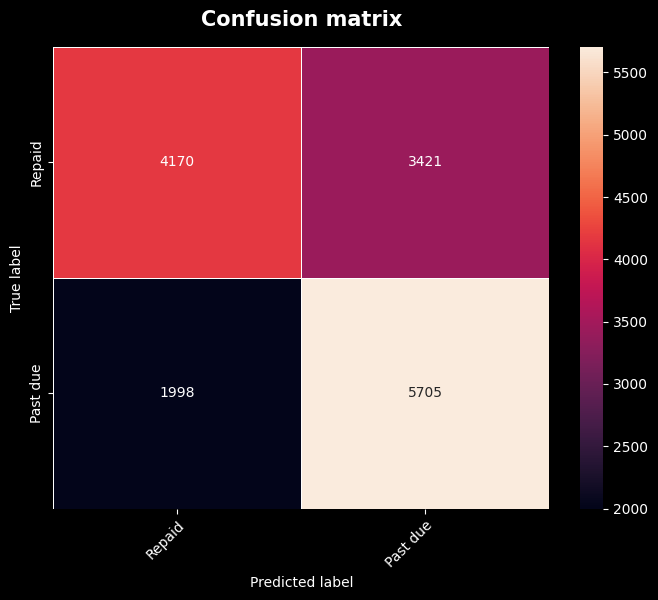


ROC AUC
overall AUC verif: 0.6990101819332675


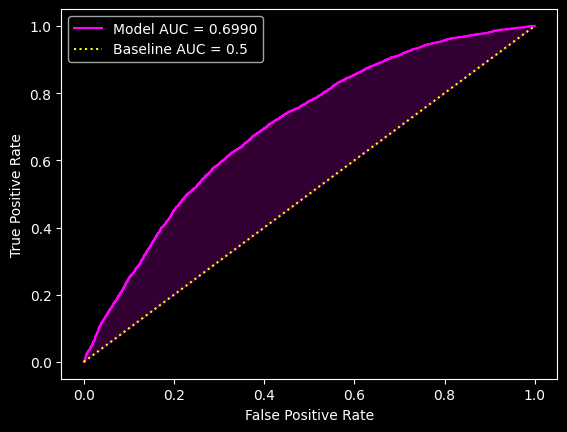


feature importances


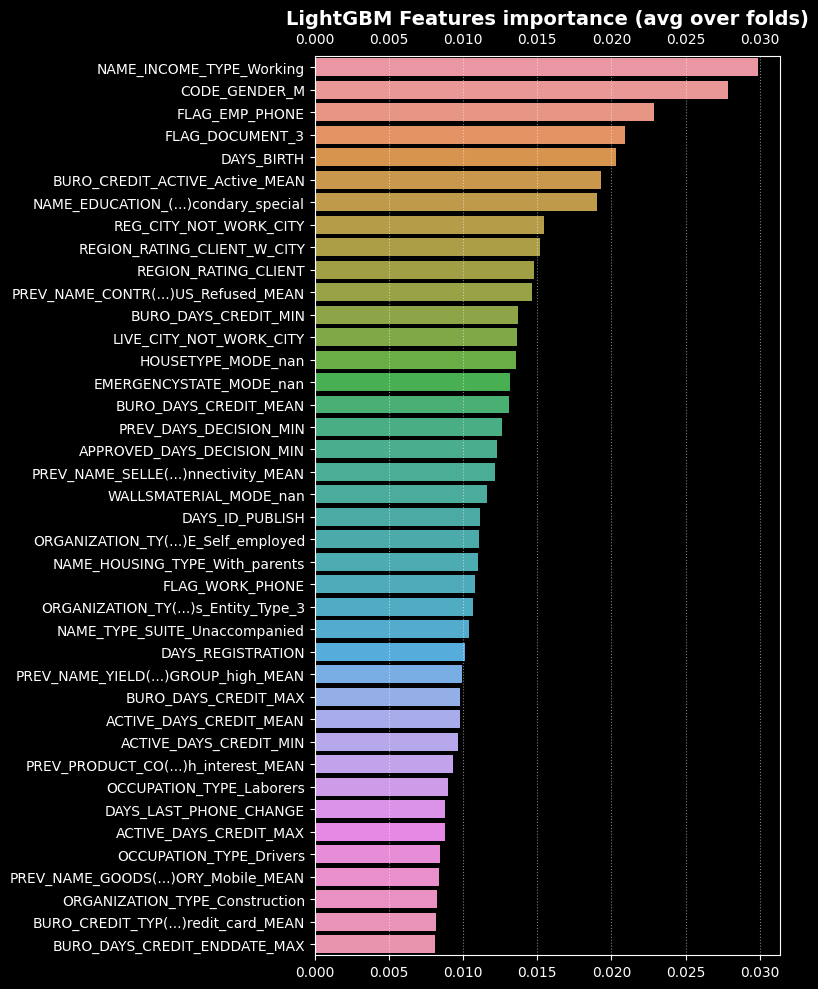

save model `logreg_baseline_default_10k`


LogisticRegression(C=0.0001, random_state=42)


Train and eval `forest_baseline_default_10k`


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    1


Confusion matrix


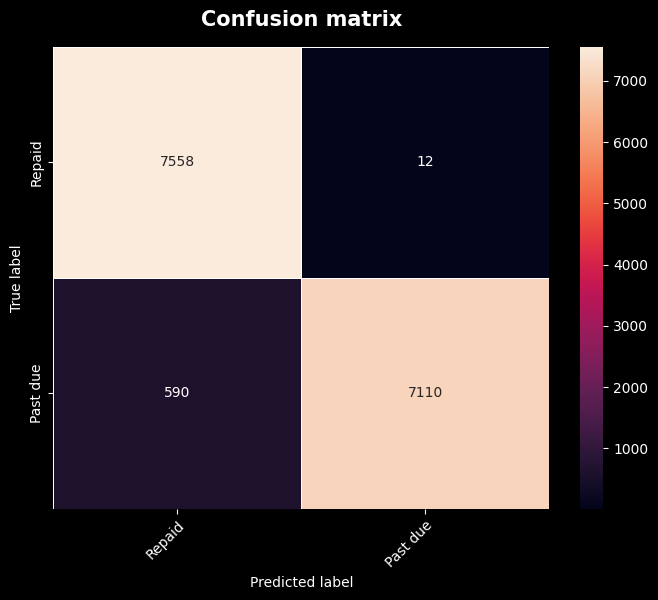


ROC AUC
overall AUC verif: 0.9924116728713822


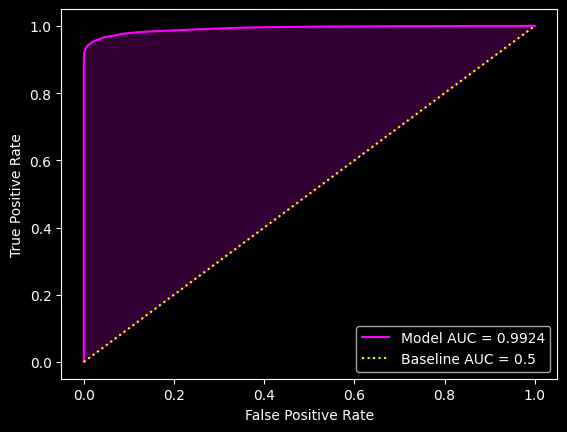


feature importances


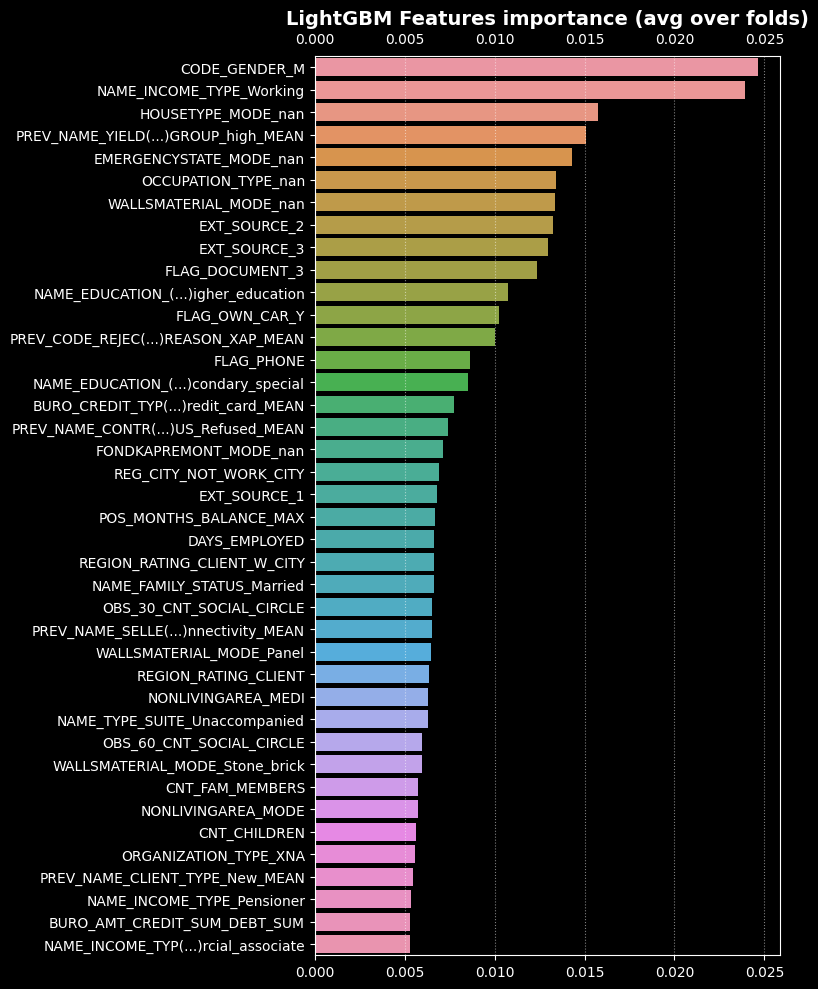

save model `forest_baseline_default_10k`


RandomForestClassifier(n_jobs=-1, random_state=42, verbose=1)


Train and eval `lgbm_baseline_default_10k`
[200]	training's binary_logloss: 0.147967	valid_1's binary_logloss: 0.179687
[400]	training's binary_logloss: 0.107951	valid_1's binary_logloss: 0.153082
[600]	training's binary_logloss: 0.0908428	valid_1's binary_logloss: 0.148136
[800]	training's binary_logloss: 0.0795612	valid_1's binary_logloss: 0.146457
[1000]	training's binary_logloss: 0.0711166	valid_1's binary_logloss: 0.145914
[1200]	training's binary_logloss: 0.0644402	valid_1's binary_logloss: 0.145638
[1400]	training's binary_logloss: 0.0589023	valid_1's binary_logloss: 0.145761
[200]	training's binary_logloss: 0.149569	valid_1's binary_logloss: 0.167039
[400]	training's binary_logloss: 0.109377	valid_1's binary_logloss: 0.141897
[600]	training's binary_logloss: 0.0923324	valid_1's binary_logloss: 0.13674
[800]	training's binary_logloss: 0.0807865	valid_1's binary_logloss: 0.134955
[1000]	training's binary_logloss: 0.0718842	valid_1's binary_logloss: 0.134753
[1200]	training's bin

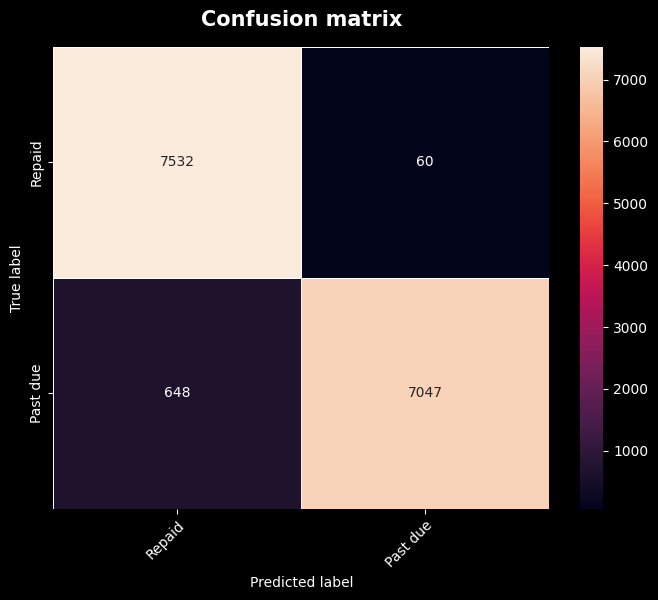


ROC AUC
overall AUC verif: 0.9812463582951447


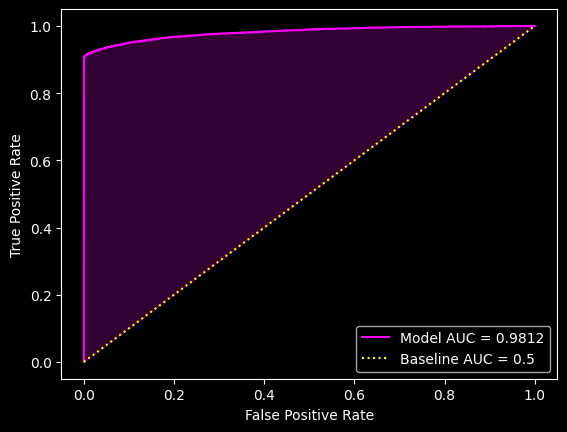


feature importances


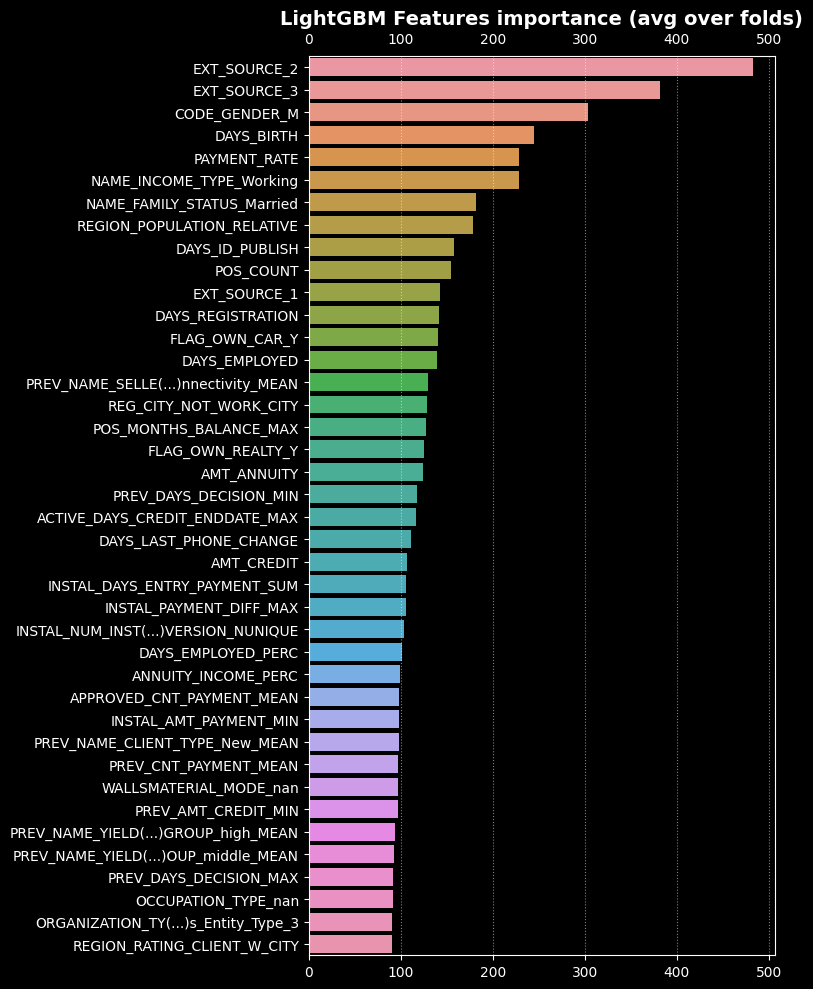

save model `lgbm_baseline_default_10k`


LGBMClassifier(callbacks=None, colsample_bytree=0.9497036, learning_rate=0.02,
               max_depth=8, min_child_weight=39.3259775,
               min_split_gain=0.0222415, n_estimators=10000, n_jobs=4,
               num_leaves=34, reg_alpha=0.041545473, reg_lambda=0.0735294,
               subsample=0.8715623)

In [1]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from home_credit.lightgbm_kernel_v2 import get_opt_lgbm_classifier

from sklearn.metrics import roc_auc_score
from pepper.utils import print_subtitle, print_subsubtitle
from pepper.scoring import show_confusion_matrix
from home_credit.best_model_search import plot_roc_curve
from home_credit.lightgbm_kernel_v2 import display_importances

from home_credit.load import load_prep_dataset
from home_credit.best_model_search import kfold_train_and_eval_model
from home_credit.persist import save_model  #, load_model

data_version = "baseline"
params_version = "default"
sample_version = "10k"
data = load_prep_dataset("baseline_v1")
sample_10k = data.sample(10_000)

clfs = {
    "logreg": LogisticRegression(C=1e-4, random_state=42),
    "forest": RandomForestClassifier(
        n_estimators=100, random_state=42,
        verbose=1, n_jobs=-1
    ),
    "lgbm": get_opt_lgbm_classifier()
}

for clf_name, clf in clfs.items():
    model_name = f"{clf_name}_{data_version}_{params_version}_{sample_version}"
    print_subtitle(f"Train and eval `{model_name}`")

    res = kfold_train_and_eval_model(
        sample_10k, clf,
        verbosity=0,
        return_trained_clf=True
    )

    print_subsubtitle("Confusion matrix")
    y_train = res["resamples"]["y_train"]
    train_pred_discr = res["preds"]["train"]["discr"]
    show_confusion_matrix(y_train, train_pred_discr, ["Repaid", "Past due"])

    print_subsubtitle("ROC AUC")
    train_pred_proba = res["preds"]["train"]["proba"]
    overall_auc = res["scores"]['AUC']['overall']
    print("overall AUC verif:", roc_auc_score(y_train, train_pred_proba))
    plot_roc_curve(y_train, train_pred_proba, overall_auc)

    print_subsubtitle("feature importances")
    feat_imps = res["feat_imps"]
    selected_best_feats = display_importances(feat_imps)

    print(f"save model `{model_name}`")
    save_model(clf, model_name)
    display(clf)


### Puis on passe à l'ensemble d'entraînement complet, avec affichage des résultats

Traces de la première exécution sur la RegLog :
1h30, AUC 0.7536, enregistrée.


Train and eval `logreg_baseline_default_all`

Confusion matrix


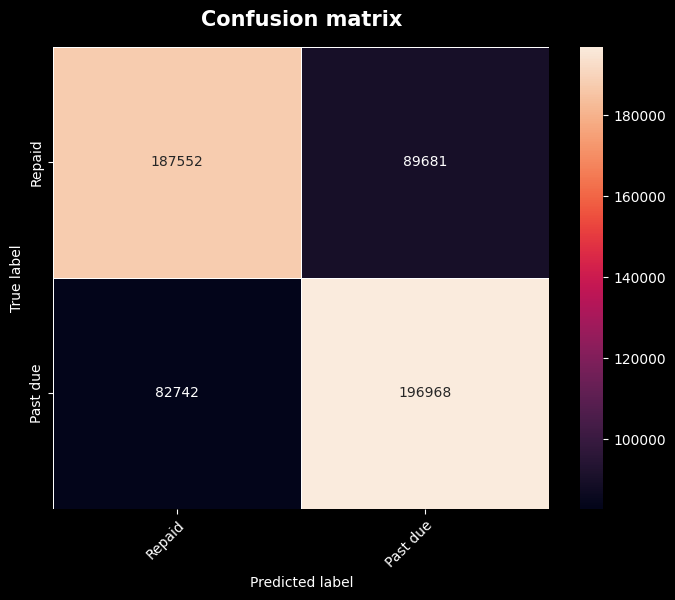


ROC AUC
overall AUC verif: 0.75362418484187


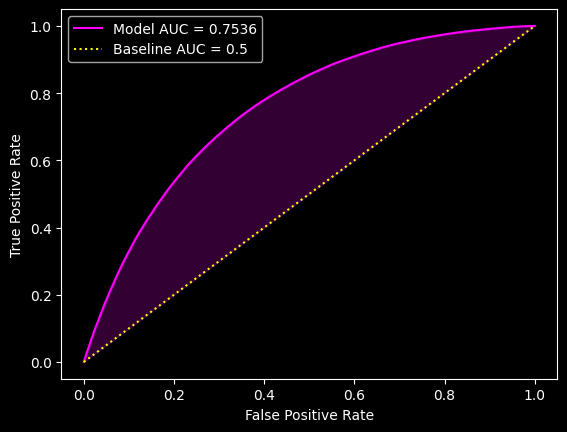


feature importances


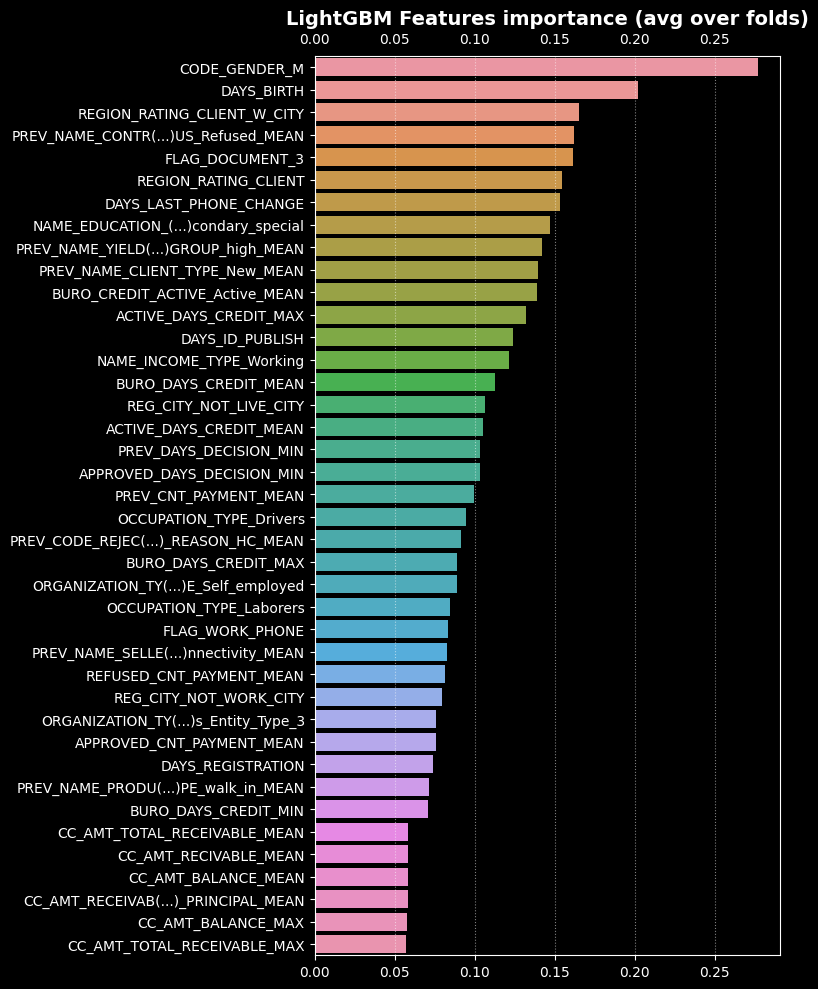

save model `logreg_baseline_default_all`


LogisticRegression(C=0.0001, random_state=42)


Train and eval `forest_baseline_default_all`


In [2]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from home_credit.lightgbm_kernel_v2 import get_opt_lgbm_classifier

from sklearn.metrics import roc_auc_score
from pepper.utils import print_subtitle, print_subsubtitle
from pepper.scoring import show_confusion_matrix
from home_credit.best_model_search import plot_roc_curve
from home_credit.lightgbm_kernel_v2 import display_importances

from home_credit.load import load_prep_dataset
from home_credit.best_model_search import kfold_train_and_eval_model
from home_credit.persist import save_model  #, load_model

data_version = "baseline"
params_version = "default"
sample_version = "all"
data = load_prep_dataset("baseline_v1")
#sample_10k = data.sample(10_000)

clfs = {
    "logreg": LogisticRegression(C=1e-4, random_state=42),
    "forest": RandomForestClassifier(
        n_estimators=100, random_state=42,
        verbose=1, n_jobs=-1
    ),
    "lgbm": get_opt_lgbm_classifier()
}

for clf_name, clf in clfs.items():
    model_name = f"{clf_name}_{data_version}_{params_version}_{sample_version}"
    print_subtitle(f"Train and eval `{model_name}`")

    res = kfold_train_and_eval_model(
        data, clf,
        verbosity=0,
        return_trained_clf=True
    )

    print_subsubtitle("Confusion matrix")
    y_train = res["resamples"]["y_train"]
    train_pred_discr = res["preds"]["train"]["discr"]
    show_confusion_matrix(y_train, train_pred_discr, ["Repaid", "Past due"])

    print_subsubtitle("ROC AUC")
    train_pred_proba = res["preds"]["train"]["proba"]
    overall_auc = res["scores"]['AUC']['overall']
    print("overall AUC verif:", roc_auc_score(y_train, train_pred_proba))
    plot_roc_curve(y_train, train_pred_proba, overall_auc)

    print_subsubtitle("feature importances")
    feat_imps = res["feat_imps"]
    selected_best_feats = display_importances(feat_imps)

    print(f"save model `{model_name}`")
    save_model(clf, model_name)
    display(clf)


Confusion matrix


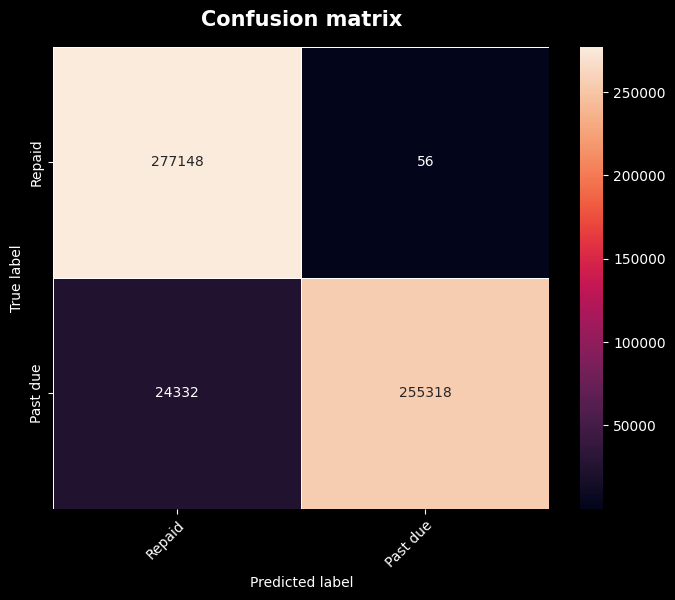


ROC AUC
overall AUC verif: 0.9844903260352663


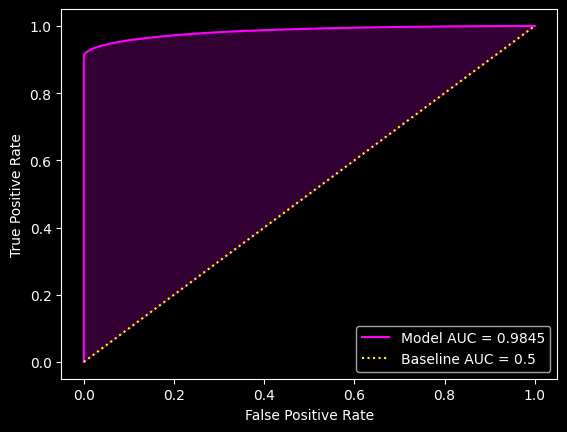


feature importances


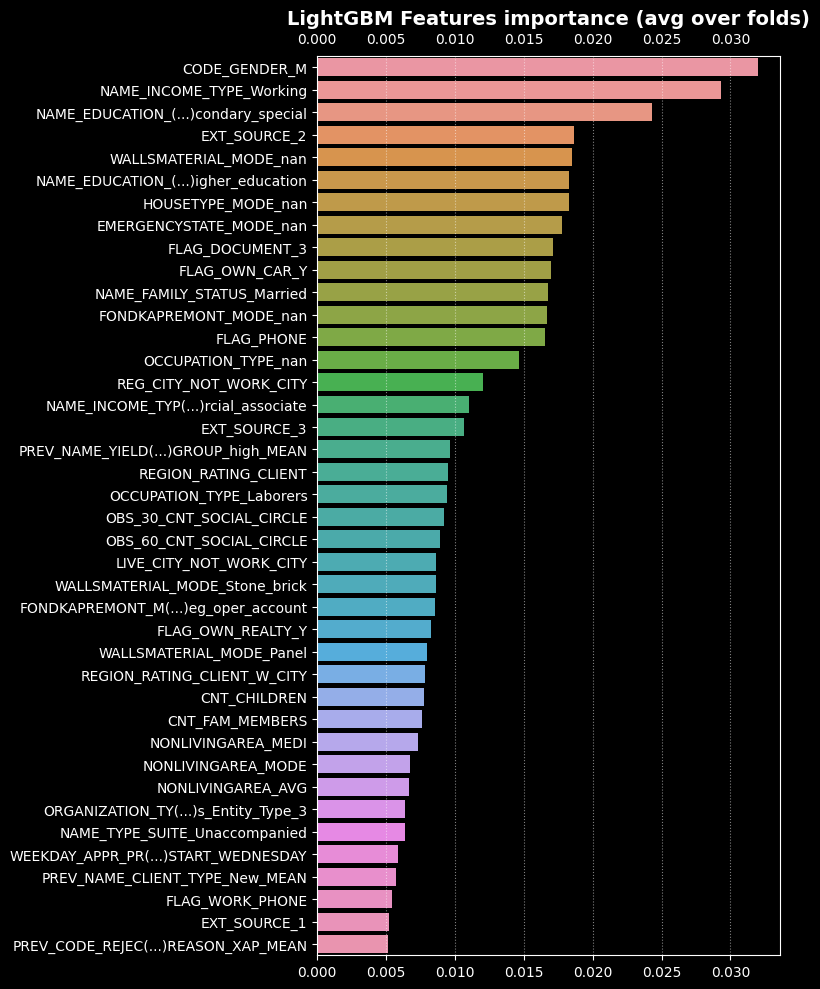

save model `forest_baseline_default_all`


RandomForestClassifier(n_jobs=-1, random_state=42, verbose=1)

In [4]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from home_credit.lightgbm_kernel_v2 import get_opt_lgbm_classifier

from sklearn.metrics import roc_auc_score
from pepper.utils import print_subtitle, print_subsubtitle
from pepper.scoring import show_confusion_matrix
from home_credit.best_model_search import plot_roc_curve
from home_credit.lightgbm_kernel_v2 import display_importances

from home_credit.load import load_prep_dataset
from home_credit.best_model_search import kfold_train_and_eval_model
from home_credit.persist import save_model  #, load_model
from pepper.utils import cls

data_version = "baseline"
params_version = "default"
sample_version = "all"
data = load_prep_dataset("baseline_v1")
#sample_10k = data.sample(10_000)

"""clfs = {
    # "logreg": LogisticRegression(C=1e-4, random_state=42),
    "forest": RandomForestClassifier(
        n_estimators=100, random_state=42,
        verbose=1, n_jobs=-1
    ),
    #"lgbm": get_opt_lgbm_classifier()
}"""
clf_name = "forest"
clf = RandomForestClassifier(
    n_estimators=100, random_state=42,
    verbose=1, n_jobs=-1
)

#for clf_name, clf in clfs.items():
model_name = f"{clf_name}_{data_version}_{params_version}_{sample_version}"
print_subtitle(f"Train and eval `{model_name}`")

res = kfold_train_and_eval_model(
    data, clf,
    verbosity=0,
    return_trained_clf=True
)

cls()

print_subsubtitle("Confusion matrix")
y_train = res["resamples"]["y_train"]
train_pred_discr = res["preds"]["train"]["discr"]
show_confusion_matrix(y_train, train_pred_discr, ["Repaid", "Past due"])

print_subsubtitle("ROC AUC")
train_pred_proba = res["preds"]["train"]["proba"]
overall_auc = res["scores"]['AUC']['overall']
print("overall AUC verif:", roc_auc_score(y_train, train_pred_proba))
plot_roc_curve(y_train, train_pred_proba, overall_auc)

print_subsubtitle("feature importances")
feat_imps = res["feat_imps"]
selected_best_feats = display_importances(feat_imps)

print(f"save model `{model_name}`")
save_model(clf, model_name)
display(clf)

In [5]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from home_credit.lightgbm_kernel_v2 import get_opt_lgbm_classifier

from sklearn.metrics import roc_auc_score
from pepper.utils import print_subtitle, print_subsubtitle
from pepper.scoring import show_confusion_matrix
from home_credit.best_model_search import plot_roc_curve
from home_credit.lightgbm_kernel_v2 import display_importances

from home_credit.load import load_prep_dataset
from home_credit.best_model_search import kfold_train_and_eval_model
from home_credit.persist import save_model  #, load_model
from pepper.utils import cls

data_version = "baseline"
params_version = "default"
sample_version = "all"
data = load_prep_dataset("baseline_v1")
#sample_10k = data.sample(10_000)

"""clfs = {
    # "logreg": LogisticRegression(C=1e-4, random_state=42),
    "forest": RandomForestClassifier(
        n_estimators=100, random_state=42,
        verbose=1, n_jobs=-1
    ),
    #"lgbm": get_opt_lgbm_classifier()
}"""
clf_name = "lgbm"
clf = get_opt_lgbm_classifier()

#for clf_name, clf in clfs.items():
model_name = f"{clf_name}_{data_version}_{params_version}_{sample_version}"
print_subtitle(f"Train and eval `{model_name}`")

res = kfold_train_and_eval_model(
    data, clf,
    verbosity=0,
    return_trained_clf=True
)

cls()

print_subsubtitle("Confusion matrix")
y_train = res["resamples"]["y_train"]
train_pred_discr = res["preds"]["train"]["discr"]
show_confusion_matrix(y_train, train_pred_discr, ["Repaid", "Past due"])

print_subsubtitle("ROC AUC")
train_pred_proba = res["preds"]["train"]["proba"]
overall_auc = res["scores"]['AUC']['overall']
print("overall AUC verif:", roc_auc_score(y_train, train_pred_proba))
plot_roc_curve(y_train, train_pred_proba, overall_auc)

print_subsubtitle("feature importances")
feat_imps = res["feat_imps"]
selected_best_feats = display_importances(feat_imps)

print(f"save model `{model_name}`")
save_model(clf, model_name)
display(clf)


Train and eval `lgbm_baseline_default_all`


LightGBMError: bad allocation

Plantage nocturne après 340 minutes d'exécution.

Relance sur seulement un tiers de l'ensemble d'entraînement.

Niveau de verbosité 1, sans cls.

Il faudra envisager une sauvegarde en ligne des résultats intermédiaires pour ne pas tout perdre en cas de plantage.

Cela démarre avec un ArrowMemoryError: malloc of size 1653023232 failed

Par conséquent, le problème mémoire est bien lié à une dégénerescence interne de l'état de la mémoire -> un reboot s'impose.

Sur un tiers, l'exécution s'est fait en 42 minutes, ce qui est plutôt une bonne performance comparée aux temps d'exécution rencontré sur l'ensemble des données d'entraînement.

Une étude de complexité algorithmique couplée à une étude des raisons concrètes de ces contreperformances apparentes serait une exploration utile.


Train and eval `lgbm_baseline_default_third_party`
Starting train and eval of:
Labeled dataset of shape: (118752, 790)
Features set of shape: (118752, 788)
With:
Classifier: 


LGBMClassifier(callbacks=None, colsample_bytree=0.9497036, learning_rate=0.02,
               max_depth=8, min_child_weight=39.3259775,
               min_split_gain=0.0222415, n_estimators=10000, n_jobs=4,
               num_leaves=34, reg_alpha=0.041545473, reg_lambda=0.0735294,
               subsample=0.8715623)

Loss function: 


{'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

Eval metrics: 


{'F2': <function home_credit.best_model_search.<lambda>(y_valid, y_pred)>,
 'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

On 5 KFolds: 
Sampler: 


SMOTETomek()

Original dataset shape: Counter({0.0: 94392, -1.0: 16121, 1.0: 8239})
Resampled dataset shape: Counter({1.0: 93077, -1.0: 92663, 0.0: 92086})
	Train shape: (185163, 788)
	Test shape: (92663, 788)
[200]	training's binary_logloss: 0.160548	valid_1's binary_logloss: 0.163809
[400]	training's binary_logloss: 0.128226	valid_1's binary_logloss: 0.137701
[600]	training's binary_logloss: 0.117002	valid_1's binary_logloss: 0.132894
[800]	training's binary_logloss: 0.110353	valid_1's binary_logloss: 0.13132
[1000]	training's binary_logloss: 0.104809	valid_1's binary_logloss: 0.130902
[1200]	training's binary_logloss: 0.0998961	valid_1's binary_logloss: 0.130773
[1400]	training's binary_logloss: 0.0951948	valid_1's binary_logloss: 0.130603
[1600]	training's binary_logloss: 0.0910319	valid_1's binary_logloss: 0.130617
Fold  0 F2: 0.932165
Fold  0 AUC: 0.981584
[200]	training's binary_logloss: 0.160289	valid_1's binary_logloss: 0.163139
[400]	training's binary_logloss: 0.128137	valid_1's binary_log

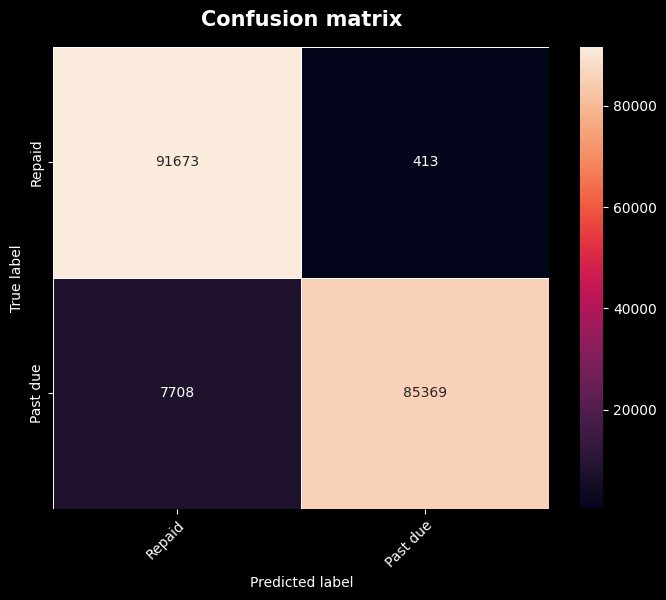


ROC AUC
overall AUC verif: 0.9813122643967453


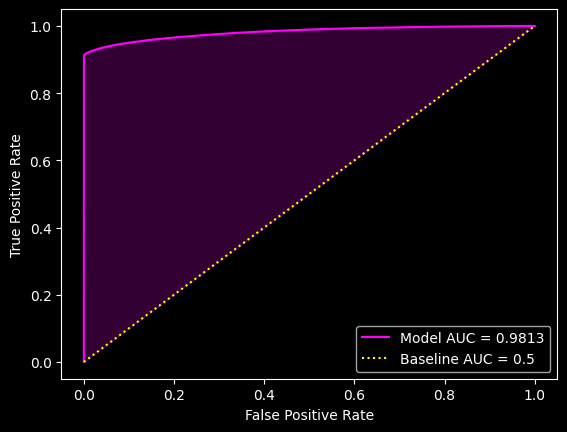


feature importances


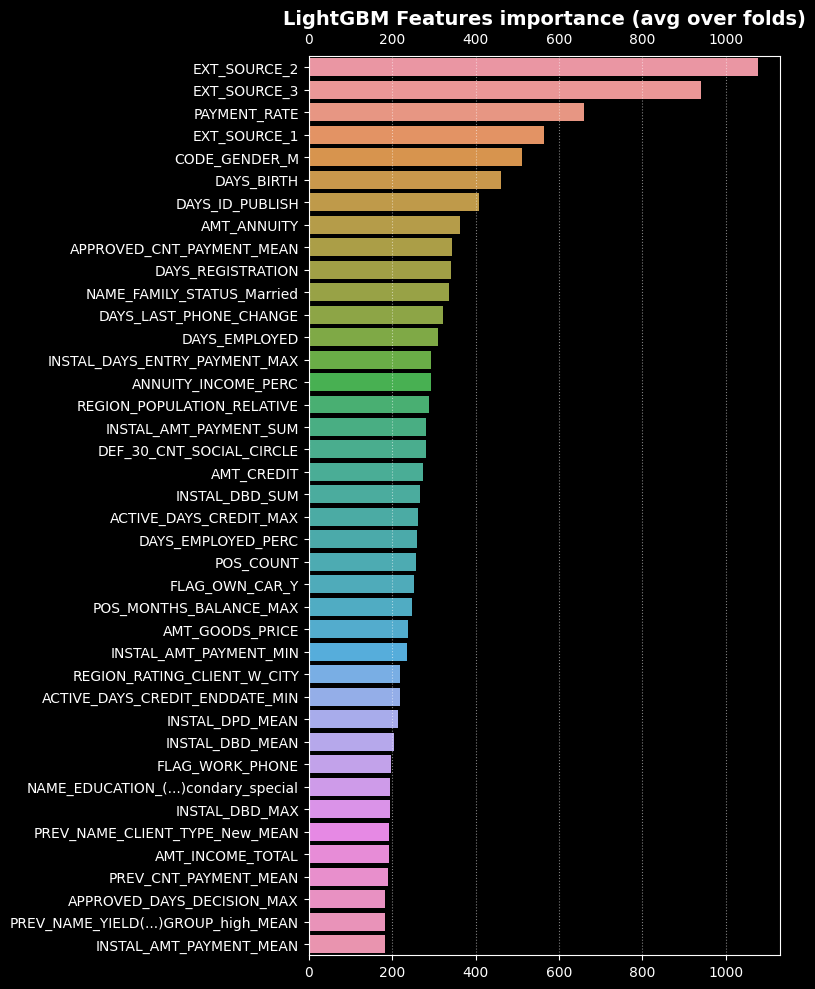

save model `lgbm_baseline_default_third_party`


LGBMClassifier(callbacks=None, colsample_bytree=0.9497036, learning_rate=0.02,
               max_depth=8, min_child_weight=39.3259775,
               min_split_gain=0.0222415, n_estimators=10000, n_jobs=4,
               num_leaves=34, reg_alpha=0.041545473, reg_lambda=0.0735294,
               subsample=0.8715623)

In [2]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from home_credit.lightgbm_kernel_v2 import get_opt_lgbm_classifier

from sklearn.metrics import roc_auc_score
from pepper.utils import print_subtitle, print_subsubtitle
from pepper.scoring import show_confusion_matrix
from home_credit.best_model_search import plot_roc_curve
from home_credit.lightgbm_kernel_v2 import display_importances

from home_credit.load import load_prep_dataset
from home_credit.best_model_search import kfold_train_and_eval_model
from home_credit.persist import save_model  #, load_model
from pepper.utils import cls

data_version = "baseline"
params_version = "default"
sample_version = "third_party"
data = load_prep_dataset("baseline_v1")
third_party_sample = data.sample(round(data.shape[0] / 3))

"""clfs = {
    # "logreg": LogisticRegression(C=1e-4, random_state=42),
    "forest": RandomForestClassifier(
        n_estimators=100, random_state=42,
        verbose=1, n_jobs=-1
    ),
    #"lgbm": get_opt_lgbm_classifier()
}"""
clf_name = "lgbm"
clf = get_opt_lgbm_classifier()

#for clf_name, clf in clfs.items():
model_name = f"{clf_name}_{data_version}_{params_version}_{sample_version}"
print_subtitle(f"Train and eval `{model_name}`")

res = kfold_train_and_eval_model(
    third_party_sample, clf,
    verbosity=1,
    return_trained_clf=True
)

# cls()

print_subsubtitle("Confusion matrix")
y_train = res["resamples"]["y_train"]
train_pred_discr = res["preds"]["train"]["discr"]
show_confusion_matrix(y_train, train_pred_discr, ["Repaid", "Past due"])

print_subsubtitle("ROC AUC")
train_pred_proba = res["preds"]["train"]["proba"]
overall_auc = res["scores"]['AUC']['overall']
print("overall AUC verif:", roc_auc_score(y_train, train_pred_proba))
plot_roc_curve(y_train, train_pred_proba, overall_auc)

print_subsubtitle("feature importances")
feat_imps = res["feat_imps"]
selected_best_feats = display_importances(feat_imps)

print(f"save model `{model_name}`")
save_model(clf, model_name)
display(clf)

Relançons sur la moitié de l'ensemble d'entraînement.


Train and eval `lgbm_baseline_default_third_party`
Starting train and eval of:
Labeled dataset of shape: (178128, 790)
Features set of shape: (178128, 788)
With:
Classifier: 


LGBMClassifier(callbacks=None, colsample_bytree=0.9497036, learning_rate=0.02,
               max_depth=8, min_child_weight=39.3259775,
               min_split_gain=0.0222415, n_estimators=10000, n_jobs=4,
               num_leaves=34, reg_alpha=0.041545473, reg_lambda=0.0735294,
               subsample=0.8715623)

Loss function: 


{'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

Eval metrics: 


{'F2': <function home_credit.best_model_search.<lambda>(y_valid, y_pred)>,
 'AUC': <function sklearn.metrics._ranking.roc_auc_score(y_true, y_score, *, average='macro', sample_weight=None, max_fpr=None, multi_class='raise', labels=None)>}

On 5 KFolds: 
Sampler: 


SMOTETomek()

Original dataset shape: Counter({0.0: 141329, -1.0: 24444, 1.0: 12355})
Resampled dataset shape: Counter({1.0: 139520, -1.0: 138970, 0.0: 138107})
	Train shape: (277627, 788)
	Test shape: (138970, 788)
[200]	training's binary_logloss: 0.160995	valid_1's binary_logloss: 0.162064
[400]	training's binary_logloss: 0.131333	valid_1's binary_logloss: 0.136832
[600]	training's binary_logloss: 0.121598	valid_1's binary_logloss: 0.131808
[800]	training's binary_logloss: 0.115742	valid_1's binary_logloss: 0.13014
[1000]	training's binary_logloss: 0.111148	valid_1's binary_logloss: 0.129348
[1200]	training's binary_logloss: 0.107369	valid_1's binary_logloss: 0.128989
[1400]	training's binary_logloss: 0.103758	valid_1's binary_logloss: 0.128772
[1600]	training's binary_logloss: 0.100357	valid_1's binary_logloss: 0.128607
[1800]	training's binary_logloss: 0.097145	valid_1's binary_logloss: 0.128508
[2000]	training's binary_logloss: 0.0942178	valid_1's binary_logloss: 0.128527
Fold  0 F2: 0.933512
F

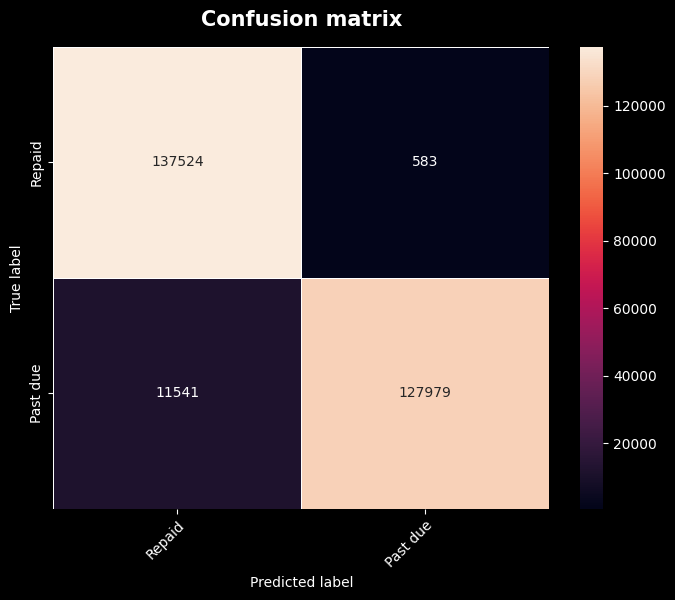


ROC AUC
overall AUC verif: 0.9814142277302376


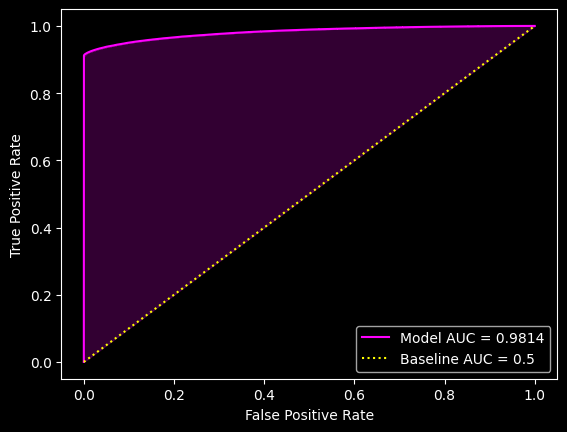


feature importances


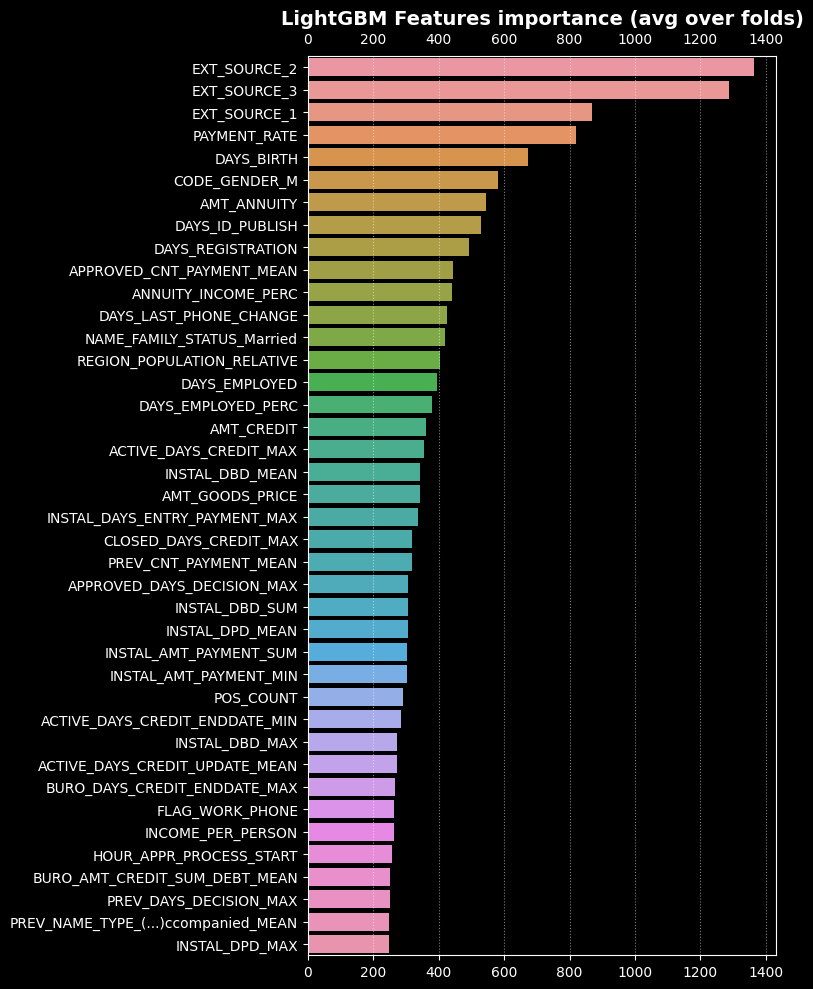

save model `lgbm_baseline_default_third_party`


LGBMClassifier(callbacks=None, colsample_bytree=0.9497036, learning_rate=0.02,
               max_depth=8, min_child_weight=39.3259775,
               min_split_gain=0.0222415, n_estimators=10000, n_jobs=4,
               num_leaves=34, reg_alpha=0.041545473, reg_lambda=0.0735294,
               subsample=0.8715623)

In [3]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from home_credit.lightgbm_kernel_v2 import get_opt_lgbm_classifier

from sklearn.metrics import roc_auc_score
from pepper.utils import print_subtitle, print_subsubtitle
from pepper.scoring import show_confusion_matrix
from home_credit.best_model_search import plot_roc_curve
from home_credit.lightgbm_kernel_v2 import display_importances

from home_credit.load import load_prep_dataset
from home_credit.best_model_search import kfold_train_and_eval_model
from home_credit.persist import save_model  #, load_model
from pepper.utils import cls

data_version = "baseline"
params_version = "default"
sample_version = "third_party"
data = load_prep_dataset("baseline_v1")
half_party_sample = data.sample(round(data.shape[0] / 2))

"""clfs = {
    # "logreg": LogisticRegression(C=1e-4, random_state=42),
    "forest": RandomForestClassifier(
        n_estimators=100, random_state=42,
        verbose=1, n_jobs=-1
    ),
    #"lgbm": get_opt_lgbm_classifier()
}"""
clf_name = "lgbm"
clf = get_opt_lgbm_classifier()

#for clf_name, clf in clfs.items():
model_name = f"{clf_name}_{data_version}_{params_version}_{sample_version}"
print_subtitle(f"Train and eval `{model_name}`")

res = kfold_train_and_eval_model(
    half_party_sample, clf,
    verbosity=1,
    return_trained_clf=True
)

# cls()

print_subsubtitle("Confusion matrix")
y_train = res["resamples"]["y_train"]
train_pred_discr = res["preds"]["train"]["discr"]
show_confusion_matrix(y_train, train_pred_discr, ["Repaid", "Past due"])

print_subsubtitle("ROC AUC")
train_pred_proba = res["preds"]["train"]["proba"]
overall_auc = res["scores"]['AUC']['overall']
print("overall AUC verif:", roc_auc_score(y_train, train_pred_proba))
plot_roc_curve(y_train, train_pred_proba, overall_auc)

print_subsubtitle("feature importances")
feat_imps = res["feat_imps"]
selected_best_feats = display_importances(feat_imps)

print(f"save model `{model_name}`")
save_model(clf, model_name)
display(clf)